# Predicting Functional Status Of Water Wells In Tanzania

Author: Vivienne DiFrancesco

# Introduction

<b>Goal:</b> The purpose of this project is to use machine learning classification models to predict the functional status of water wells in Tanzania. The different status groups for classification are functional, non functional, and functional but needs repair. The hope is that by predicting the functional status of a well, access to water could be improved across Tanzania.
 
<b>Data:</b> The data used for this project is from the Data Driven website where, at the time of completing this project, it is an active competition. The dataset contains nearly 60,000 records of water wells across Tanzania. Each record has information that includes various location data, technical specifications of the well, information about the water, etc. The website provides a list of the features contained and a brief description of each. The list is included here for reference. The link to the website to obtain the data for yourself is: https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/

You can also access the .csv files from the "Data" folder of this repository.

Column Descriptions: 
- amount_tsh - Total static head (amount water available to waterpoint)
- date_recorded - The date the row was entered
- funder - Who funded the well
- gps_height - Altitude of the well
- installer - Organization that installed the well
- longitude - GPS coordinate
- latitude - GPS coordinate
- wpt_name - Name of the waterpoint if there is one
- num_private -
- basin - Geographic water basin
- subvillage - Geographic location
- region - Geographic location
- region_code - Geographic location (coded)
- district_code - Geographic location (coded)
- lga - Geographic location
- ward - Geographic location
- population - Population around the well
- public_meeting - True/False
- recorded_by - Group entering this row of data
- scheme_management - Who operates the waterpoint
- scheme_name - Who operates the waterpoint
- permit - If the waterpoint is permitted
- construction_year - Year the waterpoint was constructed
- extraction_type - The kind of extraction the waterpoint uses
- extraction_type_group - The kind of extraction the waterpoint uses
- extraction_type_class - The kind of extraction the waterpoint uses
- management - How the waterpoint is managed
- management_group - How the waterpoint is managed
- payment - What the water costs
- payment_type - What the water costs
- water_quality - The quality of the water
- quality_group - The quality of the water
- quantity - The quantity of water
- quantity_group - The quantity of water
- source - The source of the water
- source_type - The source of the water
- source_class - The source of the water
- waterpoint_type - The kind of waterpoint
- waterpoint_type_group - The kind of waterpoint

<b>Approach:</b> The approach for this project was to create many different model types to see what performs the best and to compare and contrast the different types of models. The way the data was preprocessed with feature engineering, filling missing values, and scaling was done with the goal of increasing accuracy of the models.  The OSEMiN process is the overarching structure of this project. 

<b>Methods:</b> For each type of model, a model was first trained and fitted with default parameters as a base. Then, key parameters were chosen to tune using sklearn GridSearchCV and the best parameters were used to run the model. Finally, the tuned parameters were used to fit the same model using the dataset after SMOTE had been performed. This was partially a practical choice, as grid search tuning takes a lot of time and SMOTE adds extra rows to the data which would add extra time. But another purpose was to evaluate the difference in performance with SMOTE data versus using the class weight parameter. Performance was compared to the base model of each type, as well as between different model types. 

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Predicting-Functional-Status-Of-Water-Wells-In-Tanzania" data-toc-modified-id="Predicting-Functional-Status-Of-Water-Wells-In-Tanzania-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Predicting Functional Status Of Water Wells In Tanzania</a></span></li><li><span><a href="#Introduction" data-toc-modified-id="Introduction-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Introduction</a></span></li><li><span><a href="#OBTAIN" data-toc-modified-id="OBTAIN-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>OBTAIN</a></span><ul class="toc-item"><li><span><a href="#Competition-Predictions" data-toc-modified-id="Competition-Predictions-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Competition Predictions</a></span></li></ul></li><li><span><a href="#SCRUB" data-toc-modified-id="SCRUB-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>SCRUB</a></span><ul class="toc-item"><li><span><a href="#Exploring-column-values" data-toc-modified-id="Exploring-column-values-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Exploring column values</a></span></li><li><span><a href="#Train-Test-Split" data-toc-modified-id="Train-Test-Split-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Train Test Split</a></span></li><li><span><a href="#Filling-Zero-Values" data-toc-modified-id="Filling-Zero-Values-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Filling Zero Values</a></span><ul class="toc-item"><li><span><a href="#Latitude-and-Longitude" data-toc-modified-id="Latitude-and-Longitude-4.3.1"><span class="toc-item-num">4.3.1&nbsp;&nbsp;</span>Latitude and Longitude</a></span></li><li><span><a href="#Year-Built" data-toc-modified-id="Year-Built-4.3.2"><span class="toc-item-num">4.3.2&nbsp;&nbsp;</span>Year Built</a></span></li></ul></li><li><span><a href="#Feature-Engineering" data-toc-modified-id="Feature-Engineering-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Feature Engineering</a></span><ul class="toc-item"><li><span><a href="#Water-Quality-Lab" data-toc-modified-id="Water-Quality-Lab-4.4.1"><span class="toc-item-num">4.4.1&nbsp;&nbsp;</span>Water Quality Lab</a></span></li><li><span><a href="#Water-Lab-Distance" data-toc-modified-id="Water-Lab-Distance-4.4.2"><span class="toc-item-num">4.4.2&nbsp;&nbsp;</span>Water Lab Distance</a></span></li><li><span><a href="#Closest-City" data-toc-modified-id="Closest-City-4.4.3"><span class="toc-item-num">4.4.3&nbsp;&nbsp;</span>Closest City</a></span></li><li><span><a href="#Closest-City-Distance" data-toc-modified-id="Closest-City-Distance-4.4.4"><span class="toc-item-num">4.4.4&nbsp;&nbsp;</span>Closest City Distance</a></span></li></ul></li><li><span><a href="#Creating-Buckets" data-toc-modified-id="Creating-Buckets-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Creating Buckets</a></span><ul class="toc-item"><li><span><a href="#Funder" data-toc-modified-id="Funder-4.5.1"><span class="toc-item-num">4.5.1&nbsp;&nbsp;</span>Funder</a></span></li><li><span><a href="#Installer" data-toc-modified-id="Installer-4.5.2"><span class="toc-item-num">4.5.2&nbsp;&nbsp;</span>Installer</a></span></li></ul></li></ul></li><li><span><a href="#EXPLORE" data-toc-modified-id="EXPLORE-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>EXPLORE</a></span></li><li><span><a href="#MODEL-PREPARATION" data-toc-modified-id="MODEL-PREPARATION-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>MODEL PREPARATION</a></span><ul class="toc-item"><li><span><a href="#One-Hot-Encode" data-toc-modified-id="One-Hot-Encode-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>One Hot Encode</a></span></li><li><span><a href="#Scaling" data-toc-modified-id="Scaling-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Scaling</a></span></li><li><span><a href="#SMOTENC" data-toc-modified-id="SMOTENC-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>SMOTENC</a></span></li><li><span><a href="#Model-Evaluation-Function" data-toc-modified-id="Model-Evaluation-Function-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span>Model Evaluation Function</a></span></li><li><span><a href="#Dummy-Model" data-toc-modified-id="Dummy-Model-6.5"><span class="toc-item-num">6.5&nbsp;&nbsp;</span>Dummy Model</a></span></li></ul></li><li><span><a href="#LOGISTIC-REGRESSION" data-toc-modified-id="LOGISTIC-REGRESSION-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>LOGISTIC REGRESSION</a></span><ul class="toc-item"><li><span><a href="#Base-Model" data-toc-modified-id="Base-Model-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Base Model</a></span></li><li><span><a href="#Elastic-Net" data-toc-modified-id="Elastic-Net-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>Elastic Net</a></span></li><li><span><a href="#Grid-Search" data-toc-modified-id="Grid-Search-7.3"><span class="toc-item-num">7.3&nbsp;&nbsp;</span>Grid Search</a></span></li><li><span><a href="#SMOTE-Model" data-toc-modified-id="SMOTE-Model-7.4"><span class="toc-item-num">7.4&nbsp;&nbsp;</span>SMOTE Model</a></span></li><li><span><a href="#Inferences" data-toc-modified-id="Inferences-7.5"><span class="toc-item-num">7.5&nbsp;&nbsp;</span>Inferences</a></span></li></ul></li><li><span><a href="#RANDOM-FOREST" data-toc-modified-id="RANDOM-FOREST-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>RANDOM FOREST</a></span><ul class="toc-item"><li><span><a href="#Base-Model" data-toc-modified-id="Base-Model-8.1"><span class="toc-item-num">8.1&nbsp;&nbsp;</span>Base Model</a></span></li><li><span><a href="#Grid-Search" data-toc-modified-id="Grid-Search-8.2"><span class="toc-item-num">8.2&nbsp;&nbsp;</span>Grid Search</a></span></li><li><span><a href="#SMOTE-Model" data-toc-modified-id="SMOTE-Model-8.3"><span class="toc-item-num">8.3&nbsp;&nbsp;</span>SMOTE Model</a></span></li><li><span><a href="#Inferences" data-toc-modified-id="Inferences-8.4"><span class="toc-item-num">8.4&nbsp;&nbsp;</span>Inferences</a></span></li></ul></li><li><span><a href="#EXTRA-TREES" data-toc-modified-id="EXTRA-TREES-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>EXTRA TREES</a></span><ul class="toc-item"><li><span><a href="#Base-Model" data-toc-modified-id="Base-Model-9.1"><span class="toc-item-num">9.1&nbsp;&nbsp;</span>Base Model</a></span></li><li><span><a href="#Grid-Search" data-toc-modified-id="Grid-Search-9.2"><span class="toc-item-num">9.2&nbsp;&nbsp;</span>Grid Search</a></span></li><li><span><a href="#SMOTE-Model" data-toc-modified-id="SMOTE-Model-9.3"><span class="toc-item-num">9.3&nbsp;&nbsp;</span>SMOTE Model</a></span></li><li><span><a href="#Inferences" data-toc-modified-id="Inferences-9.4"><span class="toc-item-num">9.4&nbsp;&nbsp;</span>Inferences</a></span></li></ul></li><li><span><a href="#ADABOOSTING" data-toc-modified-id="ADABOOSTING-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>ADABOOSTING</a></span><ul class="toc-item"><li><span><a href="#Base-Model" data-toc-modified-id="Base-Model-10.1"><span class="toc-item-num">10.1&nbsp;&nbsp;</span>Base Model</a></span></li><li><span><a href="#Grid-Search" data-toc-modified-id="Grid-Search-10.2"><span class="toc-item-num">10.2&nbsp;&nbsp;</span>Grid Search</a></span></li><li><span><a href="#SMOTE-Model" data-toc-modified-id="SMOTE-Model-10.3"><span class="toc-item-num">10.3&nbsp;&nbsp;</span>SMOTE Model</a></span></li><li><span><a href="#Inferences" data-toc-modified-id="Inferences-10.4"><span class="toc-item-num">10.4&nbsp;&nbsp;</span>Inferences</a></span></li></ul></li><li><span><a href="#XGBOOST" data-toc-modified-id="XGBOOST-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>XGBOOST</a></span><ul class="toc-item"><li><span><a href="#Base-Model" data-toc-modified-id="Base-Model-11.1"><span class="toc-item-num">11.1&nbsp;&nbsp;</span>Base Model</a></span></li><li><span><a href="#Grid-Search" data-toc-modified-id="Grid-Search-11.2"><span class="toc-item-num">11.2&nbsp;&nbsp;</span>Grid Search</a></span></li><li><span><a href="#SMOTE-Model" data-toc-modified-id="SMOTE-Model-11.3"><span class="toc-item-num">11.3&nbsp;&nbsp;</span>SMOTE Model</a></span></li><li><span><a href="#Inferences" data-toc-modified-id="Inferences-11.4"><span class="toc-item-num">11.4&nbsp;&nbsp;</span>Inferences</a></span></li></ul></li><li><span><a href="#LINEAR-SVM" data-toc-modified-id="LINEAR-SVM-12"><span class="toc-item-num">12&nbsp;&nbsp;</span>LINEAR SVM</a></span><ul class="toc-item"><li><span><a href="#Base-Model" data-toc-modified-id="Base-Model-12.1"><span class="toc-item-num">12.1&nbsp;&nbsp;</span>Base Model</a></span></li><li><span><a href="#Grid-Search" data-toc-modified-id="Grid-Search-12.2"><span class="toc-item-num">12.2&nbsp;&nbsp;</span>Grid Search</a></span></li><li><span><a href="#SMOTE-Model" data-toc-modified-id="SMOTE-Model-12.3"><span class="toc-item-num">12.3&nbsp;&nbsp;</span>SMOTE Model</a></span></li><li><span><a href="#Inferences" data-toc-modified-id="Inferences-12.4"><span class="toc-item-num">12.4&nbsp;&nbsp;</span>Inferences</a></span></li></ul></li><li><span><a href="#POLYNOMIAL-SVM" data-toc-modified-id="POLYNOMIAL-SVM-13"><span class="toc-item-num">13&nbsp;&nbsp;</span>POLYNOMIAL SVM</a></span><ul class="toc-item"><li><span><a href="#Base-Model" data-toc-modified-id="Base-Model-13.1"><span class="toc-item-num">13.1&nbsp;&nbsp;</span>Base Model</a></span></li><li><span><a href="#Grid-Search" data-toc-modified-id="Grid-Search-13.2"><span class="toc-item-num">13.2&nbsp;&nbsp;</span>Grid Search</a></span></li><li><span><a href="#SMOTE-Model" data-toc-modified-id="SMOTE-Model-13.3"><span class="toc-item-num">13.3&nbsp;&nbsp;</span>SMOTE Model</a></span></li><li><span><a href="#Inferences" data-toc-modified-id="Inferences-13.4"><span class="toc-item-num">13.4&nbsp;&nbsp;</span>Inferences</a></span></li></ul></li><li><span><a href="#STACKING" data-toc-modified-id="STACKING-14"><span class="toc-item-num">14&nbsp;&nbsp;</span>STACKING</a></span><ul class="toc-item"><li><span><a href="#Balanced-Classes" data-toc-modified-id="Balanced-Classes-14.1"><span class="toc-item-num">14.1&nbsp;&nbsp;</span>Balanced Classes</a></span></li><li><span><a href="#SMOTE" data-toc-modified-id="SMOTE-14.2"><span class="toc-item-num">14.2&nbsp;&nbsp;</span>SMOTE</a></span></li><li><span><a href="#Inferences" data-toc-modified-id="Inferences-14.3"><span class="toc-item-num">14.3&nbsp;&nbsp;</span>Inferences</a></span></li></ul></li><li><span><a href="#INTERPRETATION" data-toc-modified-id="INTERPRETATION-15"><span class="toc-item-num">15&nbsp;&nbsp;</span>INTERPRETATION</a></span><ul class="toc-item"><li><span><a href="#Elastic-Net" data-toc-modified-id="Elastic-Net-15.1"><span class="toc-item-num">15.1&nbsp;&nbsp;</span>Elastic Net</a></span></li><li><span><a href="#Feature-Importance-Between-Models" data-toc-modified-id="Feature-Importance-Between-Models-15.2"><span class="toc-item-num">15.2&nbsp;&nbsp;</span>Feature Importance Between Models</a></span></li><li><span><a href="#Adaboost-Feature-Importance" data-toc-modified-id="Adaboost-Feature-Importance-15.3"><span class="toc-item-num">15.3&nbsp;&nbsp;</span>Adaboost Feature Importance</a></span></li><li><span><a href="#Important-Features-Plotted" data-toc-modified-id="Important-Features-Plotted-15.4"><span class="toc-item-num">15.4&nbsp;&nbsp;</span>Important Features Plotted</a></span></li></ul></li><li><span><a href="#FINAL-RECOMMENDATIONS" data-toc-modified-id="FINAL-RECOMMENDATIONS-16"><span class="toc-item-num">16&nbsp;&nbsp;</span>FINAL RECOMMENDATIONS</a></span></li><li><span><a href="#FUTURE-DIRECTIONS" data-toc-modified-id="FUTURE-DIRECTIONS-17"><span class="toc-item-num">17&nbsp;&nbsp;</span>FUTURE DIRECTIONS</a></span></li></ul></div>

# OBTAIN

In [1]:
import numpy as np
np.random.seed(123)

C:\Users\drudi\Anaconda3\envs\learn-env\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\drudi\Anaconda3\envs\learn-env\lib\site-packages\numpy\.libs\libopenblas.NOIJJG62EMASZI6NYURL6JBKM4EVBGM7.gfortran-win_amd64.dll
C:\Users\drudi\Anaconda3\envs\learn-env\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
  stacklevel=1)


In [2]:
# Importing libraries that I will use
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from scipy.spatial import distance

# Setting default seaborn setting for my visuals
sns.set(style="whitegrid")

# Supressing warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Setting pandas to display max columns and rows
pd.set_option('display.max_columns', 0)
pd.set_option('display.max_rows', None)

# Setting inf values to be nan
pd.set_option('mode.use_inf_as_na', True)

# Turning off scientific notation in pandas
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [4]:
# This will cause the project functions py file to keep refreshed
%load_ext autoreload
%autoreload 2

In [5]:
# Loading in the custom project functions and some tools to look at them
import project_functions as pf
import inspect
from IPython.display import Markdown, display

In [6]:
# Opening the features and label files that were downloaded from the website
values = pd.read_csv('Data/TrainingSetValues.csv', index_col='id')
labels = pd.read_csv('Data/TrainingSetLabels.csv', index_col='id')

In [7]:
# Combining the features and labels into one dataframe
df = pd.concat([values, labels], axis=1)

In [8]:
# Checking the shape
df.shape

(59400, 40)

In [9]:
# Checking out the dataframe
df.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69572,6000.000,2011-03-14,Roman,1390,Roman,34.938,-9.856,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
8776,0.000,2013-03-06,Grumeti,1399,GRUMETI,34.699,-2.147,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
34310,25.000,2013-02-25,Lottery Club,686,World vision,37.461,-3.821,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
67743,0.000,2013-01-28,Unicef,263,UNICEF,38.486,-11.155,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
19728,0.000,2011-07-13,Action In A,0,Artisan,31.131,-1.825,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


## Competition Predictions

The Data Driven website has the .csv file to download of the wells to predict for the competition. This file does not contain labels since it will need to be run through the model at the end to predict them. The predictions will be submitted to the website to see how many are correct. 

You can also access the .csv file from the "Data" folder of this repository.

In [10]:
# Turning the competition labels that were downloaded from the website 
# into a dataframe
compdf = pd.read_csv('Data/TestSetValues.csv', index_col='id')

In [11]:
# Checking the shape
compdf.shape

(14850, 39)

In [12]:
# Taking a look at the dataframe
compdf.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
50785,0.000,2013-02-04,Dmdd,1996,DMDD,35.291,-4.060,Dinamu Secondary School,0,Internal,Magoma,Manyara,21,3,Mbulu,Bashay,321,True,GeoData Consultants Ltd,Parastatal,NaN,True,2012,other,other,other,parastatal,parastatal,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
51630,0.000,2013-02-04,Government Of Tanzania,1569,DWE,36.657,-3.309,Kimnyak,0,Pangani,Kimnyak,Arusha,2,2,Arusha Rural,Kimnyaki,300,True,GeoData Consultants Ltd,VWC,TPRI pipe line,True,2000,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
17168,0.000,2013-02-01,NaN,1567,NaN,34.768,-5.004,Puma Secondary,0,Internal,Msatu,Singida,13,2,Singida Rural,Puma,500,True,GeoData Consultants Ltd,VWC,P,NaN,2010,other,other,other,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
45559,0.000,2013-01-22,Finn Water,267,FINN WATER,38.058,-9.419,Kwa Mzee Pange,0,Ruvuma / Southern Coast,Kipindimbi,Lindi,80,43,Liwale,Mkutano,250,NaN,GeoData Consultants Ltd,VWC,NaN,True,1987,other,other,other,vwc,user-group,unknown,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
49871,500.000,2013-03-27,Bruder,1260,BRUDER,35.006,-10.950,Kwa Mzee Turuka,0,Ruvuma / Southern Coast,Losonga,Ruvuma,10,3,Mbinga,Mbinga Urban,60,NaN,GeoData Consultants Ltd,Water Board,BRUDER,True,2000,gravity,gravity,gravity,water board,user-group,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


# SCRUB

The scrubbing process began with looking at the values in each column. Null values and zero values were investigated. The columns were judged for usefulness and the unnecessary columns were dropped. Some columns were also dropped because there were columns that were nearly duplicate information. In those cases the columns with the most explicit or least empty values was kept while the other was dropped. A train-test-split was done early to prevent any data leakage when filling in values. Feature engineering was also done including adding distances to cities and water treatment facilities. This data was collected from the Tanzanian Ministry of Water website.  Some features had the most common values kept while the rest were bucketed into an "other" category for practicality.

## Exploring column values

The first step is getting to know the columns and values which will help to get a feel for the data and what is being represented in each feature. Rogue or strange values is also being watched for.

In [13]:
# Looking at datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 69572 to 26348
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             59400 non-null  float64
 1   date_recorded          59400 non-null  object 
 2   funder                 55765 non-null  object 
 3   gps_height             59400 non-null  int64  
 4   installer              55745 non-null  object 
 5   longitude              59400 non-null  float64
 6   latitude               59400 non-null  float64
 7   wpt_name               59400 non-null  object 
 8   num_private            59400 non-null  int64  
 9   basin                  59400 non-null  object 
 10  subvillage             59029 non-null  object 
 11  region                 59400 non-null  object 
 12  region_code            59400 non-null  int64  
 13  district_code          59400 non-null  int64  
 14  lga                    59400 non-null  object 
 15

In [14]:
# Looking at datatypes
compdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14850 entries, 50785 to 68707
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             14850 non-null  float64
 1   date_recorded          14850 non-null  object 
 2   funder                 13981 non-null  object 
 3   gps_height             14850 non-null  int64  
 4   installer              13973 non-null  object 
 5   longitude              14850 non-null  float64
 6   latitude               14850 non-null  float64
 7   wpt_name               14850 non-null  object 
 8   num_private            14850 non-null  int64  
 9   basin                  14850 non-null  object 
 10  subvillage             14751 non-null  object 
 11  region                 14850 non-null  object 
 12  region_code            14850 non-null  int64  
 13  district_code          14850 non-null  int64  
 14  lga                    14850 non-null  object 
 15

In [15]:
# Checking null values in the columns
df.isna().sum()

amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_group                0
quantity

In [16]:
# Checking null values in the columns
compdf.isna().sum()

amount_tsh                  0
date_recorded               0
funder                    869
gps_height                  0
installer                 877
longitude                   0
latitude                    0
wpt_name                    0
num_private                 0
basin                       0
subvillage                 99
region                      0
region_code                 0
district_code               0
lga                         0
ward                        0
population                  0
public_meeting            821
recorded_by                 0
scheme_management         969
scheme_name              7092
permit                    737
construction_year           0
extraction_type             0
extraction_type_group       0
extraction_type_class       0
management                  0
management_group            0
payment                     0
payment_type                0
water_quality               0
quality_group               0
quantity                    0
quantity_g

<AxesSubplot:>

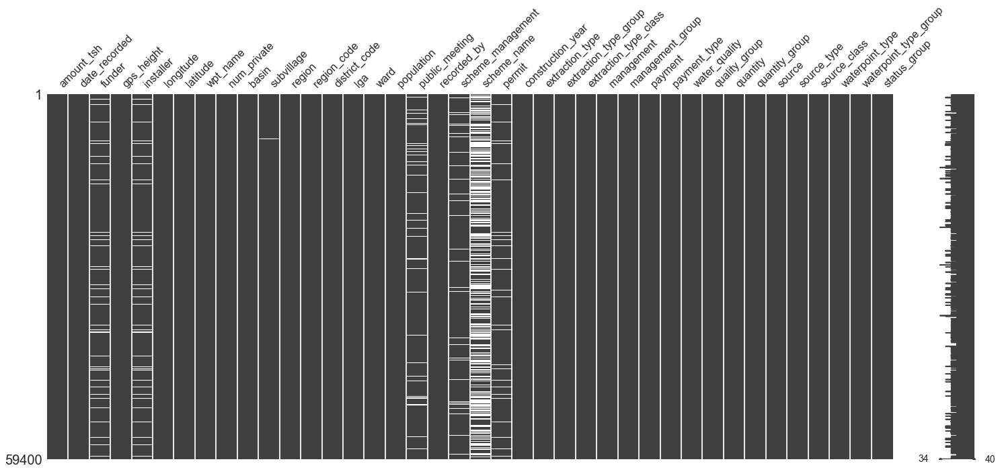

In [17]:
# Visualizing the null values
import missingno as ms
ms.matrix(df)

> From the visualization you can see that scheme_name is missing a lot of information. Funder and installer have a pattern that matches each other so the values missing in one are missing in the other.

In [18]:
# Checking some basic stats about each of the number columns
df.describe()

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000
mean,317.650,668.297,34.077,-5.706,0.474,15.297,5.630,179.910,1300.652
std,2997.575,693.116,6.567,2.946,12.236,17.587,9.634,471.482,951.621
min,0.000,-90.000,0.000,-11.649,0.000,1.000,0.000,0.000,0.000
25%,0.000,0.000,33.090,-8.541,0.000,5.000,2.000,0.000,0.000
50%,0.000,369.000,34.909,-5.022,0.000,12.000,3.000,25.000,1986.000
75%,20.000,1319.250,37.178,-3.326,0.000,17.000,5.000,215.000,2004.000
max,350000.000,2770.000,40.345,-0.000,1776.000,99.000,80.000,30500.000,2013.000


In [19]:
# There is unbalance among the classes
df.status_group.value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

There are a large amount of zero values for TSH (total static head). Some online research about TSH explains that zero is a valid possible value so it has to be assumed that the zero values are legitimate.

In [20]:
# Looking at column values
df.amount_tsh.value_counts(normalize=True)

0.000        0.701
500.000      0.052
50.000       0.042
1000.000     0.025
20.000       0.025
200.000      0.021
100.000      0.014
10.000       0.014
30.000       0.013
2000.000     0.012
250.000      0.010
300.000      0.009
5000.000     0.008
5.000        0.006
25.000       0.006
3000.000     0.006
1200.000     0.004
1500.000     0.003
6.000        0.003
600.000      0.003
4000.000     0.003
2400.000     0.002
2500.000     0.002
6000.000     0.002
7.000        0.001
8000.000     0.001
750.000      0.001
40.000       0.001
10000.000    0.001
12000.000    0.001
20000.000    0.001
3600.000     0.001
400.000      0.001
450.000      0.001
2200.000     0.001
700.000      0.000
4700.000     0.000
70.000       0.000
150.000      0.000
33.000       0.000
15000.000    0.000
60.000       0.000
15.000       0.000
2800.000     0.000
2.000        0.000
7200.000     0.000
1300.000     0.000
6500.000     0.000
25000.000    0.000
30000.000    0.000
7500.000     0.000
35.000       0.000
7000.000    

In [21]:
# Turning column data type to be an integer
df.amount_tsh = df.amount_tsh.astype('int64')
compdf.amount_tsh = compdf.amount_tsh.astype('int64')

In [22]:
# Looking at column values
df.date_recorded.value_counts()

2011-03-15    572
2011-03-17    558
2013-02-03    546
2011-03-14    520
2011-03-16    513
2011-03-18    497
2011-03-19    466
2013-02-04    464
2013-01-29    459
2011-03-04    458
2013-02-14    444
2013-01-24    435
2011-03-05    434
2013-02-15    429
2013-03-15    428
2011-03-11    426
2013-01-30    421
2013-02-16    418
2011-03-23    417
2011-03-09    416
2013-01-18    409
2011-03-30    391
2013-02-26    391
2013-03-19    381
2011-03-24    381
2013-02-13    380
2013-01-23    379
2011-03-12    379
2011-03-03    378
2013-01-28    376
2011-07-27    373
2011-03-13    373
2013-02-19    371
2013-02-02    370
2013-02-18    369
2013-01-19    368
2011-03-22    364
2013-01-22    364
2011-03-10    364
2013-02-08    363
2013-03-18    360
2012-10-22    353
2011-02-26    351
2011-03-21    351
2013-03-04    347
2013-03-13    346
2011-07-30    345
2013-01-16    342
2011-03-26    342
2011-02-28    341
2013-02-27    340
2013-01-25    338
2011-07-19    338
2013-02-01    338
2013-01-27    337
2013-02-12

In [23]:
# Dropping the column as it's not valuable information
df.drop('date_recorded', axis=1, inplace=True)
compdf.drop('date_recorded', axis=1, inplace=True)

In [24]:
# Looking at column values
df.funder.value_counts(dropna=False, normalize=True)

Government Of Tanzania           0.153
NaN                              0.061
Danida                           0.052
Hesawa                           0.037
Rwssp                            0.023
World Bank                       0.023
Kkkt                             0.022
World Vision                     0.021
Unicef                           0.018
Tasaf                            0.015
District Council                 0.014
Dhv                              0.014
Private Individual               0.014
Dwsp                             0.014
0                                0.013
Norad                            0.013
Germany Republi                  0.010
Tcrs                             0.010
Ministry Of Water                0.010
Water                            0.010
Dwe                              0.008
Netherlands                      0.008
Hifab                            0.008
Adb                              0.008
Lga                              0.007
Amref                    

In [25]:
# Filling null values with an 'other' placeholder
df.funder.fillna('other', inplace=True)
compdf.funder.fillna('other', inplace=True)

Again there are a lot of zero values for gps height (which refers to the altitude at the well), but zero is a legitimate possible value so it must be assumed that they are all legitimate.

In [26]:
# Looking at column values
df.gps_height.value_counts(dropna=False, normalize=True)

 0      0.344
-15     0.001
-16     0.001
-13     0.001
-20     0.001
 1290   0.001
-14     0.001
 303    0.001
-18     0.001
-19     0.001
 1269   0.001
 1295   0.001
 1304   0.001
-23     0.001
 280    0.001
 1538   0.001
 1286   0.001
-8      0.001
-17     0.001
 1332   0.001
 320    0.001
 1317   0.001
 1293   0.001
 1319   0.001
 1359   0.001
 1264   0.001
 1288   0.001
 1401   0.001
 1303   0.001
-27     0.001
-6      0.001
 1272   0.001
 1613   0.001
 1152   0.001
 12     0.001
-11     0.001
 309    0.001
 1602   0.001
 1342   0.001
 1323   0.001
 336    0.001
 1322   0.001
 338    0.001
 1325   0.001
 1330   0.001
-21     0.001
 1180   0.001
-2      0.001
 1311   0.001
 1240   0.001
 1271   0.001
 1384   0.001
 1307   0.001
 1597   0.001
 1314   0.001
 17     0.001
 1289   0.001
 1370   0.001
 1329   0.001
 1582   0.001
 1270   0.001
 1407   0.001
 1306   0.001
-3      0.001
 1266   0.001
 1252   0.001
 306    0.001
 1362   0.001
-7      0.001
 1161   0.001
 259    0.001
-22   

In [27]:
# Looking at column values
df.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
NaN                              0.062
Government                       0.031
RWE                              0.020
Commu                            0.018
DANIDA                           0.018
KKKT                             0.015
Hesawa                           0.014
0                                0.013
TCRS                             0.012
Central government               0.010
CES                              0.010
Community                        0.009
DANID                            0.009
District Council                 0.009
HESAWA                           0.009
LGA                              0.007
World vision                     0.007
WEDECO                           0.007
TASAF                            0.007
District council                 0.007
Gover                            0.006
AMREF                            0.006
TWESA                            0.005
WU                               0.005
Dmdd                     

In [28]:
# Filling null values with an 'other' placeholder
df.installer.fillna('other', inplace=True)
compdf.installer.fillna('other', inplace=True)

There is quite a lot of chaos in the installer column with different spellings of the same values. Some effort was made to clean up and consolidate these to make them neater, especially those that are most common. The zero values will be dealt with after the train-test-split when the lesser common values are bucketed into an "other" category. 

In [29]:
# Converging some of the different spellings of values 
df.installer = df.installer.replace({'World vision': 'World Vision', 
                      'District council': 'District Council', 
                      'Central government': 'Government',
                    'Central Government': 'Government',
                    'Gover': 'Government',
                    'KKKT _ Konde and DWE': 'KKKT',
                     'Hesawa': 'HESAWA',
                    'DANID': 'DANIDA', 'Commu':'Community'})

In [30]:
# Looking at column values for the compdf
compdf.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.059
Government                       0.031
RWE                              0.020
Commu                            0.019
DANIDA                           0.017
Hesawa                           0.015
KKKT                             0.015
0                                0.014
TCRS                             0.012
CES                              0.010
Central government               0.010
HESAWA                           0.009
DANID                            0.009
Community                        0.009
District Council                 0.008
World vision                     0.007
TASAF                            0.007
Gover                            0.007
WEDECO                           0.007
District council                 0.007
LGA                              0.006
TWESA                            0.005
WU                               0.005
AMREF                            0.005
Dmdd                     

In [31]:
# Converging some of the different spellings of values 
compdf.installer = compdf.installer.replace({'World vision': 'World Vision', 
                      'District council': 'District Council', 
                      'Central government': 'Government',
                    'Central Government': 'Government',
                    'Gover': 'Government',
                    'KKKT _ Konde and DWE': 'KKKT',
                     'Hesawa': 'HESAWA',
                    'DANID': 'DANIDA', 'Commu':'Community'})

In [32]:
# Checking to see that it is a bit tidier.
df.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.062
Government                       0.049
Community                        0.027
DANIDA                           0.027
HESAWA                           0.023
RWE                              0.020
KKKT                             0.018
District Council                 0.016
0                                0.013
TCRS                             0.012
World Vision                     0.011
CES                              0.010
LGA                              0.007
WEDECO                           0.007
TASAF                            0.007
AMREF                            0.006
TWESA                            0.005
WU                               0.005
Dmdd                             0.005
ACRA                             0.005
SEMA                             0.004
DW                               0.004
OXFAM                            0.004
Da                               0.004
UNICEF                   

In [33]:
# Checking to see that it is a bit tidier
compdf.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.059
Government                       0.049
Community                        0.028
DANIDA                           0.026
HESAWA                           0.025
RWE                              0.020
KKKT                             0.018
District Council                 0.014
0                                0.014
TCRS                             0.012
World Vision                     0.011
CES                              0.010
TASAF                            0.007
WEDECO                           0.007
LGA                              0.006
TWESA                            0.005
WU                               0.005
Dmdd                             0.005
AMREF                            0.005
ACRA                             0.005
UNICEF                           0.004
Villagers                        0.004
Da                               0.004
SEMA                             0.004
DW                       

There are a lot of zero values for latitude and longitude which are not possible for Tanzania's location. The zero values will be dealt after the train-test-split to avoid data leakage. They will be filled based on other entries with similar values in the other location based features.

In [34]:
# Looking at column values 
df.longitude.value_counts(dropna=False)

0.000     1812
37.541       2
33.011       2
39.093       2
32.973       2
33.006       2
39.104       2
37.543       2
36.802       2
39.098       2
33.090       2
33.005       2
32.978       2
39.089       2
31.620       2
39.093       2
39.105       2
32.937       2
32.988       2
39.091       2
37.314       2
32.985       2
39.091       2
37.274       2
32.920       2
37.531       2
32.956       2
39.099       2
32.989       2
32.988       2
32.993       2
37.298       2
37.252       2
32.983       2
39.096       2
37.533       2
39.096       2
37.374       2
37.319       2
37.376       2
38.181       2
39.086       2
39.092       2
37.269       2
39.104       2
32.994       2
37.250       2
39.096       2
39.099       2
37.281       2
39.101       2
39.095       2
39.092       2
32.926       2
37.539       2
37.542       2
37.340       2
37.329       2
37.543       2
32.957       2
32.967       2
39.086       2
37.534       2
39.086       2
32.966       2
39.090       2
32.925    

In [35]:
# Looking at column values
df.latitude.value_counts(dropna=False)

-0.000     1812
-6.986        2
-3.798        2
-6.982        2
-7.105        2
-7.057        2
-7.175        2
-6.991        2
-6.979        2
-6.995        2
-2.495        2
-6.964        2
-2.507        2
-6.991        2
-2.485        2
-2.494        2
-6.962        2
-6.989        2
-6.957        2
-6.959        2
-6.993        2
-6.991        2
-7.177        2
-2.502        2
-1.793        2
-7.102        2
-2.467        2
-2.517        2
-7.095        2
-6.981        2
-6.980        2
-7.177        2
-6.990        2
-2.480        2
-6.964        2
-6.957        2
-2.465        2
-6.978        2
-6.975        2
-6.978        2
-2.504        2
-6.964        2
-2.490        2
-6.976        2
-2.520        2
-2.464        2
-6.984        2
-7.105        2
-2.515        2
-7.094        2
-7.065        2
-2.496        2
-2.517        2
-6.982        2
-7.104        2
-6.983        2
-2.529        2
-9.289        2
-6.980        2
-2.492        2
-2.487        2
-2.489        2
-2.511  

In [36]:
# Looking at column values
df.wpt_name.value_counts(dropna=False, normalize=True)

none                             0.060
Shuleni                          0.029
Zahanati                         0.014
Msikitini                        0.009
Kanisani                         0.005
Bombani                          0.005
Sokoni                           0.004
Ofisini                          0.004
School                           0.004
Shule Ya Msingi                  0.003
Shule                            0.003
Sekondari                        0.002
Muungano                         0.002
Mkombozi                         0.002
Madukani                         0.002
Hospital                         0.002
Mbugani                          0.002
Upendo                           0.002
Kituo Cha Afya                   0.002
Mkuyuni                          0.001
Umoja                            0.001
Center                           0.001
Ccm                              0.001
Kisimani                         0.001
Ofisi Ya Kijiji                  0.001
Mtakuja                  

In [37]:
# Removing the column as there is no value in this column
df.drop('wpt_name', axis=1, inplace=True)
compdf.drop('wpt_name', axis=1, inplace=True)

In [38]:
# Looking at column values
df.num_private.value_counts(dropna=False, normalize=True)

0      0.987
6      0.001
1      0.001
5      0.001
8      0.001
32     0.001
45     0.001
15     0.001
39     0.001
93     0.000
3      0.000
7      0.000
2      0.000
65     0.000
47     0.000
102    0.000
4      0.000
17     0.000
80     0.000
20     0.000
25     0.000
11     0.000
41     0.000
34     0.000
16     0.000
120    0.000
150    0.000
22     0.000
12     0.000
24     0.000
50     0.000
38     0.000
58     0.000
9      0.000
10     0.000
14     0.000
61     0.000
27     0.000
26     0.000
160    0.000
30     0.000
698    0.000
60     0.000
1402   0.000
450    0.000
668    0.000
131    0.000
35     0.000
672    0.000
42     0.000
136    0.000
87     0.000
300    0.000
280    0.000
141    0.000
62     0.000
111    0.000
240    0.000
1776   0.000
755    0.000
180    0.000
213    0.000
23     0.000
55     0.000
94     0.000
Name: num_private, dtype: float64

In [39]:
# Removing the column as there is no value in this column
df.drop('num_private', axis=1, inplace=True)
compdf.drop('num_private', axis=1, inplace=True)

In [40]:
# Looking at column values
df.basin.value_counts(dropna=False, normalize=True)

Lake Victoria             0.173
Pangani                   0.151
Rufiji                    0.134
Internal                  0.131
Lake Tanganyika           0.108
Wami / Ruvu               0.101
Lake Nyasa                0.086
Ruvuma / Southern Coast   0.076
Lake Rukwa                0.041
Name: basin, dtype: float64

In [41]:
# Looking at column values
df.subvillage.value_counts(dropna=False, normalize=True)

Madukani                         0.009
Shuleni                          0.009
Majengo                          0.008
Kati                             0.006
NaN                              0.006
Mtakuja                          0.004
Sokoni                           0.004
M                                0.003
Muungano                         0.003
Mbuyuni                          0.003
Mlimani                          0.003
Songambele                       0.002
Msikitini                        0.002
Miembeni                         0.002
1                                0.002
Kibaoni                          0.002
Kanisani                         0.002
Mapinduzi                        0.002
I                                0.002
Mjimwema                         0.002
Mjini                            0.002
Mkwajuni                         0.002
Mwenge                           0.002
Mabatini                         0.002
Azimio                           0.002
Mission                  

In [42]:
# Removing the column as there is no value in this column
df.drop('subvillage', axis=1, inplace=True)
compdf.drop('subvillage', axis=1, inplace=True)

In [43]:
# Looking at column values
df.region.value_counts(dropna=False, normalize=True)

Iringa          0.089
Shinyanga       0.084
Mbeya           0.078
Kilimanjaro     0.074
Morogoro        0.067
Arusha          0.056
Kagera          0.056
Mwanza          0.052
Kigoma          0.047
Ruvuma          0.044
Pwani           0.044
Tanga           0.043
Dodoma          0.037
Singida         0.035
Mara            0.033
Tabora          0.033
Rukwa           0.030
Mtwara          0.029
Manyara         0.027
Lindi           0.026
Dar es Salaam   0.014
Name: region, dtype: float64

In [44]:
# Looking at column values
df.region_code.value_counts(dropna=False, normalize=True)

11   0.089
17   0.084
12   0.078
3    0.074
5    0.068
18   0.056
19   0.051
2    0.051
16   0.047
10   0.044
4    0.042
1    0.037
13   0.035
14   0.033
20   0.033
15   0.030
6    0.027
21   0.027
80   0.021
60   0.017
90   0.015
7    0.014
99   0.007
9    0.007
24   0.005
8    0.005
40   0.000
Name: region_code, dtype: float64

In [45]:
# Removing the column as there is no value in this column
df.drop('region_code', axis=1, inplace=True)
compdf.drop('region_code', axis=1, inplace=True)

In [46]:
# Looking at column values
df.district_code.value_counts(dropna=False, normalize=True)

1    0.205
2    0.188
3    0.168
4    0.151
5    0.073
6    0.069
7    0.056
8    0.018
30   0.017
33   0.015
53   0.013
43   0.009
13   0.007
23   0.005
63   0.003
62   0.002
60   0.001
0    0.000
80   0.000
67   0.000
Name: district_code, dtype: float64

In [47]:
# Removing the column as there is no value in this column
df.drop('district_code', axis=1, inplace=True)
compdf.drop('district_code', axis=1, inplace=True)

In [48]:
# Looking at column values
df.lga.value_counts(dropna=False, normalize=True)

Njombe             0.042
Arusha Rural       0.021
Moshi Rural        0.021
Bariadi            0.020
Rungwe             0.019
Kilosa             0.018
Kasulu             0.018
Mbozi              0.017
Meru               0.017
Bagamoyo           0.017
Singida Rural      0.017
Kilombero          0.016
Same               0.015
Kibondo            0.015
Kyela              0.014
Kahama             0.014
Magu               0.014
Kigoma Rural       0.014
Maswa              0.014
Karagwe            0.013
Mbinga             0.013
Iringa Rural       0.012
Serengeti          0.012
Lushoto            0.012
Namtumbo           0.012
Songea Rural       0.012
Mpanda             0.011
Mvomero            0.011
Ngara              0.011
Ulanga             0.011
Makete             0.011
Kwimba             0.011
Mbarali            0.011
Hai                0.011
Rombo              0.010
Shinyanga Rural    0.010
Nzega              0.010
Ludewa             0.009
Mkuranga           0.009
Iramba             0.009


In [49]:
# Looking at column values
df.ward.value_counts(dropna=False)

Igosi                      307
Imalinyi                   252
Siha Kati                  232
Mdandu                     231
Nduruma                    217
Mishamo                    203
Kitunda                    203
Msindo                     201
Chalinze                   196
Maji ya Chai               190
Usuka                      187
Ngarenanyuki               172
Chanika                    171
Vikindu                    162
Mtwango                    153
Matola                     145
Zinga/Ikerege              141
Maramba                    139
Wanging'ombe               139
Itete                      137
Magomeni                   135
Ifakara                    134
Kikatiti                   134
Olkokola                   133
Maposeni                   130
Igongolo                   129
Mvomero                    129
Mlangali                   125
Nkoma                      122
Mahongole                  121
Nkungulu                   121
Rujewa                     120
Simbo   

In [50]:
# Removing the column as it is basically a repeat of lga
df.drop('ward', axis=1, inplace=True)
compdf.drop('ward', axis=1, inplace=True)

The zero population values will be left as there is no indication that the area population around a well can't be zero.

In [51]:
# Looking at column values
df.population.value_counts(dropna=False, normalize=True)

0       0.360
1       0.118
200     0.033
150     0.032
250     0.028
300     0.025
100     0.019
50      0.019
500     0.017
350     0.017
120     0.015
400     0.013
60      0.012
30      0.011
40      0.009
80      0.009
450     0.008
20      0.008
600     0.007
230     0.007
75      0.005
1000    0.005
800     0.005
90      0.004
130     0.004
25      0.004
320     0.004
35      0.004
360     0.004
140     0.004
210     0.004
70      0.004
45      0.003
15      0.003
700     0.003
1500    0.003
180     0.003
650     0.003
65      0.003
1200    0.003
10      0.003
420     0.003
240     0.003
750     0.003
56      0.003
2000    0.002
160     0.002
260     0.002
55      0.002
125     0.002
96      0.002
540     0.002
560     0.002
280     0.002
550     0.002
86      0.002
380     0.001
98      0.001
340     0.001
220     0.001
170     0.001
270     0.001
85      0.001
900     0.001
520     0.001
256     0.001
530     0.001
110     0.001
950     0.001
145     0.001
156     0.001
89    

In [52]:
# Looking at column values
df.public_meeting.value_counts(dropna=False, normalize=True)

True    0.859
False   0.085
NaN     0.056
Name: public_meeting, dtype: float64

In [53]:
# Looking at column values
compdf.public_meeting.value_counts(dropna=False, normalize=True)

True    0.858
False   0.087
NaN     0.055
Name: public_meeting, dtype: float64

In [54]:
# Filling null values with an unknown placeholder
df.public_meeting.fillna('unknown', inplace=True)
compdf.public_meeting.fillna('unknown', inplace=True)

In [55]:
# Changing all the values to be strings and not boolean
df.public_meeting = df.public_meeting.astype('str')
compdf.public_meeting = compdf.public_meeting.astype('str')

In [56]:
# Changing the values to yes and no 
df['public_meeting'] = df['public_meeting'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})
compdf['public_meeting'] = compdf['public_meeting'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})

In [57]:
# Looking at column values
df.recorded_by.value_counts(dropna=False, normalize=True)

GeoData Consultants Ltd   1.000
Name: recorded_by, dtype: float64

In [58]:
# Dropping the column since all the values are the same
df.drop('recorded_by', axis=1, inplace=True)
compdf.drop('recorded_by', axis=1, inplace=True)

In [59]:
# Looking at column values
df.scheme_management.value_counts(dropna=False, normalize=True)

VWC                0.619
WUG                0.088
NaN                0.065
Water authority    0.053
WUA                0.049
Water Board        0.046
Parastatal         0.028
Private operator   0.018
Company            0.018
Other              0.013
SWC                0.002
Trust              0.001
None               0.000
Name: scheme_management, dtype: float64

In [60]:
# Filling null values with an "other" placeholder
df.scheme_management.fillna('Other', inplace=True)
compdf.scheme_management.fillna('Other', inplace=True)

In [61]:
# Looking at column values
df.scheme_name.value_counts(dropna=False, normalize=True)

NaN                                              0.474
K                                                0.011
None                                             0.011
Borehole                                         0.009
Chalinze wate                                    0.007
M                                                0.007
DANIDA                                           0.006
Government                                       0.005
Ngana water supplied scheme                      0.005
wanging'ombe water supply s                      0.004
wanging'ombe supply scheme                       0.004
Bagamoyo wate                                    0.004
I                                                0.004
Uroki-Bomang'ombe water sup                      0.004
N                                                0.003
Kirua kahe gravity water supply trust            0.003
Machumba estate pipe line                        0.003
Makwale water supplied sche                      0.003
Kijiji    

In [62]:
# Dropping the column as there is no value
df.drop('scheme_name', axis=1, inplace=True)
compdf.drop('scheme_name', axis=1, inplace=True)

In [63]:
# Looking at column values
df.permit.value_counts(dropna=False, normalize=True)

True    0.654
False   0.294
NaN     0.051
Name: permit, dtype: float64

In [64]:
# Filling null values with "unknown" placeholder
df.permit.fillna('unknown', inplace=True)
compdf.permit.fillna('unknown', inplace=True)

In [65]:
# Changing the data type to be a string instead of boolean
df.permit = df.permit.astype('str')
compdf.permit = compdf.permit.astype('str')

In [66]:
# Changing the values to yes and no 
df['permit'] = df['permit'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})
compdf['permit'] = compdf['permit'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})

In [67]:
# Looking at column values, zeros will be dealt with after train-test-split
df.construction_year.value_counts(dropna=False, normalize=True)

0      0.349
2010   0.045
2008   0.044
2009   0.043
2000   0.035
2007   0.027
2006   0.025
2003   0.022
2011   0.021
2004   0.019
2012   0.018
2002   0.018
1978   0.017
1995   0.017
2005   0.017
1999   0.016
1998   0.016
1990   0.016
1985   0.016
1980   0.014
1996   0.014
1984   0.013
1982   0.013
1994   0.012
1972   0.012
1974   0.011
1997   0.011
1992   0.011
1993   0.010
2001   0.009
1988   0.009
1983   0.008
1975   0.007
1986   0.007
1976   0.007
1970   0.007
1991   0.005
1989   0.005
1987   0.005
1981   0.004
1977   0.003
1979   0.003
1973   0.003
2013   0.003
1971   0.002
1960   0.002
1967   0.001
1963   0.001
1968   0.001
1969   0.001
1964   0.001
1962   0.001
1961   0.000
1965   0.000
1966   0.000
Name: construction_year, dtype: float64

In [68]:
# Looking at column values
df.extraction_type.value_counts(dropna=False, normalize=True)

gravity                     0.451
nira/tanira                 0.137
other                       0.108
submersible                 0.080
swn 80                      0.062
mono                        0.048
india mark ii               0.040
afridev                     0.030
ksb                         0.024
other - rope pump           0.008
other - swn 81              0.004
windmill                    0.002
india mark iii              0.002
cemo                        0.002
other - play pump           0.001
walimi                      0.001
climax                      0.001
other - mkulima/shinyanga   0.000
Name: extraction_type, dtype: float64

In [69]:
# Looking at column values
df.extraction_type_group.value_counts(dropna=False, normalize=True)

gravity           0.451
nira/tanira       0.137
other             0.108
submersible       0.104
swn 80            0.062
mono              0.048
india mark ii     0.040
afridev           0.030
rope pump         0.008
other handpump    0.006
other motorpump   0.002
wind-powered      0.002
india mark iii    0.002
Name: extraction_type_group, dtype: float64

In [70]:
# Looking at column values
df.extraction_type_class.value_counts(dropna=False, normalize=True)

gravity        0.451
handpump       0.277
other          0.108
submersible    0.104
motorpump      0.050
rope pump      0.008
wind-powered   0.002
Name: extraction_type_class, dtype: float64

In [71]:
# Dropping the columns that contain nearly duplicate information
df.drop(columns=['extraction_type_group', 'extraction_type_class'], 
        inplace=True)
compdf.drop(columns=['extraction_type_group', 'extraction_type_class'], 
            inplace=True)

In [72]:
# Looking at column values
df.management.value_counts(dropna=False, normalize=True)

vwc                0.682
wug                0.110
water board        0.049
wua                0.043
private operator   0.033
parastatal         0.030
water authority    0.015
other              0.014
company            0.012
unknown            0.009
other - school     0.002
trust              0.001
Name: management, dtype: float64

In [73]:
# Looking at column values
df.management_group.value_counts(dropna=False, normalize=True)

user-group   0.884
commercial   0.061
parastatal   0.030
other        0.016
unknown      0.009
Name: management_group, dtype: float64

In [74]:
# Dropping column that is mostly dupicate information
df.drop('management_group', axis=1, inplace=True)
compdf.drop('management_group', axis=1, inplace=True)

In [75]:
# Looking at column values
df.payment.value_counts(dropna=False, normalize=True)

never pay               0.427
pay per bucket          0.151
pay monthly             0.140
unknown                 0.137
pay when scheme fails   0.066
pay annually            0.061
other                   0.018
Name: payment, dtype: float64

In [76]:
# Looking at column values
df.payment_type.value_counts(dropna=False, normalize=True)

never pay    0.427
per bucket   0.151
monthly      0.140
unknown      0.137
on failure   0.066
annually     0.061
other        0.018
Name: payment_type, dtype: float64

In [77]:
# Dropping column that is mostly dupicate information
df.drop('payment', axis=1, inplace=True)
compdf.drop('payment', axis=1, inplace=True)

In [78]:
# Looking at column values
df.water_quality.value_counts(dropna=False, normalize=True)

soft                 0.856
salty                0.082
unknown              0.032
milky                0.014
coloured             0.008
salty abandoned      0.006
fluoride             0.003
fluoride abandoned   0.000
Name: water_quality, dtype: float64

In [79]:
# Looking at column values
df.quality_group.value_counts(dropna=False, normalize=True)

good       0.856
salty      0.087
unknown    0.032
milky      0.014
colored    0.008
fluoride   0.004
Name: quality_group, dtype: float64

In [80]:
# Dropping column that is mostly dupicate information
df.drop('quality_group', axis=1, inplace=True)
compdf.drop('quality_group', axis=1, inplace=True)

In [81]:
# Looking at column values
df.quantity.value_counts(dropna=False, normalize=True)

enough         0.559
insufficient   0.255
dry            0.105
seasonal       0.068
unknown        0.013
Name: quantity, dtype: float64

In [82]:
# Looking at column values
df.quantity_group.value_counts(dropna=False, normalize=True)

enough         0.559
insufficient   0.255
dry            0.105
seasonal       0.068
unknown        0.013
Name: quantity_group, dtype: float64

In [83]:
# Dropping column that is dupicate information
df.drop('quantity_group', axis=1, inplace=True)
compdf.drop('quantity_group', axis=1, inplace=True)

In [84]:
# Looking at column values
df.source.value_counts(dropna=False, normalize=True)

spring                 0.287
shallow well           0.283
machine dbh            0.186
river                  0.162
rainwater harvesting   0.039
hand dtw               0.015
lake                   0.013
dam                    0.011
other                  0.004
unknown                0.001
Name: source, dtype: float64

In [85]:
# Looking at column values
df.source_type.value_counts(dropna=False, normalize=True)

spring                 0.287
shallow well           0.283
borehole               0.201
river/lake             0.175
rainwater harvesting   0.039
dam                    0.011
other                  0.005
Name: source_type, dtype: float64

In [86]:
# Dropping column that is dupicate information
df.drop('source_type', axis=1, inplace=True)
compdf.drop('source_type', axis=1, inplace=True)

In [87]:
# Looking at column values
df.source_class.value_counts(dropna=False, normalize=True)

groundwater   0.771
surface       0.224
unknown       0.005
Name: source_class, dtype: float64

In [88]:
# Dropping column that is dupicate information
df.drop('source_class', axis=1, inplace=True)
compdf.drop('source_class', axis=1, inplace=True)

In [89]:
# Looking at column values
df.waterpoint_type.value_counts(dropna=False, normalize=True)

communal standpipe            0.480
hand pump                     0.294
other                         0.107
communal standpipe multiple   0.103
improved spring               0.013
cattle trough                 0.002
dam                           0.000
Name: waterpoint_type, dtype: float64

In [90]:
# Looking at column values
df.waterpoint_type_group.value_counts(dropna=False, normalize=True)

communal standpipe   0.583
hand pump            0.294
other                0.107
improved spring      0.013
cattle trough        0.002
dam                  0.000
Name: waterpoint_type_group, dtype: float64

In [91]:
# Dropping column that is dupicate information
df.drop('waterpoint_type_group', axis=1, inplace=True)
compdf.drop('waterpoint_type_group', axis=1, inplace=True)

In [92]:
# Checking that the shapes of the dataframes are right
print(df.shape)
print(compdf.shape)

(59400, 22)
(14850, 21)


In [93]:
# Looking at columns and datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 69572 to 26348
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   amount_tsh         59400 non-null  int64  
 1   funder             59400 non-null  object 
 2   gps_height         59400 non-null  int64  
 3   installer          59400 non-null  object 
 4   longitude          59400 non-null  float64
 5   latitude           59400 non-null  float64
 6   basin              59400 non-null  object 
 7   region             59400 non-null  object 
 8   lga                59400 non-null  object 
 9   population         59400 non-null  int64  
 10  public_meeting     59400 non-null  object 
 11  scheme_management  59400 non-null  object 
 12  permit             59400 non-null  object 
 13  construction_year  59400 non-null  int64  
 14  extraction_type    59400 non-null  object 
 15  management         59400 non-null  object 
 16  payment_type      

In [94]:
# Looking that columns and datatypes match
compdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14850 entries, 50785 to 68707
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   amount_tsh         14850 non-null  int64  
 1   funder             14850 non-null  object 
 2   gps_height         14850 non-null  int64  
 3   installer          14850 non-null  object 
 4   longitude          14850 non-null  float64
 5   latitude           14850 non-null  float64
 6   basin              14850 non-null  object 
 7   region             14850 non-null  object 
 8   lga                14850 non-null  object 
 9   population         14850 non-null  int64  
 10  public_meeting     14850 non-null  object 
 11  scheme_management  14850 non-null  object 
 12  permit             14850 non-null  object 
 13  construction_year  14850 non-null  int64  
 14  extraction_type    14850 non-null  object 
 15  management         14850 non-null  object 
 16  payment_type      

In [95]:
# Verifying that there are no null values
df.isna().sum()

amount_tsh           0
funder               0
gps_height           0
installer            0
longitude            0
latitude             0
basin                0
region               0
lga                  0
population           0
public_meeting       0
scheme_management    0
permit               0
construction_year    0
extraction_type      0
management           0
payment_type         0
water_quality        0
quantity             0
source               0
waterpoint_type      0
status_group         0
dtype: int64

In [96]:
# Verifying that there are no null values
compdf.isna().sum()

amount_tsh           0
funder               0
gps_height           0
installer            0
longitude            0
latitude             0
basin                0
region               0
lga                  0
population           0
public_meeting       0
scheme_management    0
permit               0
construction_year    0
extraction_type      0
management           0
payment_type         0
water_quality        0
quantity             0
source               0
waterpoint_type      0
dtype: int64

## Train Test Split

Any filling of values or transforming of data that relies on looking at other data points in the dataframe will be performed after the train-test-split to avoid data leakage between the test and training sets.

In [97]:
# Import the module
from sklearn.model_selection import train_test_split

In [98]:
# Define X and y as the features and the target
X = df.drop('status_group', axis=1)
y = df['status_group'].map({'functional': 0, 'non functional': 2, 
                            'functional needs repair': 1})

In [99]:
# Perform train test split keeping the same ratios of the target class
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, 
                                                random_state=123, stratify=y)

In [100]:
# Looking at the resulting shapes
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(50490, 21)
(8910, 21)
(50490,)
(8910,)


In [101]:
# Checking the distribution of the training set classes
y_train.value_counts(normalize=True)

0   0.543
2   0.384
1   0.073
Name: status_group, dtype: float64

In [102]:
# Checking the distribution of the test set classes
y_test.value_counts(normalize=True)

0   0.543
2   0.384
1   0.073
Name: status_group, dtype: float64

## Filling Zero Values

### Latitude and Longitude

There are zero values for latitude and longitude which is not possible for Tanzania. The entries with zeros in latitude were the same as those with missing latitude. The values were filled using the average latitude and longitude for the other nearest wells in order to get the most accurate numbers possible.

In [103]:
# Looking at function
func = inspect.getsource(pf.fix_lat)
display(Markdown("```python\n"+func+"\n```"))

```python
def fix_lat(x, df):
    '''
    Fill the zero latitude values in the data with the average latitude of
    other wells that are in the same area. Ignores entries that are not zero.
    This function must be run before longitude as it depends on the longitude
    values being zero to fill the latitude appropriately.
    
    Args:
        x (row): Datapoint of a dataframe
        df (dataframe): Dataframe that the function is referencing from
    
    Returns:
        Mean latitude: Average latitude value for non-zero valued wells in the
            same area as input datapoint
    Example: 
        df['latitude'] = df.apply(fix_lat, axis=1, args=([X_train]))
    '''
    
    # Leaves the latitude the same if latitude value is not zero    
    if x['longitude'] != 0: 
        lat = x['latitude']
        return lat 
    
    # Drill down to look for entries from the same region and lga(if possible)
    # Find the mean of the similar entries, not including those that are zero
    else:
        lga = x['lga']
        region = x['region']
        tempdf = df[(df['lga'] == lga) & (df['longitude'] !=0)]
        
        if tempdf.shape[0] != 0:
            lat_mean = tempdf['latitude'].mean()
            
        # Find similar entries by region if lga can't be matched            
        else:
            tempdf = df[(df['region'] == region) & 
                             (df['longitude'] !=0)]
            lat_mean = tempdf['latitude'].mean()
            
        return lat_mean

```

In [104]:
X_train['latitude'] = X_train.apply(pf.fix_lat, axis=1, args=([X_train]))
X_test['latitude'] = X_test.apply(pf.fix_lat, axis=1, args=([X_train]))
compdf['latitude'] = compdf.apply(pf.fix_lat, axis=1, args=([X_train]))

In [105]:
# Verifying the function ran
X_train['latitude'].value_counts()

-2.964     838
-2.619     421
-2.571     270
-6.984       2
-7.078       2
-6.979       2
-2.529       2
-7.175       2
-2.502       2
-7.105       2
-2.504       2
-2.490       2
-2.489       2
-6.983       2
-6.975       2
-2.520       2
-6.964       2
-2.517       2
-6.982       2
-6.993       2
-6.964       2
-2.492       2
-2.496       2
-6.983       2
-2.467       2
-2.477       2
-2.511       2
-6.978       2
-6.960       2
-2.487       2
-6.980       2
-7.056       2
-6.991       2
-9.289       2
-6.980       2
-6.990       2
-6.991       2
-2.464       2
-6.976       2
-6.976       2
-2.507       2
-3.342       2
-6.981       2
-7.065       2
-2.495       2
-6.982       2
-7.057       2
-7.105       2
-2.517       2
-7.102       2
-10.986      1
-3.196       1
-10.287      1
-10.588      1
-4.194       1
-3.177       1
-3.805       1
-4.622       1
-3.066       1
-9.266       1
-5.157       1
-9.127       1
-4.015       1
-5.308       1
-1.601       1
-1.292       1
-9.400    

In [106]:
# Looking at function
func = inspect.getsource(pf.fix_long)
display(Markdown("```python\n"+func+"\n```"))

```python
def fix_long(x, df):
    '''
    Fill the zero longitude values in the data with the average longitude of
    other wells that are in the same area. Ignores entries that are not zero.
    
    Args:
        x (row): Datapoint of a dataframe
        df (dataframe): Dataframe that the function is referencing from
    
    Returns:
        Mean longitude: Average longitude value for non-zero valued wells in 
            the same area as input datapoint
    Example: 
        df['longitude'] = df.apply(fix_long, axis=1, args=([X_train]))
    '''
    
    # Leaves the longitude the same if longitude value is not zero
    if x['longitude'] != 0:
        long = x['longitude']
        return long
    
    # Drill down to look for entries from the same region and lga(if possible)
    # Find the mean of the similar entries, not including those that are zero    
    else:
        lga = x['lga']
        region = x['region']
        tempdf = df[(df['lga'] == lga) & (df['longitude'] !=0)]
        
        if tempdf.shape[0] != 0:
            long_mean = tempdf['longitude'].mean()
        
        # Find similar entries by region if lga can't be matched
        else:
            tempdf = df[(df['region'] == region) & 
                             (df['longitude'] !=0)]
            long_mean = tempdf['longitude'].mean()
            
        return long_mean

```

In [107]:
# Applying the longitude filling function to the dataframes
X_train['longitude'] = X_train.apply(pf.fix_long, axis=1, args=([X_train]))
X_test['longitude'] = X_test.apply(pf.fix_long, axis=1, args=([X_train]))
compdf['longitude'] = compdf.apply(pf.fix_long, axis=1, args=([X_train]))

In [108]:
# Verifying the function ran
X_train['longitude'].value_counts()

34.169    838
33.087    421
33.292    270
39.105      2
39.096      2
39.099      2
39.096      2
37.376      2
37.340      2
32.989      2
37.250      2
39.086      2
39.096      2
32.977      2
37.329      2
37.541      2
39.095      2
32.937      2
32.920      2
33.006      2
37.269      2
39.091      2
37.374      2
32.967      2
37.274      2
33.005      2
39.092      2
38.341      2
32.988      2
39.091      2
32.956      2
39.086      2
32.994      2
39.093      2
37.543      2
39.092      2
39.101      2
33.016      2
37.531      2
32.966      2
37.298      2
32.988      2
33.090      2
32.973      2
32.926      2
39.098      2
32.993      2
39.089      2
32.985      2
39.104      2
36.704      1
37.038      1
36.802      1
31.423      1
38.890      1
36.557      1
35.895      1
38.982      1
32.639      1
37.659      1
34.259      1
33.633      1
32.867      1
33.636      1
34.662      1
33.232      1
31.798      1
32.045      1
35.550      1
35.486      1
36.100      1
37.655

### Year Built

In [109]:
# Looking at the zero values
X_train.construction_year.value_counts()

0       17619
2010     2250
2008     2229
2009     2147
2000     1783
2007     1318
2006     1244
2003     1079
2011     1064
2004      968
2012      928
2002      910
1978      890
1995      871
2005      857
1985      810
1999      807
1998      805
1990      802
1996      703
1980      695
1984      671
1994      623
1982      619
1972      589
1974      565
1992      542
1997      541
1993      514
2001      448
1988      443
1983      430
1986      393
1975      379
1976      362
1970      350
1991      277
1989      266
1987      258
1981      202
1977      169
1979      168
1973      160
2013      159
1971      117
1960       86
1967       82
1963       74
1968       66
1969       50
1964       32
1962       27
1961       20
1965       17
1966       12
Name: construction_year, dtype: int64

In [110]:
# Defining the median year, excluding zero values
yr_median = int(X_train[X_train['construction_year'] != 0]['construction_year'].median())

# Filling zeros with the median
X_train['construction_year'].replace(0, yr_median, inplace=True)
X_test['construction_year'].replace(0, yr_median, inplace=True)
compdf['construction_year'].replace(0, yr_median, inplace=True)

In [111]:
# Checking that zeros were filled
X_train.construction_year.value_counts(dropna=False)

2000    19402
2010     2250
2008     2229
2009     2147
2007     1318
2006     1244
2003     1079
2011     1064
2004      968
2012      928
2002      910
1978      890
1995      871
2005      857
1985      810
1999      807
1998      805
1990      802
1996      703
1980      695
1984      671
1994      623
1982      619
1972      589
1974      565
1992      542
1997      541
1993      514
2001      448
1988      443
1983      430
1986      393
1975      379
1976      362
1970      350
1991      277
1989      266
1987      258
1981      202
1977      169
1979      168
1973      160
2013      159
1971      117
1960       86
1967       82
1963       74
1968       66
1969       50
1964       32
1962       27
1961       20
1965       17
1966       12
Name: construction_year, dtype: int64

In [112]:
# Checking that zeros were filled
X_test.construction_year.value_counts(dropna=False)

2000    3398
2010     395
2009     386
2008     384
2007     269
2006     227
2003     207
2011     192
1999     172
2002     165
1998     161
2012     156
2004     155
2005     154
1990     152
1978     147
1995     143
1985     135
1982     125
1972     119
1980     116
1994     115
1974     111
1984     108
1996     108
1997     103
1992      98
1993      94
2001      92
1988      78
1970      61
1975      58
1983      58
1976      52
1989      50
1991      47
1987      44
1986      41
1981      36
1977      33
1971      28
1979      24
1973      24
2013      17
1960      16
1963      11
1968      11
1969       9
1964       8
1967       6
1966       5
1962       3
1965       2
1961       1
Name: construction_year, dtype: int64

In [113]:
# Checking that zeros were filled
compdf.construction_year.value_counts(dropna=False)

2000    5747
2010     669
2009     663
2008     630
2006     421
2007     373
2011     335
2004     294
2003     293
1995     269
2002     268
2005     264
2012     263
1999     243
1985     232
1978     230
1998     224
1990     222
1996     209
1994     202
1980     194
1984     191
1972     184
1982     182
1997     177
1992     167
2001     140
1974     138
1993     137
1988     136
1975     124
1986     119
1976     111
1983     106
1991      83
1970      82
1989      80
1987      68
1979      53
1981      53
1977      45
1973      43
2013      33
1971      32
1963      22
1960      22
1969      18
1967      18
1968      16
1964       8
1961       7
1962       6
1965       2
1966       2
Name: construction_year, dtype: int64

## Feature Engineering

### Water Quality Lab

When doing background research for the dataset, information was found about water testing labs on the Tanzanian Ministry of Water website here: https://www.maji.go.tz/faqs. The website lists the servicing water lab for different areas of Tanzania. This information may be useful for model predictions. Perhaps water labs have a hand in making sure water pumps are functional and safe. The table was copied into a spreadsheet off of the website and, using Google, the latitude and longitude of each lab was found. Using the latitude and longitude, the distance of each well to the facility can be calculated as a feature. Perhaps the distance to the lab also has bearing on the functionality of wells.

You can find the .csv in the "Data" file of this repository.

In [114]:
# Loading the lab information
labs_df = pd.read_csv('Data/WaterQualityServiceLocations.csv')

In [115]:
# Looking at the dataframe
labs_df

,CITY OF LABORATORY,SERVICED REGIONS,LGA,LATITUDE,LONGITUDE
0,Arusha,Arusha,NaN,-3.372,36.695
1,Arusha,Kilimanjaro,"Rombo, Moshi Urban, Hai, Siha, Moshi Rural",-3.372,36.695
2,Arusha,Manyara,"Babati, Mbulu, Hanang",-3.372,36.695
3,Bukoba,Kagera,NaN,-1.325,31.818
4,Bukoba,Geita,Chato,-1.325,31.818
5,Dar es Salaam,Dar es Salaam,NaN,-6.815,39.288
6,Dar es Salaam,Pwani,NaN,-6.815,39.288
7,Dodoma,Dodoma,NaN,-6.181,35.748
8,Dodoma,Manyara,"Kiteto, Simanjiro",-6.181,35.748
9,Iringa,Iringa,NaN,-7.771,35.695


In [116]:
# Turning the dataframe into a list of dictionary
labs_dict_list = []
for index, row in labs_df.iterrows():
    d=row.to_dict()
    labs_dict_list.append(d)
    for dicts in labs_dict_list:
        for keys in dicts:
            dicts[keys] = str(dicts[keys])

In [117]:
# Looking at the list of dictionaries
labs_dict_list

[{'CITY OF LABORATORY': 'Arusha',
  'SERVICED REGIONS': 'Arusha',
  'LGA': 'nan',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY OF LABORATORY': 'Arusha',
  'SERVICED REGIONS': 'Kilimanjaro',
  'LGA': 'Rombo, Moshi Urban, Hai, Siha, Moshi Rural',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY OF LABORATORY': 'Arusha',
  'SERVICED REGIONS': 'Manyara',
  'LGA': 'Babati, Mbulu, Hanang',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY OF LABORATORY': 'Bukoba',
  'SERVICED REGIONS': 'Kagera',
  'LGA': 'nan',
  'LATITUDE': '-1.3246200000000001',
  'LONGITUDE': '31.81813'},
 {'CITY OF LABORATORY': 'Bukoba',
  'SERVICED REGIONS': 'Geita ',
  'LGA': 'Chato',
  'LATITUDE': '-1.3246200000000001',
  'LONGITUDE': '31.81813'},
 {'CITY OF LABORATORY': 'Dar es Salaam',
  'SERVICED REGIONS': 'Dar es Salaam',
  'LGA': 'nan',
  'LATITUDE': '-6.81492',
  'LONGITUDE': '39.28841'},
 {'CITY OF LABORATORY': 'Dar es Salaam',
  'SER

In [118]:
# Looking at function
func = inspect.getsource(pf.servicing_lab)
display(Markdown("```python\n"+func+"\n```"))

```python
def servicing_lab(x, dict_list):
    '''
    Find the assigned servicing water lab for each entry in the dataframe
    
    Args:
        x (row): Datapoint of the dataframe
        dict_list (list of dictionaries): dictionary entry for each laboratory 
        
    Returns:
        Servicing water lab assigned to the well according to location
    
    Example:
        df['water_lab'] = df.apply(servicing_lab, axis=1, args=([labs_dict_list]))
    '''
    
    reg = x['region']
    lga = x['lga']
    lab_list = []
    lga_lookup = ['Kilimanjaro', 'Manyara', 'Geita', 'Njombe', 'Tabora', 
                  'Simiyu']
    
    # Looking through the list of water lab dictionaries for the appropriate lab
    for dic in dict_list:
        
        # Matching by lga when appropriate
        if reg in lga_lookup:
            if lga in dic['LGA'].split(', '):
                lab = dic['CITY OF LABORATORY'] 
                lab_list.append(str(lab))
                
        # Matching by region when appropriate
        else:
            if dic['SERVICED REGIONS'] == reg:
                lab = dic['CITY OF LABORATORY']
                lab_list.append(lab)
    
    return lab_list[0]

```

In [119]:
# Applying the function to the dataframe
X_train['servicing_water_lab'] = X_train.apply(pf.servicing_lab, axis=1, 
                                               args=([labs_dict_list]))
X_test['servicing_water_lab'] = X_test.apply(pf.servicing_lab, axis=1, 
                                             args=([labs_dict_list]))
compdf['servicing_water_lab'] = compdf.apply(pf.servicing_lab, axis=1, 
                                             args=([labs_dict_list]))

In [120]:
# Checking the new column
X_train.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,region,lga,population,public_meeting,scheme_management,permit,construction_year,extraction_type,management,payment_type,water_quality,quantity,source,waterpoint_type,servicing_water_lab
id,,,,,,,,,,,,,,,,,,,,,,
53229,0,0,-18,0,39.348,-6.843,Wami / Ruvu,Dar es Salaam,Temeke,1,yes,SWC,no,2000,submersible,other - school,never pay,soft,dry,machine dbh,other,Dar es Salaam
36715,0,Kkkt-dioces Ya Pare,1216,KKKT-Dioces ya Pare,37.622,-3.645,Pangani,Kilimanjaro,Mwanga,78,yes,Water Board,no,2002,gravity,water board,never pay,soft,insufficient,river,other,Tanga
15331,0,Aict,0,AICT,33.115,-3.873,Internal,Shinyanga,Shinyanga Rural,0,yes,Parastatal,no,2000,other,parastatal,never pay,soft,seasonal,rainwater harvesting,other,Shinyanga
22411,500,Government Of Tanzania,1868,DWE,36.643,-3.243,Pangani,Arusha,Arusha Rural,150,yes,VWC,yes,1990,gravity,vwc,on failure,soft,enough,spring,communal standpipe,Arusha
59621,0,Adra,1226,Adra/Community,36.933,-3.353,Pangani,Arusha,Meru,140,yes,VWC,yes,2002,gravity,vwc,unknown,soft,insufficient,river,communal standpipe,Arusha


In [121]:
# Making sure there are no missing values
X_test['servicing_water_lab'].value_counts(dropna=False)

Arusha           1127
Shinyanga         920
Iringa            824
Mbeya             683
Morogoro          600
Tanga             553
Kigoma            519
Bukoba            502
Dar es Salaam     497
Mwanza            473
Mtwara            465
Songea            399
Dodoma            394
Singida           375
Musoma            313
Sumbawanga        266
Name: servicing_water_lab, dtype: int64

### Water Lab Distance

In [122]:
# Looking at function
func = inspect.getsource(pf.distance_servicing_lab)
display(Markdown("```python\n"+func+"\n```"))

```python
def distance_servicing_lab(x, dict_list):
    '''
    Find the euclidean distance to the water lab for each entry in the 
    dataframe using latitude and longitude entries
    
    Args:
        x (row): Datapoint of the dataframe
        dict_list (list of dictionaries): dictionary entry for each laboratory
        
    Returns:
        Servicing water lab distance based on euclidean distance
    
    Example:
        df['lab_distance'] = df.apply(distance_servicing_lab, axis=1, args=([labs_dict_list]))
    '''
    
    lab = x['servicing_water_lab']
    A = [x['latitude'], x['longitude']]

    # Find the distance between the lab and the well using latitude and 
    # longitude
    for dic in dict_list:
        if lab == dic['CITY OF LABORATORY']:
            B = [float(dic['LATITUDE']), float(dic['LONGITUDE'])]
            dist = distance.euclidean(A, B)
            return dist

```

In [123]:
# Applying the function to the dataframe
X_train['lab_distance'] = X_train.apply(pf.distance_servicing_lab, axis=1, 
                                        args=([labs_dict_list]))
X_test['lab_distance'] = X_test.apply(pf.distance_servicing_lab, axis=1, 
                                      args=([labs_dict_list]))
compdf['lab_distance'] = compdf.apply(pf.distance_servicing_lab, axis=1, 
                                      args=([labs_dict_list]))

In [124]:
# Checking the values
X_train['lab_distance'].value_counts(dropna=False)

1.026    838
0.219    421
0.392    270
0.386      2
0.497      2
0.268      2
0.039      2
0.059      2
0.501      2
0.209      2
0.259      2
0.201      2
0.077      2
0.256      2
0.491      2
0.512      2
0.020      2
0.087      2
0.049      2
0.081      2
0.250      2
0.250      2
0.253      2
0.384      2
0.080      2
0.251      2
0.250      2
0.262      2
0.254      2
0.417      2
0.254      2
0.080      2
0.266      2
0.061      2
0.100      2
0.034      2
0.102      2
0.258      2
0.256      2
0.086      2
0.108      2
0.255      2
0.268      2
0.244      2
0.458      2
0.073      2
0.200      2
0.074      2
0.731      1
2.647      1
0.872      1
0.539      1
0.377      1
0.689      1
1.015      1
0.462      1
1.117      1
0.886      1
0.330      1
0.344      1
0.501      1
1.776      1
1.532      1
0.220      1
1.614      1
1.068      1
1.855      1
0.895      1
2.247      1
0.376      1
0.993      1
1.022      1
1.526      1
0.565      1
1.126      1
0.683      1
0.157      1

### Closest City

Wikipedia has a page that lists the largest cities in Tanzania here: https://en.wikipedia.org/wiki/List_of_cities_in_Tanzania. The distance of wells from a larger city may have an impact on convenience of servicing a well. Using this wikipedia page, a spreadsheet was created that listed the cities with a population of at least 100,000. Using Google maps the latitude and longitude was found for these cities. Similar to the water lab information, the information can be turned into a list of dictionaries and new features can be added of the closest city and the euclidean distance from the well to the city. 

You can find the .csv in the "Data" file of this repository.

In [125]:
# Loading in the cities information
cities_df = pd.read_csv('Data/LargestCities.csv')

In [126]:
# Looking at the data
cities_df

,CITY,LATITUDE,LONGITUDE
0,Dar es Salaam,-6.815,39.288
1,Mwanza,-2.493,32.908
2,Arusha,-3.372,36.695
3,Dodoma,-6.181,35.748
4,Mbeya,-8.905,33.463
5,Morogoro,-6.802,37.663
6,Tanga,-5.083,39.101
7,Kahama,-3.827,32.597
8,Tabora,-5.030,32.818
9,Zanzibar City,-6.168,39.206


In [127]:
# Turning the dataframe into a list of dictionaries
cities_dict_list = []
for index, row in cities_df.iterrows():
    d=row.to_dict()
    cities_dict_list.append(d)
    for dicts in cities_dict_list:
        for keys in dicts:
            dicts[keys] = str(dicts[keys])

In [128]:
# Looking at the list of dictionaries
cities_dict_list

[{'CITY': 'Dar es Salaam', 'LATITUDE': '-6.81492', 'LONGITUDE': '39.28841'},
 {'CITY': 'Mwanza',
  'LATITUDE': '-2.4927740000000003',
  'LONGITUDE': '32.907765999999995'},
 {'CITY': 'Arusha',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY': 'Dodoma', 'LATITUDE': '-6.18124', 'LONGITUDE': '35.74816'},
 {'CITY': 'Mbeya', 'LATITUDE': '-8.90519', 'LONGITUDE': '33.463428'},
 {'CITY': 'Morogoro',
  'LATITUDE': '-6.802225999999999',
  'LONGITUDE': '37.663418'},
 {'CITY': 'Tanga', 'LATITUDE': '-5.082829', 'LONGITUDE': '39.101496999999995'},
 {'CITY': 'Kahama',
  'LATITUDE': '-3.8272699999999995',
  'LONGITUDE': '32.597309'},
 {'CITY': 'Tabora', 'LATITUDE': '-5.029853', 'LONGITUDE': '32.817851'},
 {'CITY': 'Zanzibar City', 'LATITUDE': '-6.167662', 'LONGITUDE': '39.205908'},
 {'CITY': 'Kigoma', 'LATITUDE': '-4.880948', 'LONGITUDE': '29.659303'},
 {'CITY': 'Sumbawanga', 'LATITUDE': '-7.961031', 'LONGITUDE': '31.624759'},
 {'CITY': 'Kasulu', 'LATITUDE': '-4.571847', 'LONG

In [129]:
# Looking at function
func = inspect.getsource(pf.closest_city)
display(Markdown("```python\n"+func+"\n```"))

```python
def closest_city(x, dict_list):
    '''
    Find the closest city to a well based on euclidean distance.
    
    Args:
        x (row): Datapoint of a dataframe
        dict_list (list of dictionaries): dictionary entry for latitude and longitude of biggest Tanzanian cities
        
    Returns:
        Closest city: Closest city to the well as a string
        
    Example:
        df['city'] = df.apply(closest_city, axis=1, args=([cities_dict_list]))
    '''

    A = [x['latitude'], x['longitude']]
    distance = 10000 # Variable to be overwritten
    city = '' # Variable to be overwritten
    
    # Looping through each city to calculate the distance
    for dic in dict_list:
        B = [float(dic['LATITUDE']), float(dic['LONGITUDE'])]
        B = np.array(B)
        dist = np.linalg.norm(A - B)
        
        # Replacing the city value if current one is closer
        if dist < distance:
            distance = dist
            city = dic['CITY']
            
    return city

```

In [130]:
# Applying the function to the dataframe
X_train['closest_city'] = X_train.apply(pf.closest_city, axis=1, 
                                        args=([cities_dict_list]))
X_test['closest_city'] = X_test.apply(pf.closest_city, axis=1, 
                                      args=([cities_dict_list]))
compdf['closest_city'] = compdf.apply(pf.closest_city, axis=1, 
                                      args=([cities_dict_list]))

In [131]:
# Checking the output
X_train['closest_city'].value_counts(dropna=False)

Mbeya            3826
Moshi            3768
Njombe           3522
Shinyanga        3461
Arusha           3170
Mwanza           2694
Singida          2646
Mtwara           2583
Morogoro         2500
Iringa           2385
Bukoba           2381
Songea           2221
Tanga            2094
Kasulu           1870
Kahama           1737
Dodoma           1731
Kibaha           1652
Musoma           1588
Dar es Salaam    1275
Sumbawanga       1009
Tabora           1007
Kigoma            652
Mpanda            566
Zanzibar City     152
Name: closest_city, dtype: int64

### Closest City Distance

In [132]:
# Looking at function
func = inspect.getsource(pf.city_distance)
display(Markdown("```python\n"+func+"\n```"))

```python
def city_distance(x, dict_list):
    '''
    Find the euclidean distance between a well and the closest city.
    
    Args:
        x (row): Datapoint of a dataframe
        dict_list (list of dictionaries): dictionary entry for latitude and longitude of biggest Tanzanian cities
        
    Returns:
        Distance: Euclidean distance between well and closest city
        
    Example:
        df['distance'] = df.apply(city_distance, axis=1, args=([cities_dict_list]))
    '''
    
    city = x['closest_city']
    A = [x['latitude'], x['longitude']]

    # Using the latitude and longitude of the city and the well to get distance
    for dic in dict_list:
        if city == dic['CITY']:
            B = [float(dic['LATITUDE']), float(dic['LONGITUDE'])]
            dist = distance.euclidean(A, B)
            return dist    

```

In [133]:
# Applying the function to the dataframe
X_train['city_distance'] = X_train.apply(pf.city_distance, axis=1, 
                                         args=([cities_dict_list]))
X_test['city_distance'] = X_test.apply(pf.city_distance, axis=1, 
                                       args=([cities_dict_list]))
compdf['city_distance'] = compdf.apply(pf.city_distance, axis=1, 
                                       args=([cities_dict_list]))

In [134]:
# Checking the values
X_train['city_distance'].value_counts(dropna=False)

1.026    838
0.219    421
0.392    270
0.491      2
0.231      2
0.086      2
0.074      2
0.049      2
0.100      2
0.081      2
0.501      2
0.102      2
0.386      2
0.059      2
0.061      2
0.108      2
0.231      2
0.080      2
0.231      2
0.080      2
0.417      2
0.225      2
0.039      2
0.034      2
0.512      2
0.200      2
0.227      2
0.220      2
0.224      2
0.232      2
0.230      2
0.384      2
0.077      2
0.497      2
0.223      2
0.458      2
0.201      2
0.226      2
0.073      2
0.229      2
0.020      2
0.087      2
0.226      2
0.221      2
0.209      2
0.222      2
0.228      2
0.236      2
1.944      1
0.459      1
0.905      1
0.458      1
0.038      1
0.134      1
0.339      1
1.216      1
0.485      1
0.546      1
0.461      1
0.480      1
1.585      1
0.134      1
0.845      1
1.178      1
0.874      1
0.162      1
0.655      1
1.258      1
0.196      1
0.907      1
0.570      1
0.552      1
0.168      1
0.350      1
0.194      1
0.475      1
0.945      1

## Creating Buckets

The funder and installer columns of the data both had a lot of different values. The values that are the most common will be kept and the rest will be put into a collective 'other' bucket. The values that will be kept are those that make up at least 1% of the entries in the training set.

### Funder

In [135]:
# Checking values
X_train.funder.value_counts(dropna=False, normalize=True)

Government Of Tanzania           0.153
other                            0.062
Danida                           0.052
Hesawa                           0.037
Rwssp                            0.023
World Bank                       0.023
Kkkt                             0.022
World Vision                     0.021
Unicef                           0.018
Tasaf                            0.015
District Council                 0.014
Dhv                              0.014
Private Individual               0.014
Dwsp                             0.013
0                                0.013
Norad                            0.013
Tcrs                             0.010
Water                            0.010
Germany Republi                  0.010
Ministry Of Water                0.010
Dwe                              0.008
Netherlands                      0.008
Adb                              0.008
Hifab                            0.008
Lga                              0.007
Amref                    

In [136]:
# Creating a list of the funders that make up at least 1% of the values
funder_cats = X_train.funder.value_counts(normalize=True) >= 0.010
funder_cats = funder_cats[funder_cats == True]
funder_cats.drop('0', inplace=True)
funder_cats = list(funder_cats.index)
funder_cats

['Government Of Tanzania',
 'other',
 'Danida',
 'Hesawa',
 'Rwssp',
 'World Bank',
 'Kkkt',
 'World Vision',
 'Unicef',
 'Tasaf',
 'District Council',
 'Dhv',
 'Private Individual',
 'Dwsp',
 'Norad',
 'Tcrs',
 'Water',
 'Germany Republi']

In [137]:
# Looking at function
func = inspect.getsource(pf.funder_assignment)
display(Markdown("```python\n"+func+"\n```"))

```python
def funder_assignment(x, fund_list):
    '''
    Buckets the funder values that are not in the list of most common funders 
    into an 'other' category.
    
    Args:
        x (str): funder string value in dataframe
        fund_list (list): list of most common funders in the training set
        
    Returns:
        Changes the value to 'other' if x is not in the list of most common
        funders. Otherwise leaves x unchanged.
        
    Example:
        df['funder'] = df['funder'].apply(funder_assignment, args=([fund_list]))
    '''
    
    if x not in fund_list:
        x = 'other'
    else:
        pass
    return x

```

In [138]:
# Bucketing the appropriate entries as 'other'
X_train['funder'] = X_train['funder'].apply(pf.funder_assignment, 
                                            args=([funder_cats]))
X_test['funder'] = X_test['funder'].apply(pf.funder_assignment, 
                                          args=([funder_cats]))
compdf['funder'] = compdf['funder'].apply(pf.funder_assignment, 
                                          args=([funder_cats]))

In [139]:
# Checking values
X_test.funder.value_counts(normalize=True)

other                    0.537
Government Of Tanzania   0.155
Danida                   0.056
Hesawa                   0.037
World Bank               0.023
Rwssp                    0.022
World Vision             0.021
Kkkt                     0.020
Unicef                   0.018
Dwsp                     0.015
Tasaf                    0.014
Dhv                      0.014
Private Individual       0.013
Norad                    0.013
District Council         0.012
Germany Republi          0.011
Tcrs                     0.010
Water                    0.008
Name: funder, dtype: float64

In [140]:
# Checking values
X_train.funder.value_counts(dropna=False, normalize=True)

other                    0.538
Government Of Tanzania   0.153
Danida                   0.052
Hesawa                   0.037
Rwssp                    0.023
World Bank               0.023
Kkkt                     0.022
World Vision             0.021
Unicef                   0.018
Tasaf                    0.015
District Council         0.014
Dhv                      0.014
Private Individual       0.014
Dwsp                     0.013
Norad                    0.013
Tcrs                     0.010
Water                    0.010
Germany Republi          0.010
Name: funder, dtype: float64

In [141]:
# Checking values
compdf.funder.value_counts(dropna=False, normalize=True)

other                    0.534
Government Of Tanzania   0.149
Danida                   0.053
Hesawa                   0.039
World Bank               0.024
Kkkt                     0.023
Rwssp                    0.022
World Vision             0.021
Unicef                   0.018
Tasaf                    0.017
Dhv                      0.016
Private Individual       0.014
Dwsp                     0.014
District Council         0.013
Norad                    0.012
Water                    0.011
Germany Republi          0.010
Tcrs                     0.009
Name: funder, dtype: float64

### Installer

In [142]:
# Checking values
X_train.installer.value_counts(dropna=False, normalize=True)

DWE                              0.294
other                            0.062
Government                       0.049
Community                        0.027
DANIDA                           0.027
HESAWA                           0.023
RWE                              0.020
KKKT                             0.018
District Council                 0.016
0                                0.013
TCRS                             0.012
World Vision                     0.011
CES                              0.010
LGA                              0.007
TASAF                            0.007
WEDECO                           0.006
AMREF                            0.006
TWESA                            0.005
WU                               0.005
Dmdd                             0.005
ACRA                             0.005
SEMA                             0.004
DW                               0.004
Da                               0.004
OXFAM                            0.004
Sengerema Water Departmen

In [143]:
# Creating a list of the installers that make up at least 1% of the values
installer_cats = X_train.installer.value_counts(normalize=True) >= 0.010
installer_cats = installer_cats[installer_cats == True]
installer_cats.drop('0', inplace=True)
installer_cats = list(installer_cats.index)
installer_cats

['DWE',
 'other',
 'Government',
 'Community',
 'DANIDA',
 'HESAWA',
 'RWE',
 'KKKT',
 'District Council',
 'TCRS',
 'World Vision',
 'CES']

In [144]:
# Looking at function
func = inspect.getsource(pf.installer_assignment)
display(Markdown("```python\n"+func+"\n```"))

```python
def installer_assignment(x, install_list):
    '''
    Buckets the installer values that are not in the list of most common 
    installers into an 'other' category.
    
    Args:
        x (str): installer string value in dataframe
        install_list (list): list of most common funders in the training set
        
    Returns:
        Changes the value to 'other' if x is not in the list of most common
        installers. Otherwise leaves x unchanged.
        
    Example:
        df['installer'] = df['installer'].apply(installer_assignment, args=([install_list]))
    '''
    if x not in install_list:
        x = 'other'
    else:
        pass
    return x

```

In [145]:
# Bucketing the appropriate entries as 'other'
X_train['installer'] = X_train['installer'].apply(pf.installer_assignment, 
                                                  args=([installer_cats]))
X_test['installer'] = X_test['installer'].apply(pf.installer_assignment, 
                                                args=([installer_cats]))
compdf['installer'] = compdf['installer'].apply(pf.installer_assignment, 
                                                args=([installer_cats]))

In [146]:
# Checking values
X_train.installer.value_counts(dropna=False, normalize=True)

other              0.492
DWE                0.294
Government         0.049
Community          0.027
DANIDA             0.027
HESAWA             0.023
RWE                0.020
KKKT               0.018
District Council   0.016
TCRS               0.012
World Vision       0.011
CES                0.010
Name: installer, dtype: float64

In [147]:
# Checking values
X_test.installer.value_counts(dropna=False, normalize=True)

other              0.496
DWE                0.290
Government         0.051
DANIDA             0.027
Community          0.027
HESAWA             0.023
RWE                0.020
KKKT               0.017
District Council   0.014
World Vision       0.012
TCRS               0.012
CES                0.011
Name: installer, dtype: float64

In [148]:
# Checking values
compdf.installer.value_counts(dropna=False, normalize=True)

other              0.493
DWE                0.293
Government         0.049
Community          0.028
DANIDA             0.026
HESAWA             0.025
RWE                0.020
KKKT               0.018
District Council   0.014
TCRS               0.012
World Vision       0.011
CES                0.010
Name: installer, dtype: float64

In [149]:
# Saving files
# X_train.to_csv(r'XTrain.csv')
# X_test.to_csv(r'XTest.csv')
# y_train.to_csv(r'yTrain.csv')
# y_test.to_csv(r'yTest.csv')

# EXPLORE

In [150]:
# Creating a dataframe with the training data for visualizations
y_train_df = pd.DataFrame(y_train)
train_df = pd.concat([X_train, y_train_df], axis=1)

This visual was created using the training dataset loaded into Tableau Public. The full image can be viewed and downloaded from https://public.tableau.com/profile/vivienne4370.

Some clear pockets can be seen of areas that have a high amount of non-functional wells. For example, the south eastern corner of Tanzania has an area with a high amount of non-functional wells.

<img src="Visuals/WaterWellStatusByLocation.png">

In [151]:
# Looking at function
func = inspect.getsource(pf.plotting_counts)
display(Markdown("```python\n"+func+"\n```"))

```python
def plotting_counts(df, col, target='status_group'):
    '''
    Generates countplot on a column in a dataframe.
    
    Args:
        df (dataframe): Dataframe that contains the column and target to be 
        plotted
        col (str): Column name of the data to be plotted against the target
        target (str): Target column of the dataframe
        
    Returns:
        Count plot figure with bars grouped by the target
    
    Example:
        plotting_counts(data, 'feature_name')
    '''

    # Sort the column values for plotting
    order_list = list(df[col].unique())
    order_list.sort()
    
    # Plot the figure
    fig, ax = plt.subplots(figsize=(16,8))
    x, y = col, target
    ax = sns.countplot(x=x, hue=y, data=df, order=order_list)

    # Set labels and title
    plt.title(f'{col.title()} By Count {target.title()}', 
              fontdict={'fontsize': 30})
    plt.xlabel(f'{col.title()}', fontdict={'fontsize': 20})
    plt.ylabel(f'{target.title()} Count', fontdict={'fontsize': 20})
    plt.xticks(rotation=75)
    return fig, ax

```

In [152]:
func = inspect.getsource(pf.plotting_percentages)
display(Markdown("```python\n"+func+"\n```"))

```python
def plotting_percentages(df, col, target='status_group'):
    '''
    Generates catplot on a column in a dataframe that shows percentages at the
    top of each bar.
    
    Args:
        df (dataframe): Dataframe that contains the column and target to be 
        plotted
        col (str): Column name of the data to be plotted against the target
        target (str): Target column of the dataframe
        
    Returns:
        Catplot figure with bars grouped by the target and representing
        percentages of the entries for each value
    
    Example:
        plotting_percentages(data, 'feature_name')
    '''
    
    x, y = col, target
    
    # Temporary dataframe with percentage values
    temp_df = df.groupby(x)[y].value_counts(normalize=True)
    temp_df = temp_df.mul(100).rename('percent').reset_index()

    # Sort the column values for plotting    
    order_list = list(df[col].unique())
    order_list.sort()

    # Plot the figure
    sns.set(font_scale=1.5)
    g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=temp_df, 
                    height=8, aspect=2, order=order_list, legend_out=False)
    g.ax.set_ylim(0,100)

    # Loop through each bar in the graph and add the percentage value    
    for p in g.ax.patches:
        txt = str(p.get_height().round(1)) + '%'
        txt_x = p.get_x() 
        txt_y = p.get_height()
        g.ax.text(txt_x,txt_y,txt)
        
    # Set labels and title
    plt.title(f'{col.title()} By Percent {target.title()}', 
              fontdict={'fontsize': 30})
    plt.xlabel(f'{col.title()}', fontdict={'fontsize': 20})
    plt.ylabel(f'{target.title()} Percentage', fontdict={'fontsize': 20})
    plt.xticks(rotation=75)
    return g

```

In [153]:
# Creating list of category columns
cat_cols = train_df.select_dtypes('O').columns
cat_cols

Index(['funder', 'installer', 'basin', 'region', 'lga', 'public_meeting',
       'scheme_management', 'permit', 'extraction_type', 'management',
       'payment_type', 'water_quality', 'quantity', 'source',
       'waterpoint_type', 'servicing_water_lab', 'closest_city'],
      dtype='object')

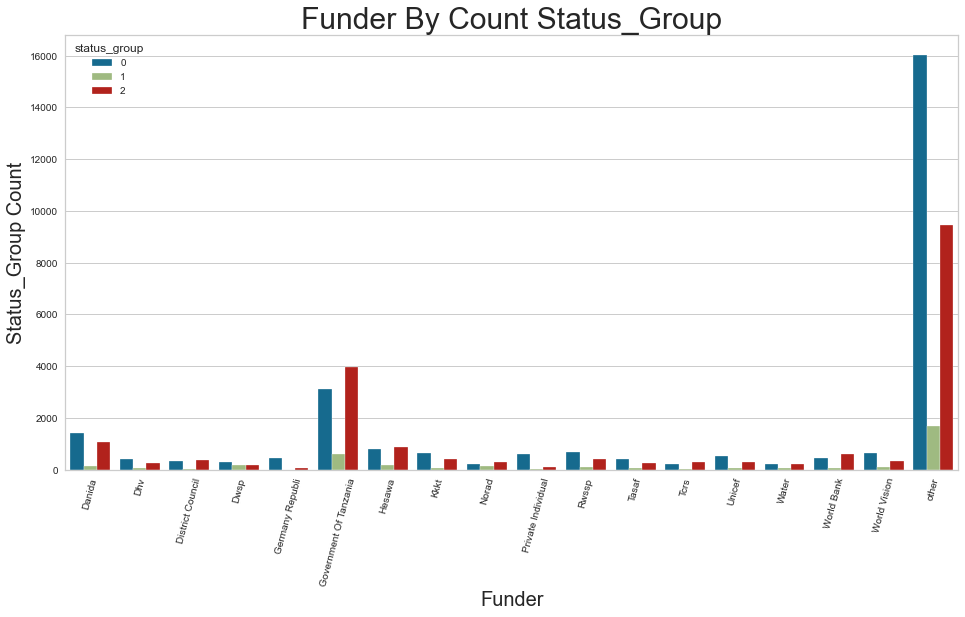

posx and posy should be finite values
posx and posy should be finite values


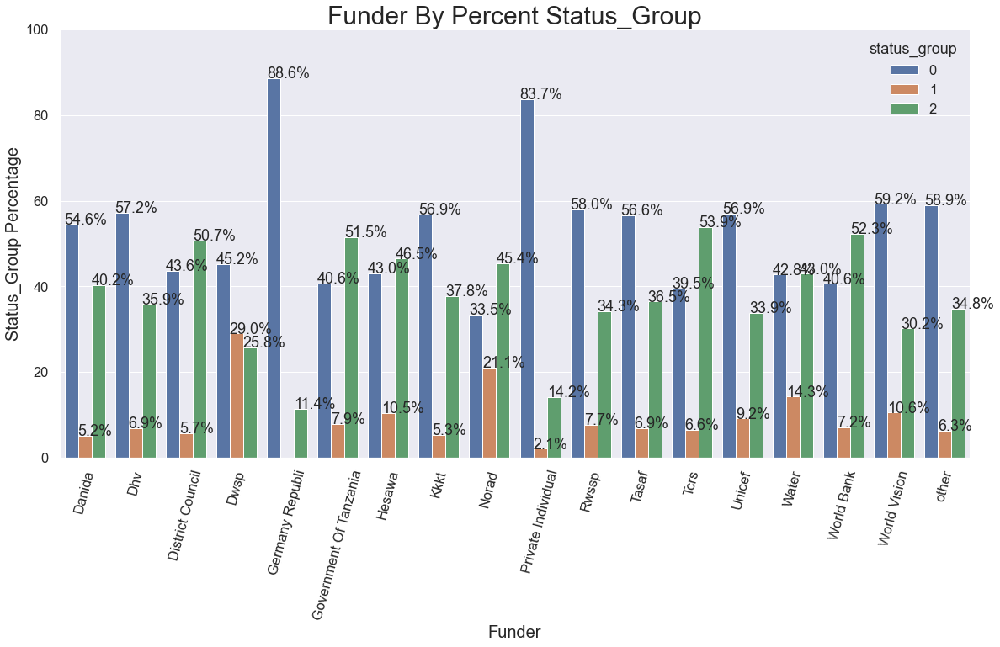

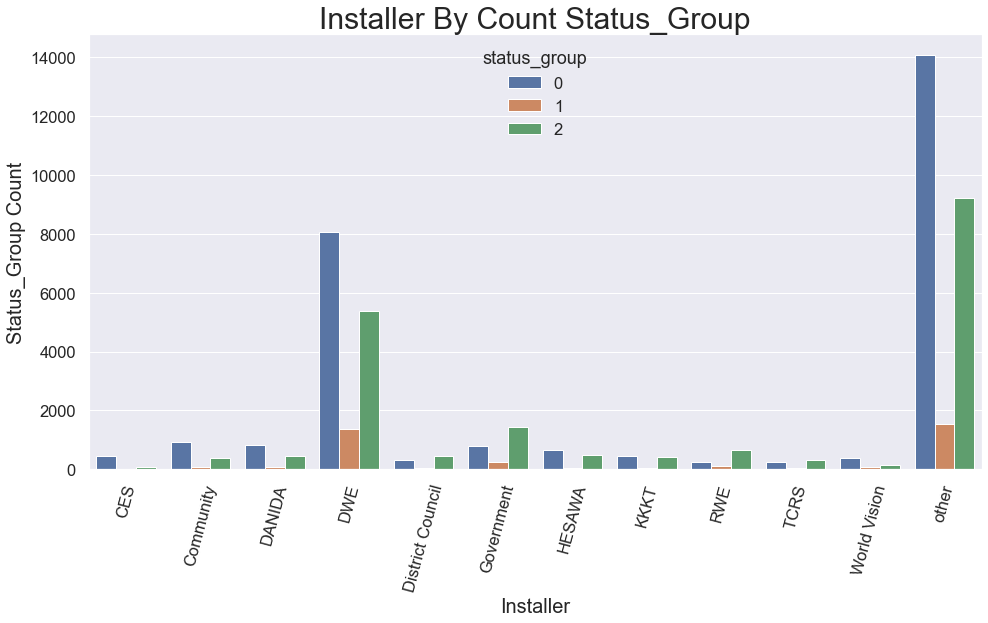

posx and posy should be finite values
posx and posy should be finite values


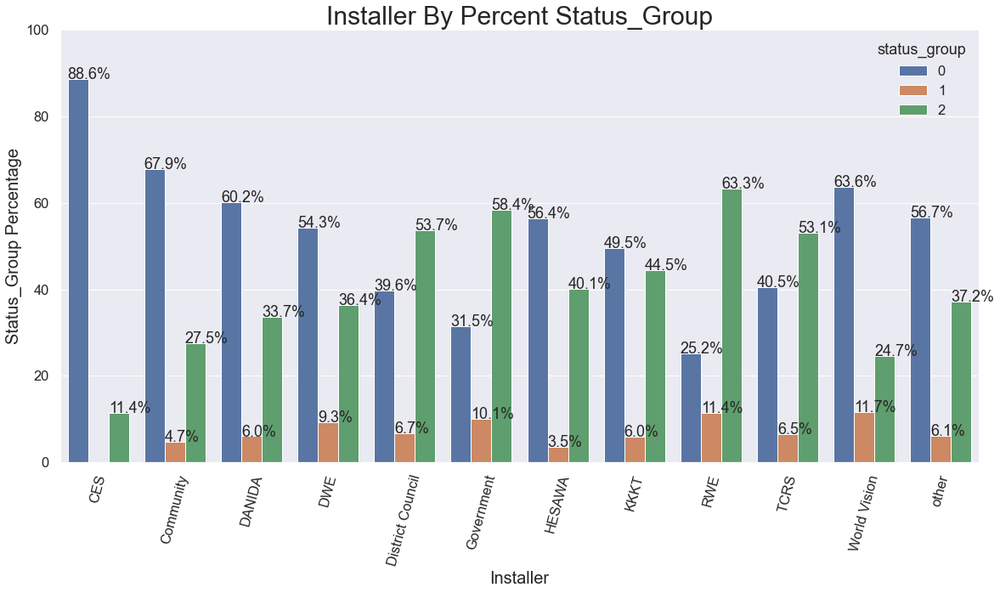

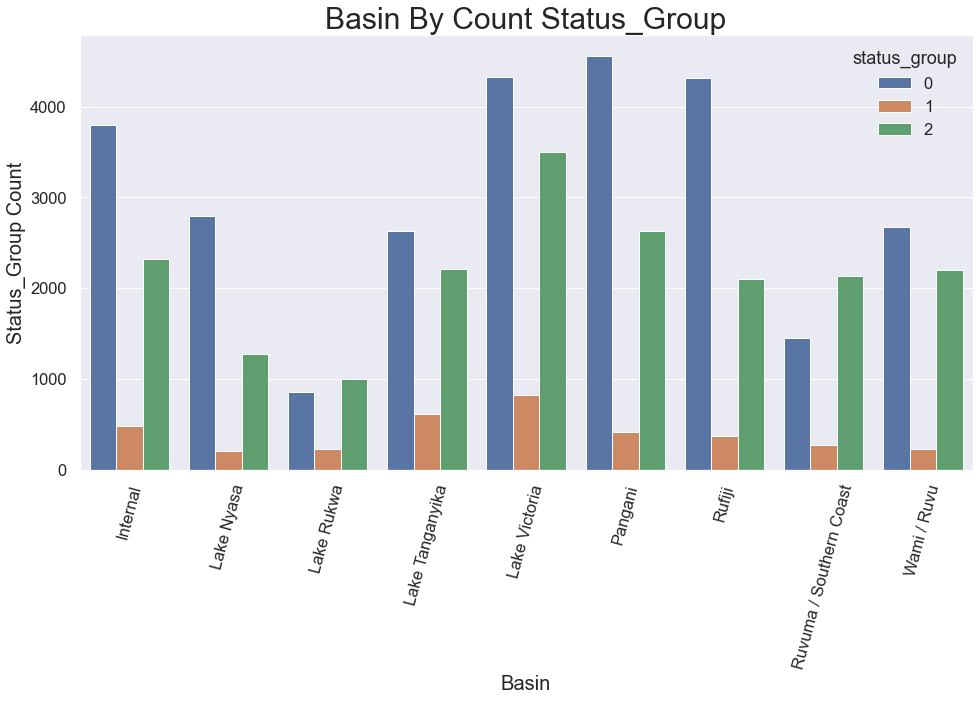

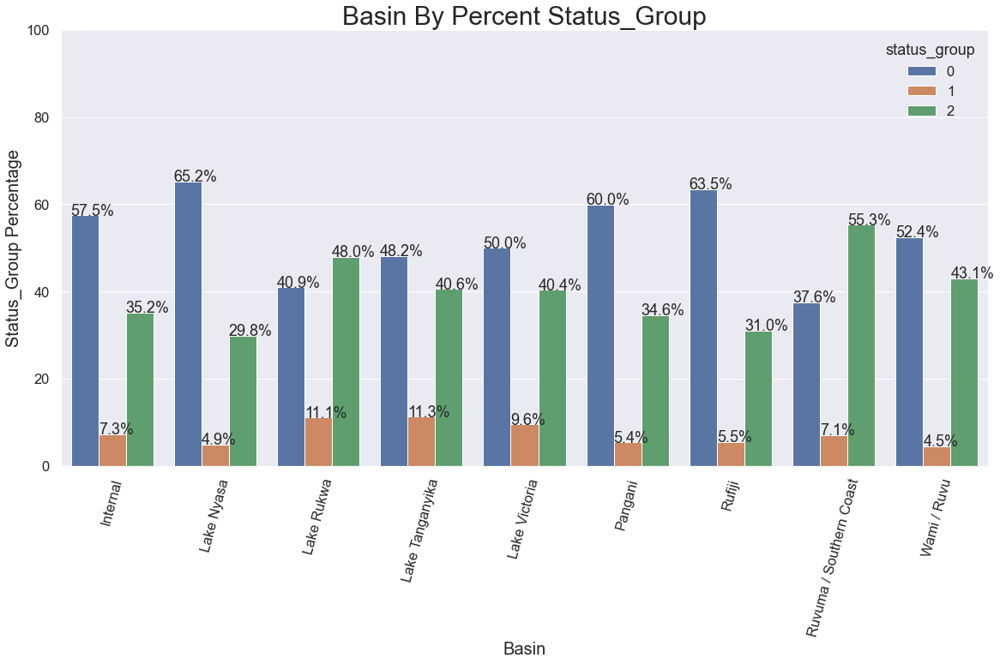

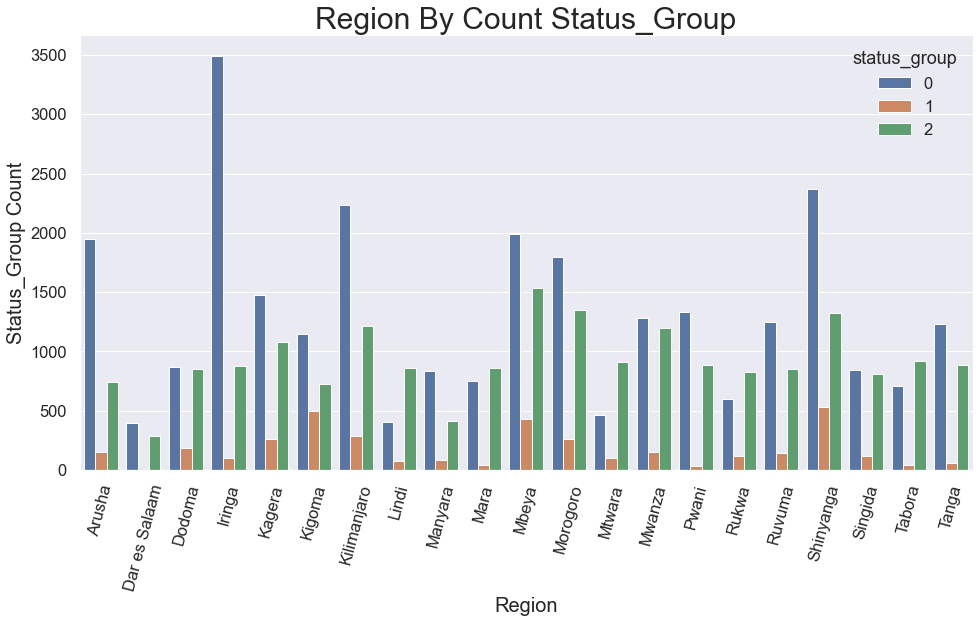

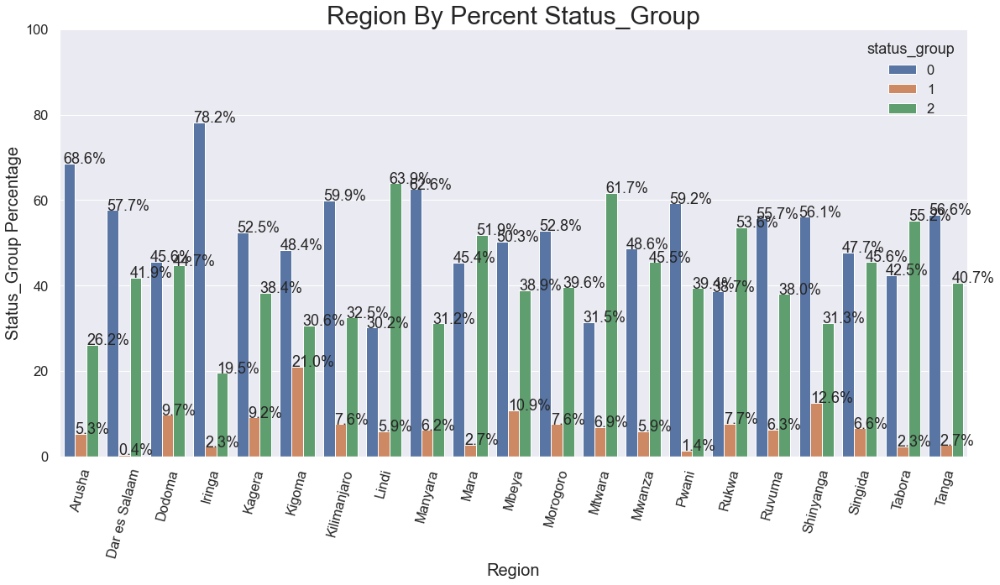

...

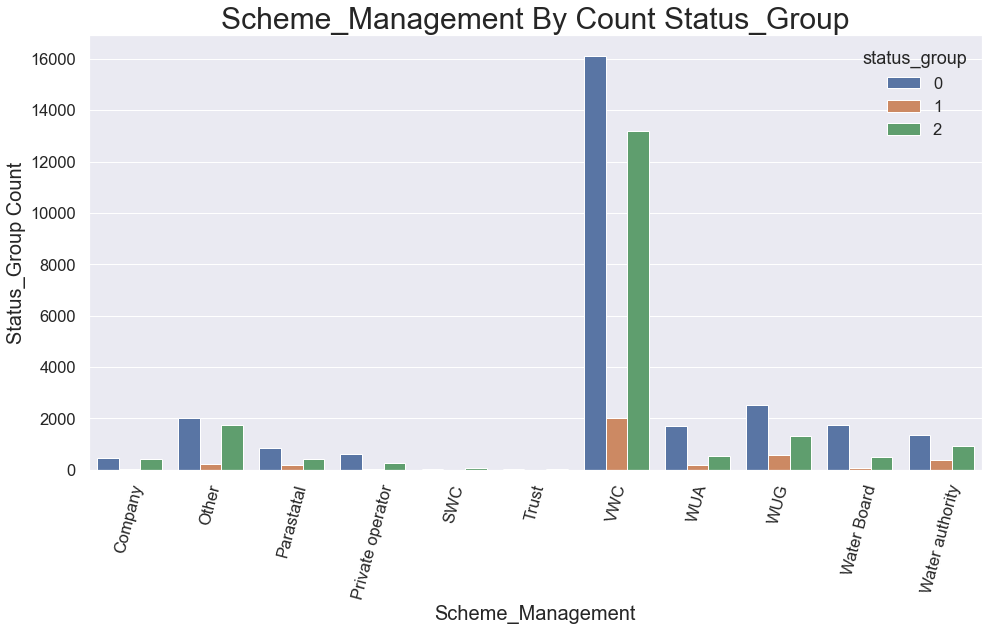

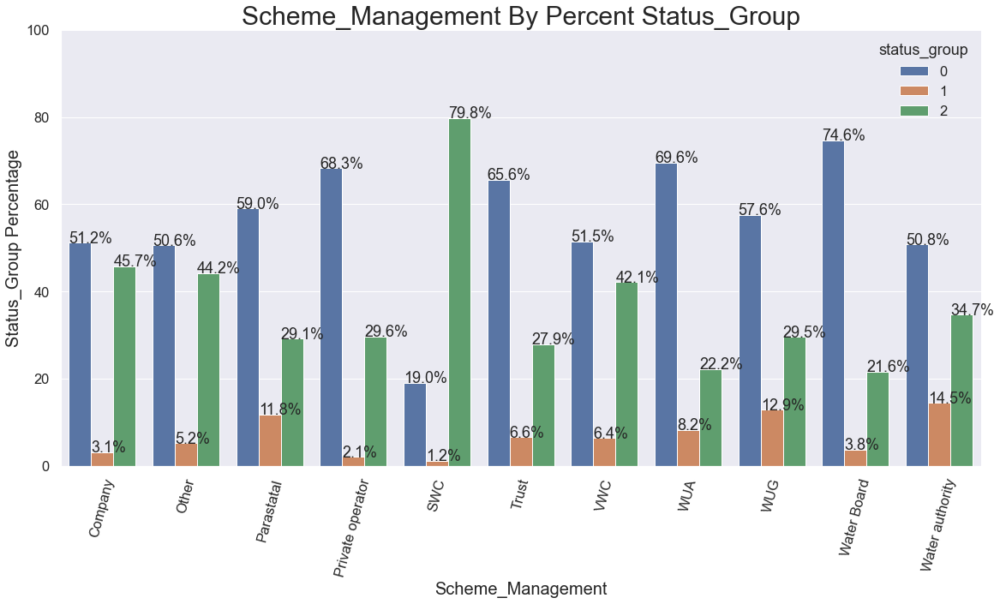

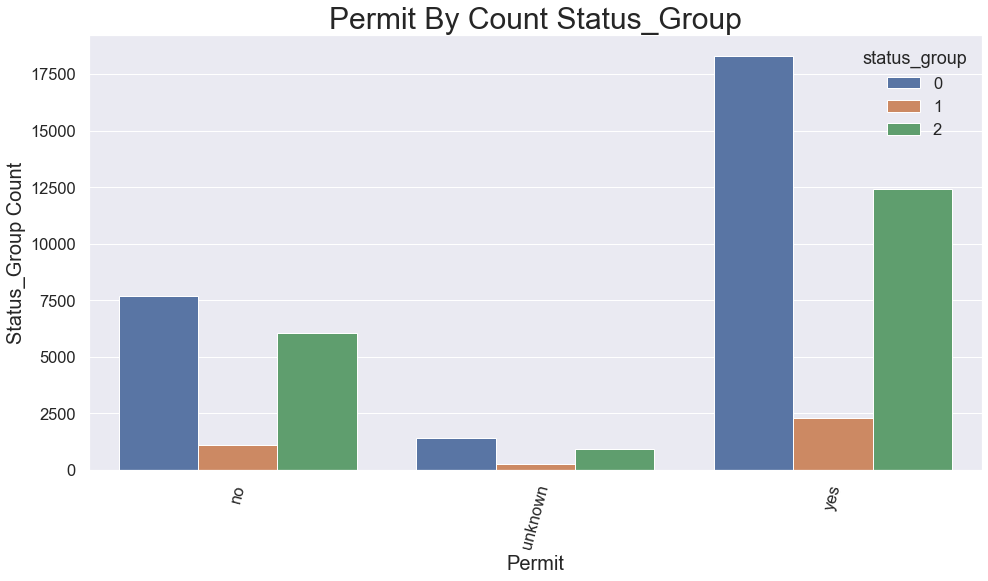

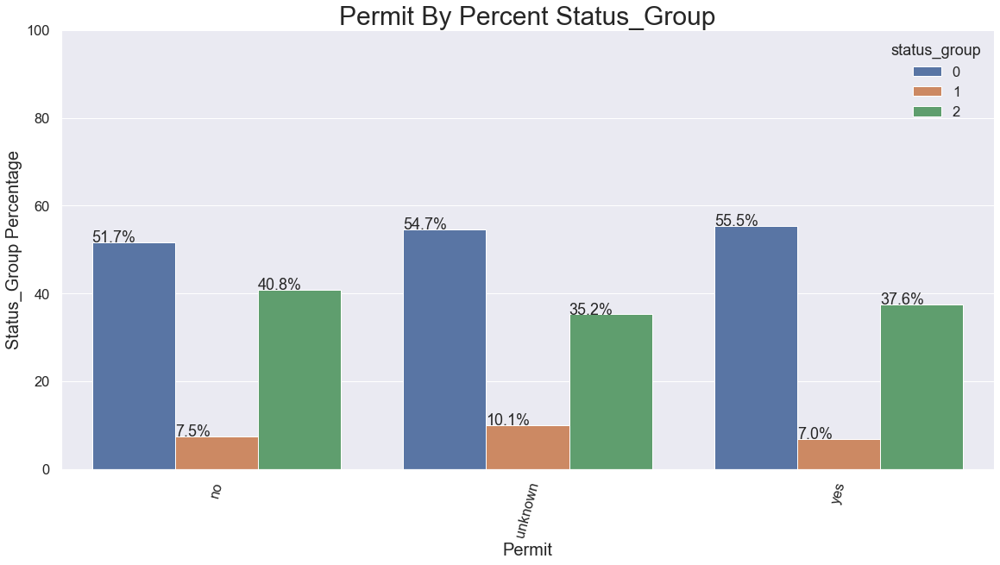

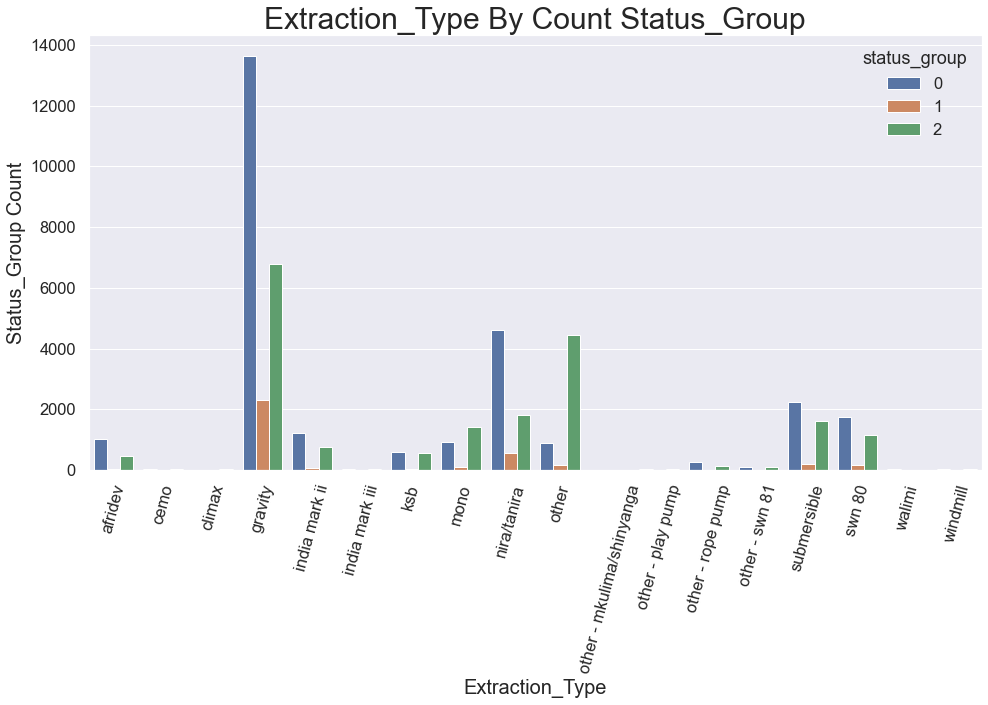

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


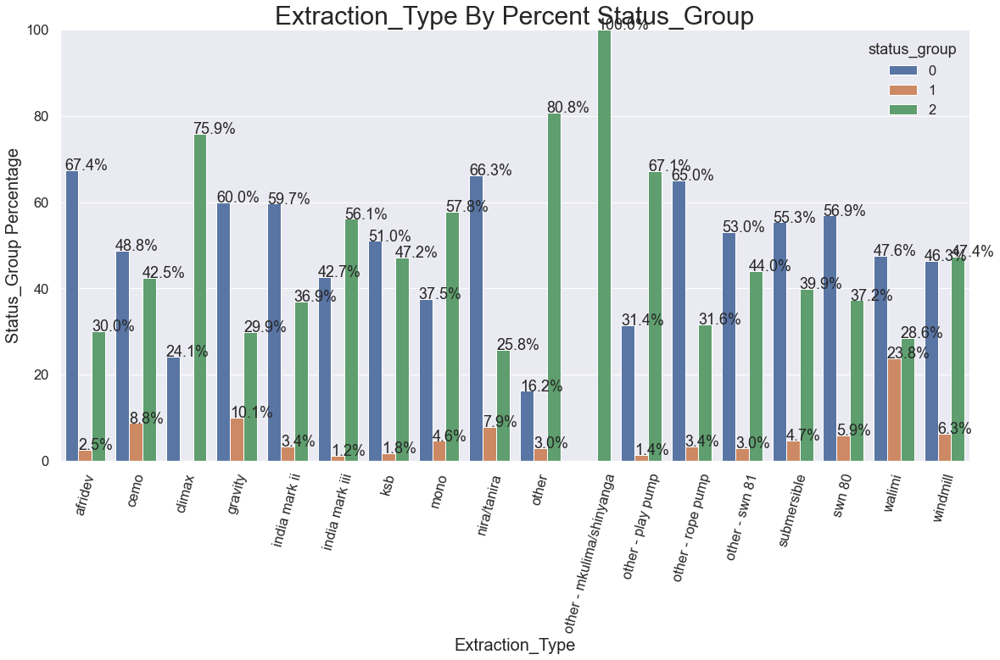

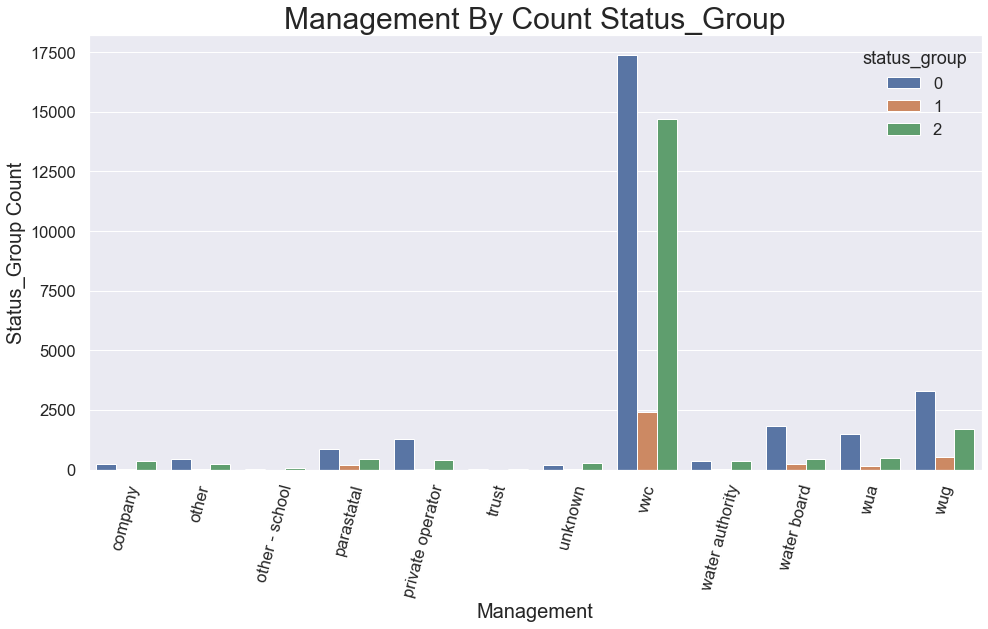

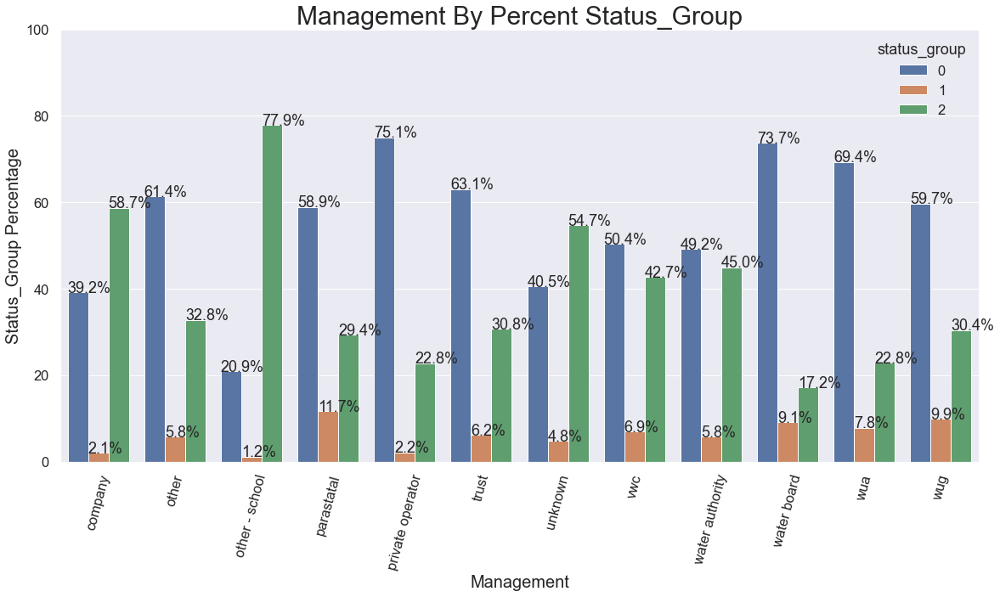

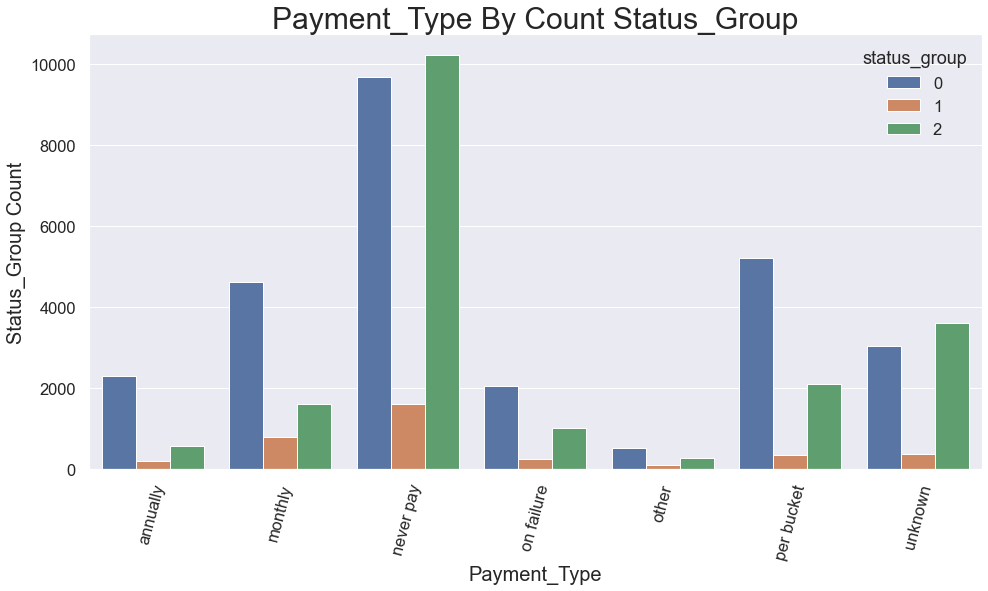

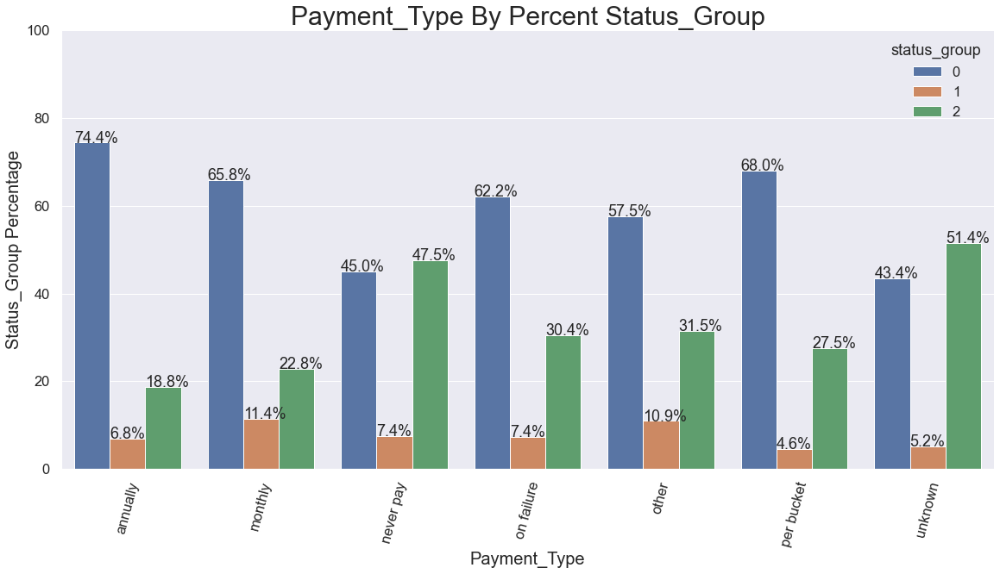

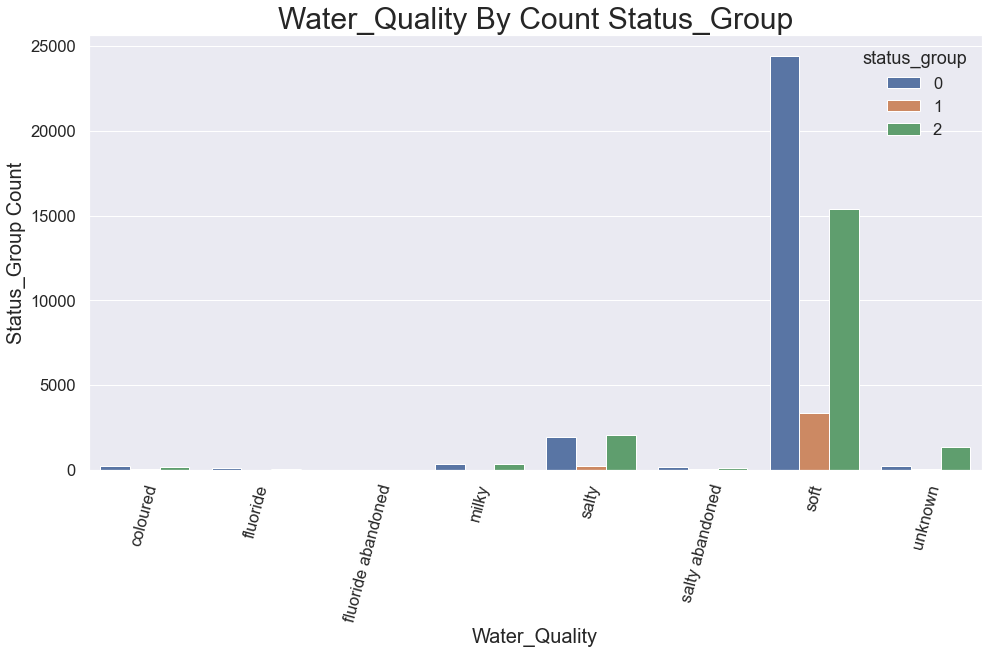

posx and posy should be finite values
posx and posy should be finite values


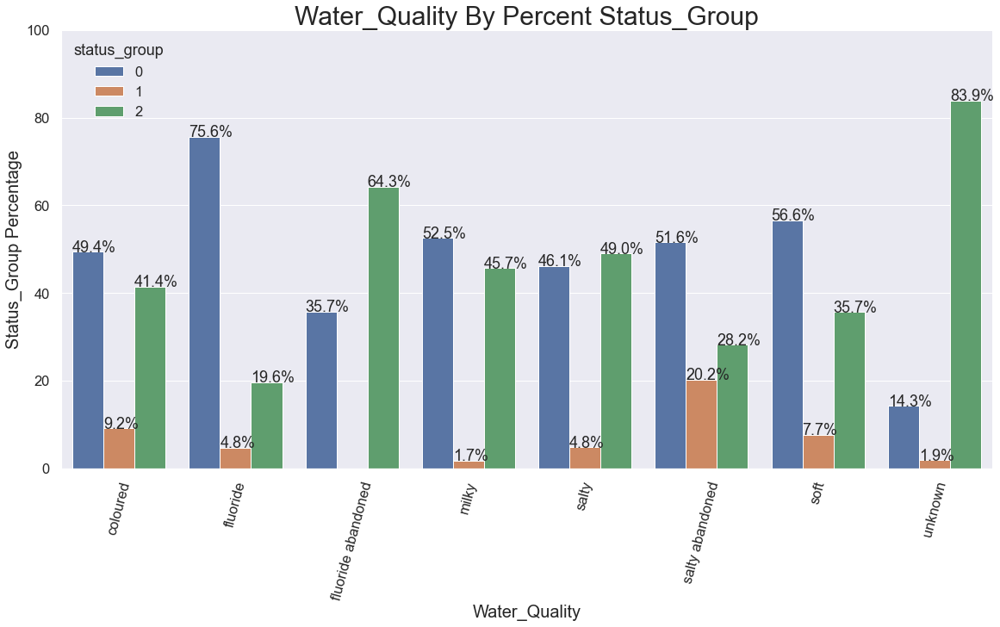

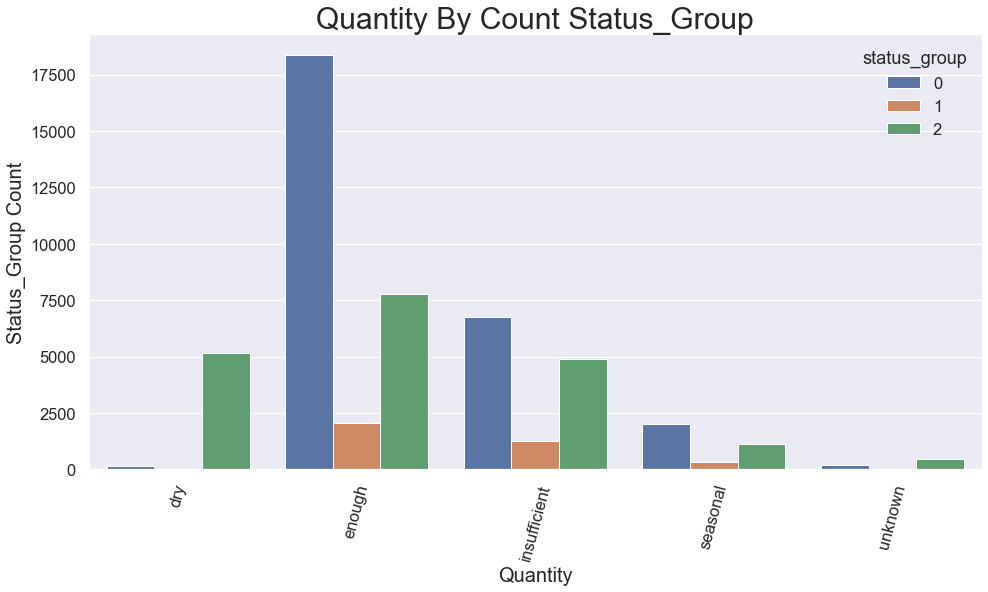

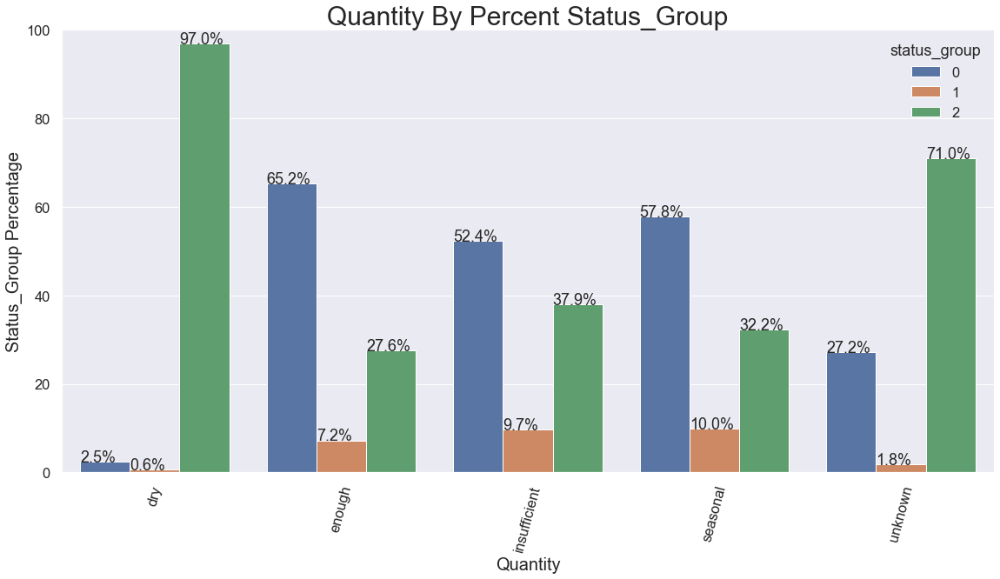

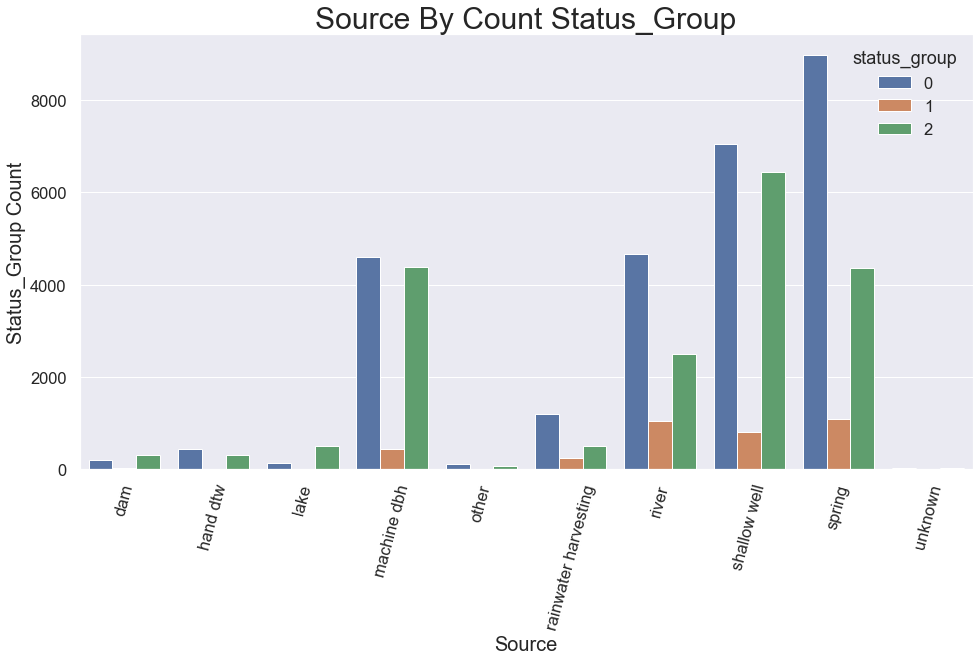

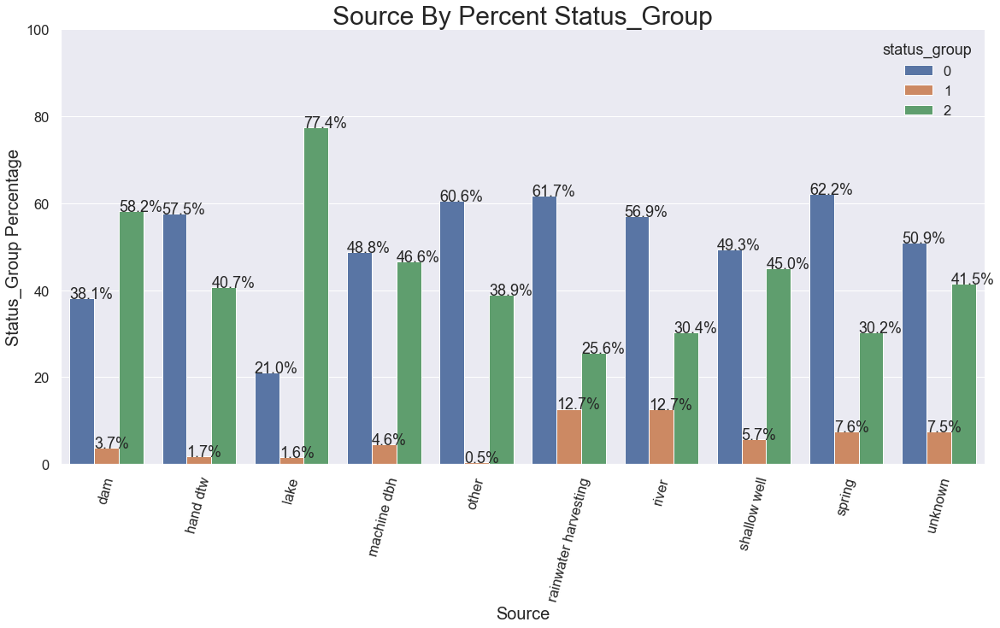

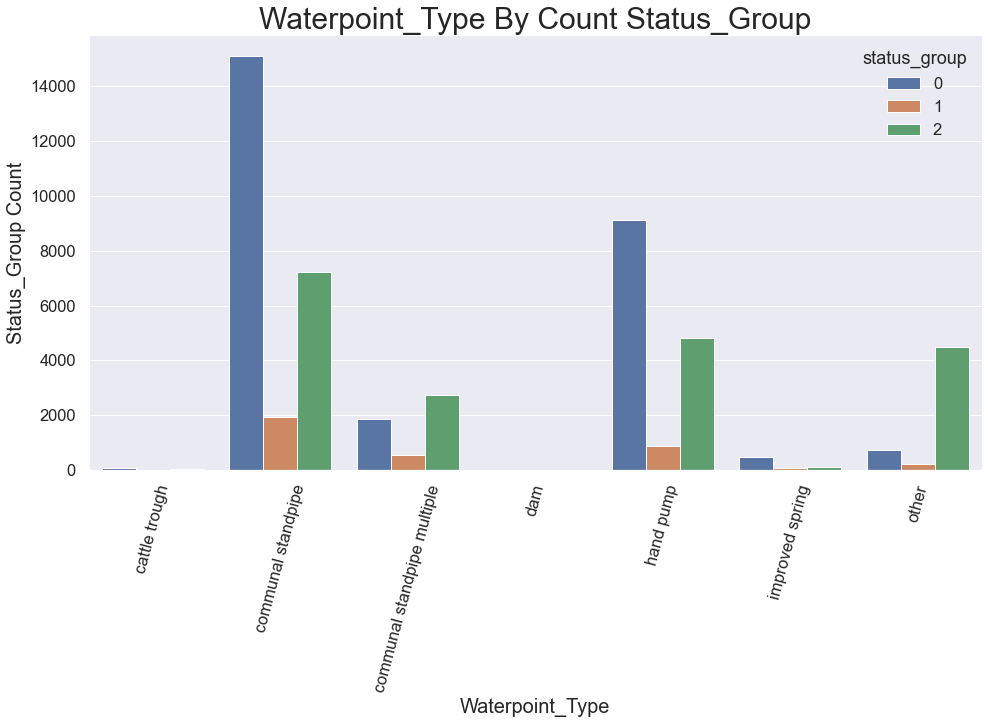

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


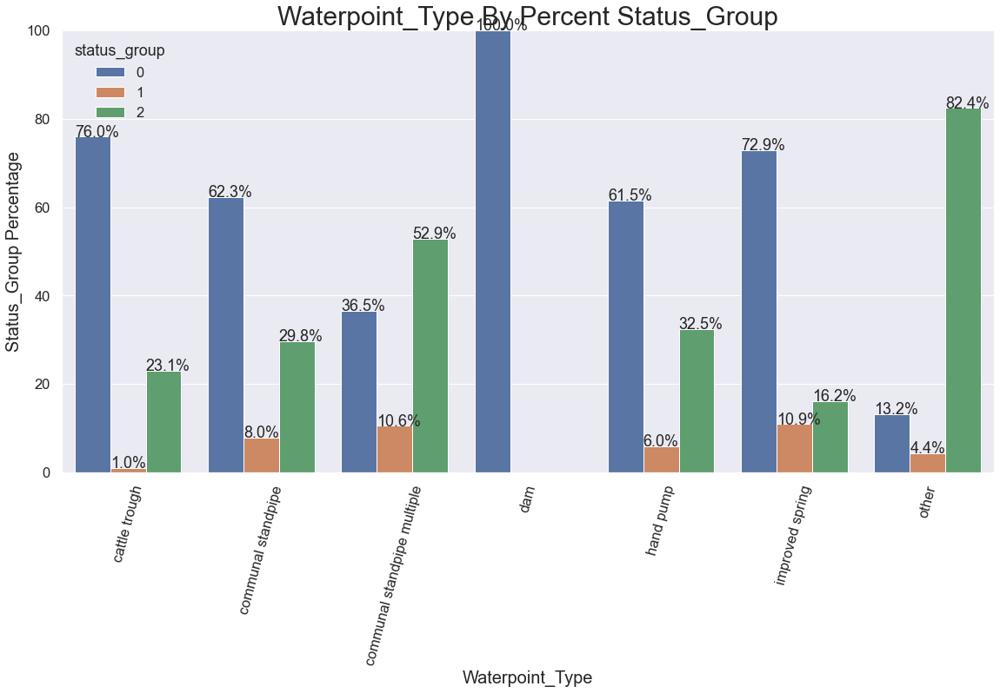

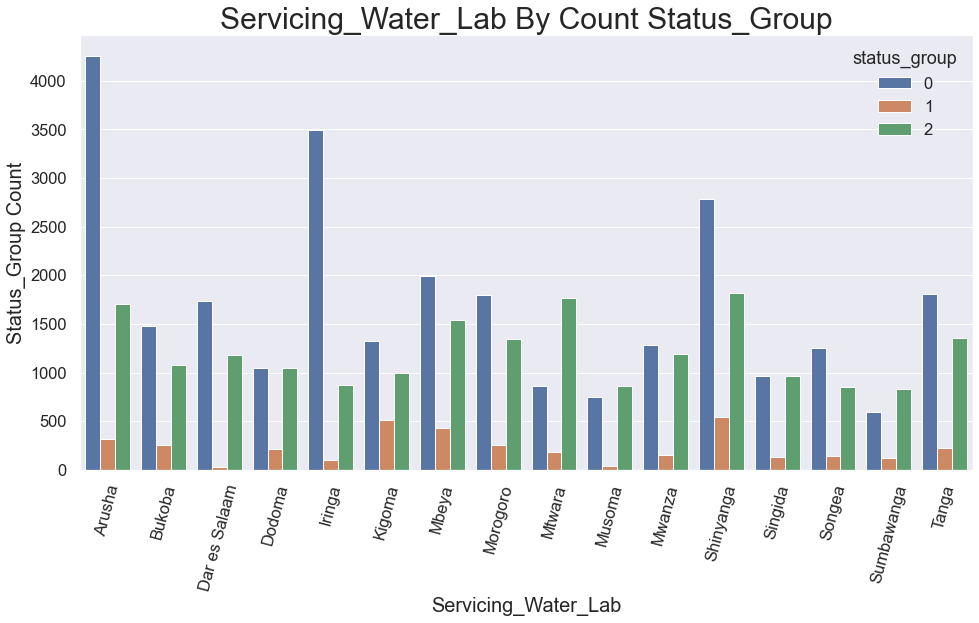

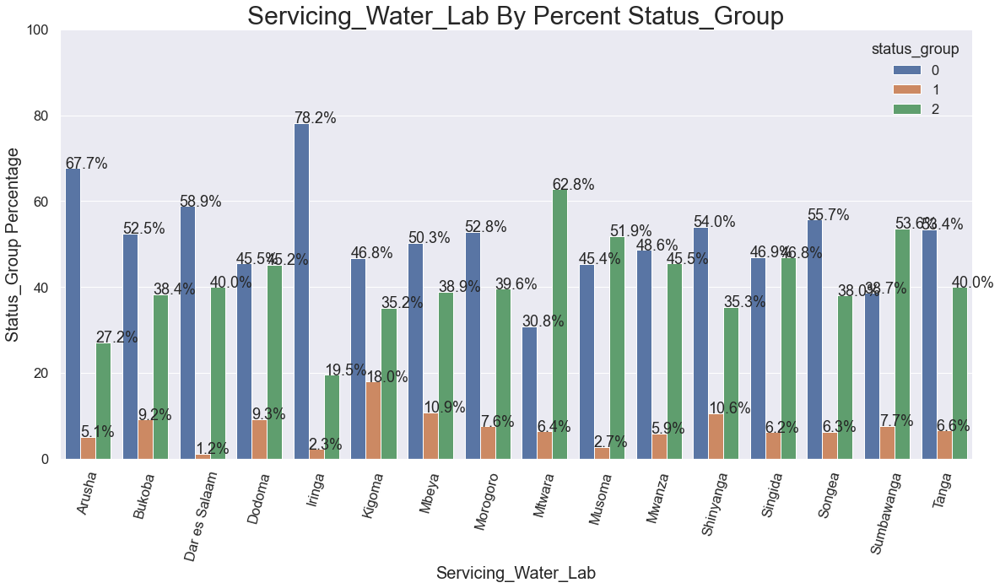

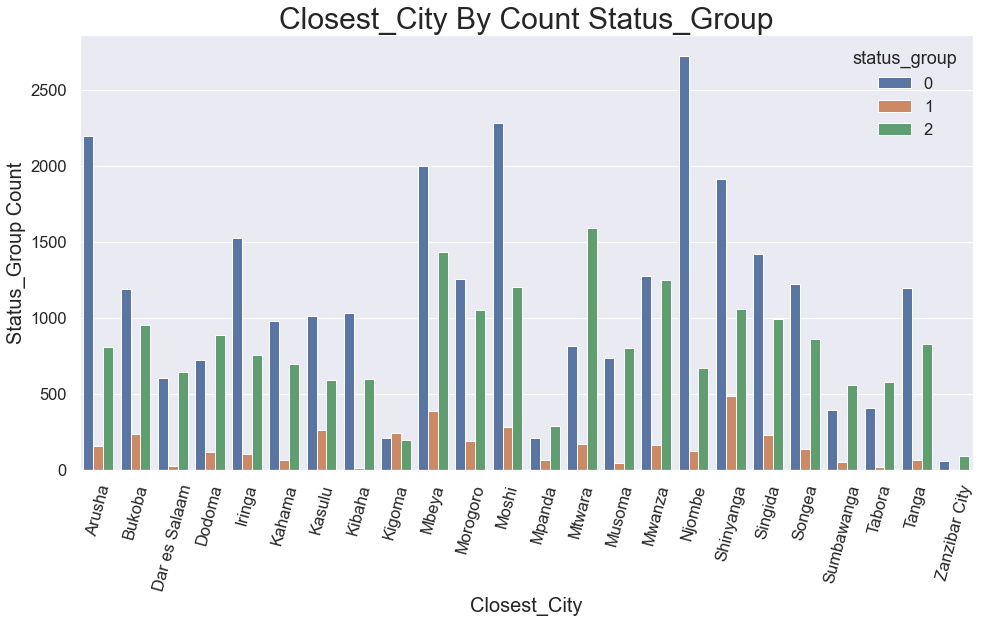

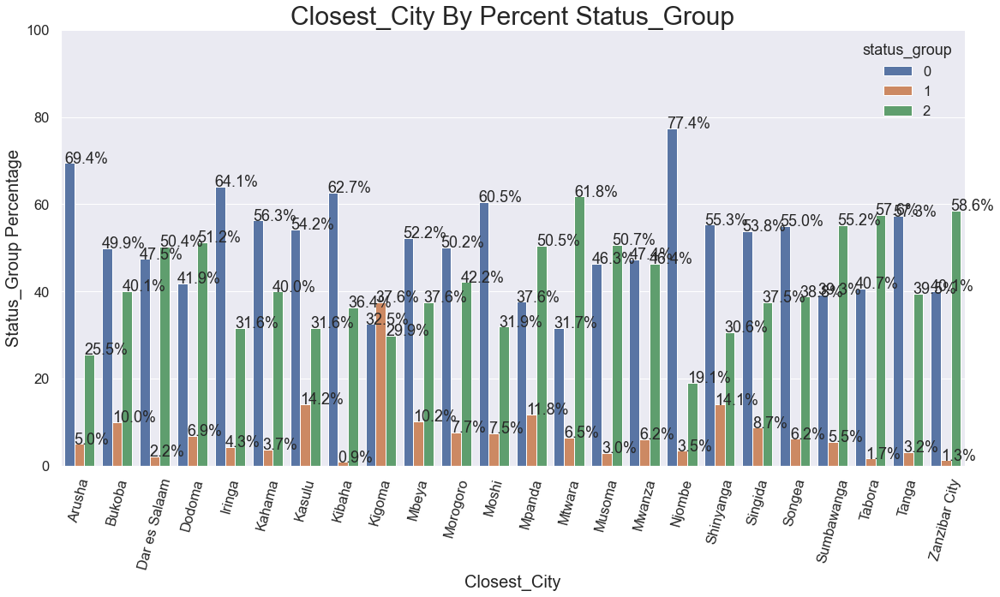

In [154]:
# Loop through the category columns and generate both plots
for col in cat_cols.drop('lga'):
    pf.plotting_counts(train_df, col)
    pf.plotting_percentages(train_df, col)

In [155]:
func = inspect.getsource(pf.plot_num_cols)
display(Markdown("```python\n"+func+"\n```"))

```python
def plot_num_cols(df, col, target='status_group'):
    '''
    Generates 'boxen' type catplot on a column in a dataframe grouped by target
    
    Args:
        df (dataframe): Dataframe that contains the column and target to be 
        plotted
        col (str): Column name of the data to be plotted against the target
        target (str): Target column of the dataframe
        
    Returns:
        Catplot 'boxen' figure split by the target 
    
    Example:
        plotting_num_cols(data, 'feature_name')
    '''
    # Generating the figure
    g = sns.catplot(x=target, y=col, data=df, kind='boxen', 
                    height=7, aspect=2)

    # Setting the title
    plt.suptitle(f'{col.title()} and {target.title()}', fontsize=30, y=1.05)

```

In [156]:
# Creating list of number columns
num_cols = train_df.select_dtypes('number').columns
num_cols = num_cols.drop('status_group')
num_cols

Index(['amount_tsh', 'gps_height', 'longitude', 'latitude', 'population',
       'construction_year', 'lab_distance', 'city_distance'],
      dtype='object')

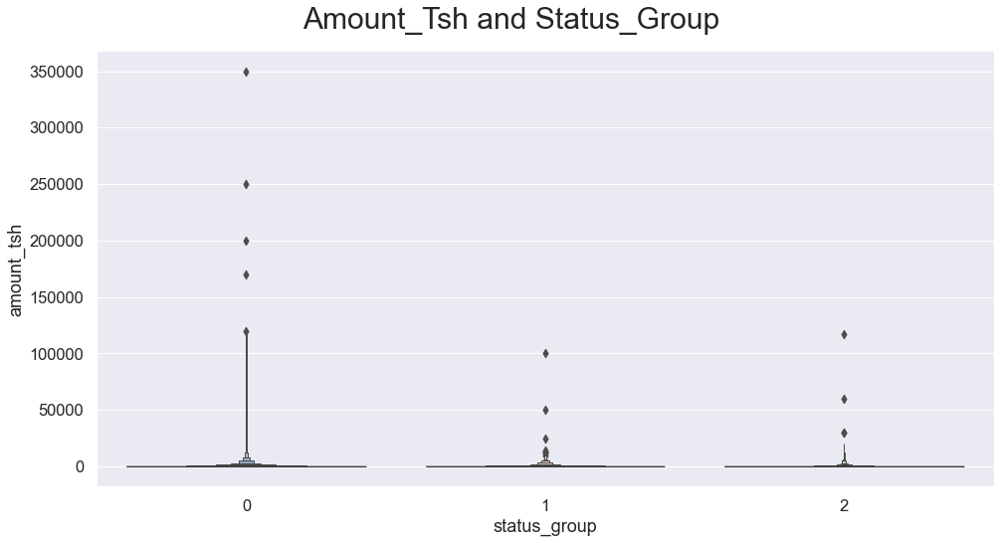

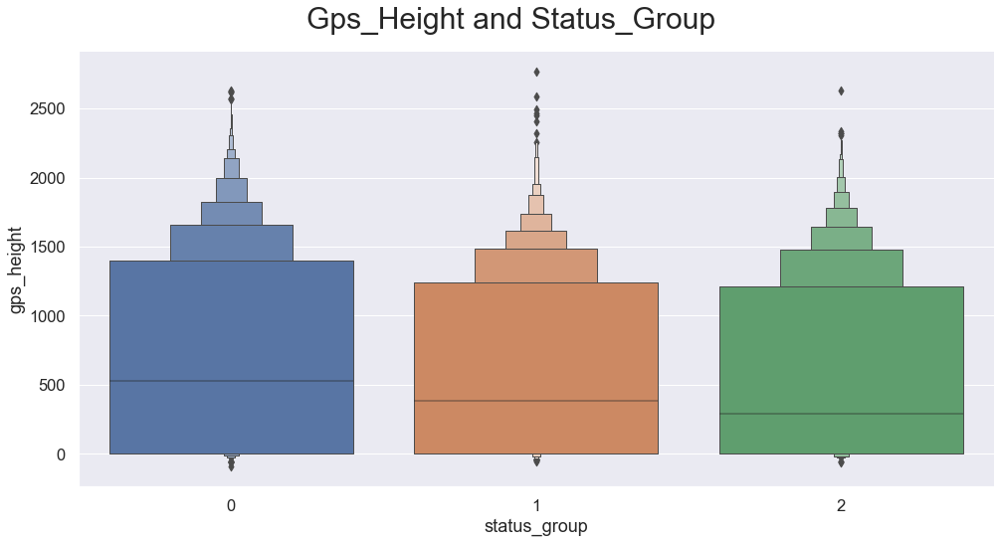

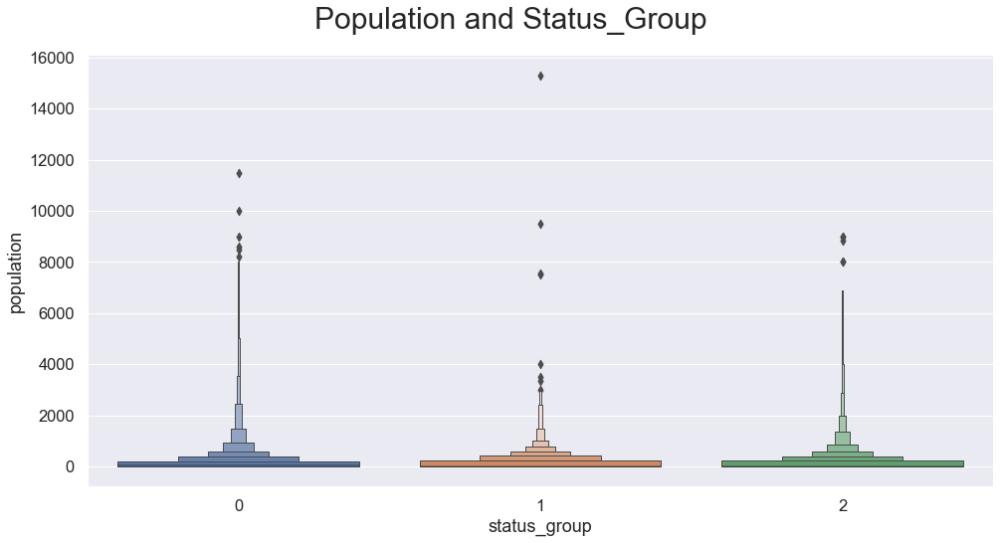

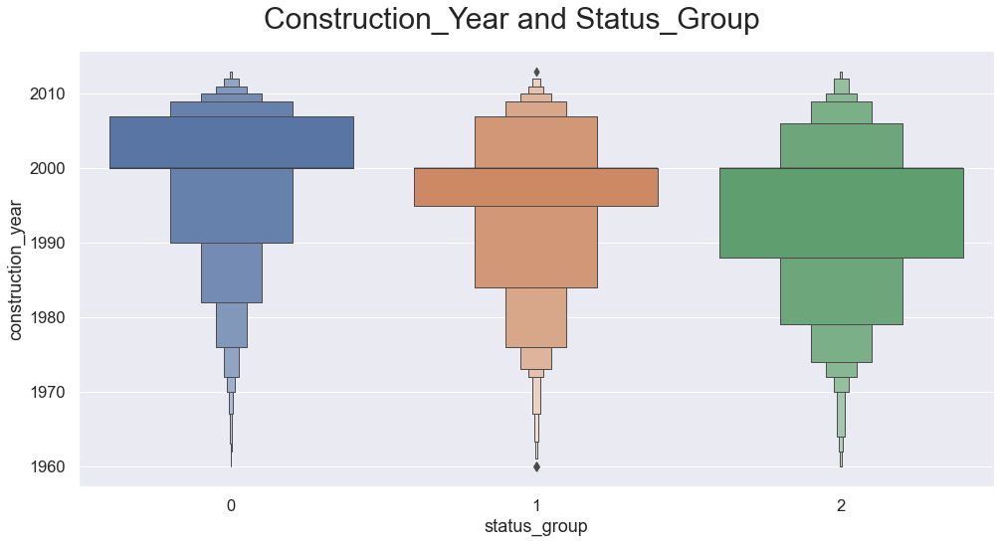

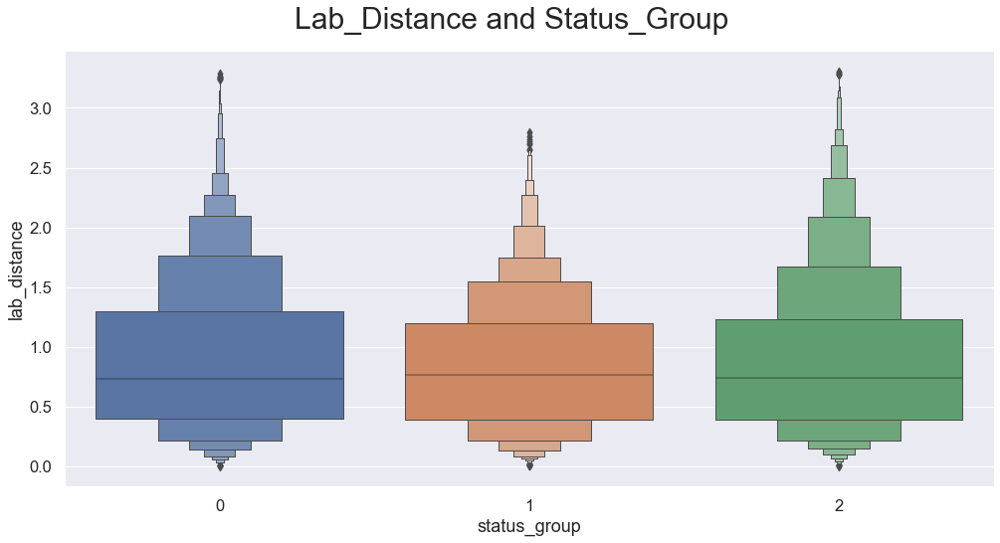

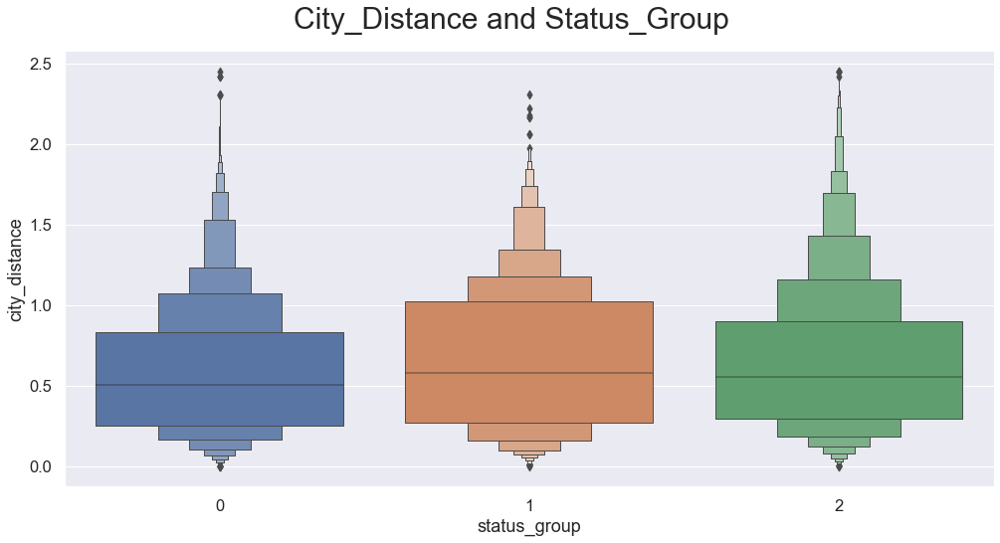

In [157]:
# Loop through each column and plot
for col in num_cols.drop(['longitude', 'latitude']):
    pf.plot_num_cols(train_df, col)

# MODEL PREPARATION

## One Hot Encode

In [158]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)

In [159]:
# One hot encoding the categorical columns of the dataframes
ohe_train = encoder.fit_transform(X_train[cat_cols])
ohe_test = encoder.transform(X_test[cat_cols])
ohe_comp = encoder.transform(compdf[cat_cols])

In [160]:
# Getting the new names of the columns
col_names = encoder.get_feature_names(cat_cols)

In [161]:
# Turning the one hot encoded columns into a dataframe
ohe_train_df = pd.DataFrame(ohe_train, columns=col_names, index=X_train.index)
ohe_test_df = pd.DataFrame(ohe_test, columns=col_names, index=X_test.index)
ohe_comp_df = pd.DataFrame(ohe_comp, columns=col_names, index=compdf.index)

## Scaling

In [162]:
# QuantileTransformer scaler will be used as there are some number columns
# with far outliers
from sklearn.preprocessing import QuantileTransformer
qt = QuantileTransformer(random_state=123)

In [163]:
# Transforming the number columns
qt_train = qt.fit_transform(X_train[num_cols])
qt_test = qt.transform(X_test[num_cols])
qt_comp = qt.transform(compdf[num_cols])

In [164]:
# Turning the transformed number features into dataframes
qt_train_df = pd.DataFrame(qt_train, columns=X_train[num_cols].columns, 
                           index=X_train.index)
qt_test_df = pd.DataFrame(qt_test, columns=X_train[num_cols].columns, 
                          index=X_test.index)
qt_comp_df = pd.DataFrame(qt_comp, columns=X_train[num_cols].columns, 
                          index=compdf.index)

In [165]:
# Combining the categorical and number columns back together
X_train_tf = pd.concat([qt_train_df, ohe_train_df], axis=1)
X_test_tf = pd.concat([qt_test_df, ohe_test_df], axis=1)
comp_tf = pd.concat([qt_comp_df, ohe_comp_df], axis=1)

In [166]:
# Looking at the dataframe
X_train_tf.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
53229,0.000,0.013,0.971,0.369,0.420,0.499,0.018,0.027,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
36715,0.000,0.696,0.809,0.678,0.587,0.709,0.936,0.396,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
15331,0.000,0.198,0.231,0.650,0.000,0.499,0.227,0.353,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000
22411,0.895,0.963,0.659,0.788,0.681,0.186,0.057,0.090,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
59621,0.000,0.700,0.716,0.736,0.661,0.709,0.141,0.215,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.

In [167]:
# Looking at the dataframe
X_test_tf.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8445,0.820,0.893,0.490,0.566,0.924,0.935,0.153,0.235,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000
39496,0.820,0.986,0.360,0.145,0.000,0.169,0.965,0.632,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,...,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
31476,0.763,0.391,0.938,0.501,0.420,0.788,0.022,0.033,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000
42739,0.853,0.739,0.014,0.581,0.957,0.813,0.298,0.183,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
46679,0.000,0.198,0.306,0.193,0.000,0.499,0.130,0.199,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0

In [168]:
# Looking at the dataframe
comp_tf.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
50785,0.000,0.979,0.536,0.636,0.839,0.987,0.831,0.778,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000
51630,0.000,0.869,0.663,0.760,0.821,0.499,0.020,0.032,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
17168,0.000,0.868,0.475,0.503,0.914,0.935,0.094,0.147,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000
45559,0.000,0.452,0.845,0.127,0.781,0.162,0.967,0.999,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
49871,0.895,0.715,0.514,0.018,0.566,0.499,0.479,0.640,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.

## SMOTENC

In [169]:
# Importing the SMOTE packages
import six
import sys
sys.modules['sklearn.externals.six'] = six
from imblearn.over_sampling import SMOTENC

In [170]:
# Getting a list of categorical columns after tranforming
cat_cols_tf = list(X_train_tf.columns)
print('Starting lenghth of all columns:', len(cat_cols_tf))
print('Length of num_cols:', len(num_cols))
for col in num_cols:
    cat_cols_tf.remove(col)
print('Length of categorical columns after OHE:', len(cat_cols_tf))

Starting lenghth of all columns: 316
Length of num_cols: 8
Length of categorical columns after OHE: 308


In [171]:
# Creating a mask of categorical features
mask = []
for col in X_train_tf.columns:
    if col in cat_cols_tf:
        mask.append(True)
    else:
        mask.append(False)

In [172]:
# Distribution of classes before SMOTE
y_train.value_counts(1)

0   0.543
2   0.384
1   0.073
Name: status_group, dtype: float64

In [173]:
# SMOTEing my dataframes
smote = SMOTENC(categorical_features=mask, random_state=123, n_jobs=-1)
X_train_smote, y_train_smote = smote.fit_resample(X_train_tf, y_train)

In [174]:
# Turning the SMOTEd y into a series
y_train_smote = pd.Series(y_train_smote)

In [175]:
# Distributuion of classes after SMOTE
y_train_smote.value_counts(1)

2   0.333
1   0.333
0   0.333
dtype: float64

In [176]:
# Turning the SMOTEd X into a dataframe
X_train_smote = pd.DataFrame(X_train_smote, columns=X_train_tf.columns)
X_train_smote.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
0,0.000,0.013,0.971,0.369,0.420,0.499,0.018,0.027,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,0.000,0.696,0.809,0.678,0.587,0.709,0.936,0.396,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0.000,0.198,0.231,0.650,0.000,0.499,0.227,0.353,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.895,0.963,0.659,0.788,0.681,0.186,0.057,0.090,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.000,0.700,0.716,0.736,0.661,0.709,0.141,0.215,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00

In [177]:
# Looking at the shapes
print(X_train_smote.shape)
print(y_train_smote.shape)

(82260, 316)
(82260,)


In [178]:
# Comparing to the previous shapes
print(X_train_tf.shape)
print(y_train.shape)

(50490, 316)
(50490,)


In [179]:
# Saving SMOTE files
# X_train_smote.to_csv(r'XSmote.csv')
# y_train_smote.to_csv(r'ySmote.csv')

## Model Evaluation Function

It is much worse for nonfunctional wells to be predicted as functional than for functional wells to be predicted to be nonfunctional. If nonfunctional wells are not correctly predicted then people would potentially be left without a water source. For that reason, recall will be looked at more heavily in this project. 

Since the classes are imbalanced, micro recall is the most appropriate way to calculate recall. This method of calculating recall aggregates all the true positives and false negatives for each class then calculates the global recall metric. This will give equal weight to the false negatives even from the least observed class (needs repair). Micro recall will be used as the scoring metric to find the best model during grid searching.

In [180]:
func = inspect.getsource(pf.make_classification_report)
display(Markdown("```python\n"+func+"\n```"))

```python
def make_classification_report(model, y_true, x_test, title=''):
    
    '''
    Generate and return the classification report for a model.
    
    Args: 
        Model (classification model): SKlearn compatable model.
        y_true (series or array): True labels to compare predictions
        x_test (dataframe or array): X data to generate predictions for
        title (str): Title for the report
        
    Returns:
        Dictionary of the classification results
    
    Example:
        make_classification_report(logreg_model, y_test, X_test, 
                                    title='Logistic Regression Model')
        
        '''
    # Generate predictions
    y_preds = model.predict(x_test)
    print('__________________________________________________________________')
    print(f'CLASSIFICATION REPORT FOR: \n\t{title}')
    print('__________________________________________________________________')
    print('\n')
    
    # Generate report
    report = metrics.classification_report(y_true, y_preds, 
                                    target_names=['functional', 'needs repair', 
                                             'nonfunctional'])
    report_dict = metrics.classification_report(y_true, y_preds, output_dict=True,
                            target_names=['functional', 'needs repair', 
                                     'nonfunctional'])
    # Add the title to the report dictionary
    report_dict['title'] = title
    print(report)
    print('__________________________________________________________________')
    
    return report_dict

```

In [181]:
func = inspect.getsource(pf.plot_confusion_matrix)
display(Markdown("```python\n"+func+"\n```"))

```python
def plot_confusion_matrix(model, X, y, title=''):
    '''
    Plots the normalized confusion matrix for a model
    
    Args:
        Model (classification model): SKlearn compatable model
        X (dataframe or array): feature columns of a dataframe
        y (series or array): target column of a dataframe
        title (str): Title for the matrix
    
    Returns:
        Plotted figure of the confusion matrix for the model
    
    Example:
        plot_confusion_matrix(logreg_model, X_test, y_test, 
        title='Logistic Regression Model')
    '''
    
    # Plot the matrix with labels    
    fig = metrics.plot_confusion_matrix(model, X, y, normalize='true', 
                                        cmap='Greens',
                                 display_labels=['functional', 'needs repair', 
                                             'nonfunctional'])
    # Remove grid lines
    plt.grid(False)
    
    # Set title
    plt.title(f'Confusion Matrix For {title}', fontdict={'fontsize':17})
    plt.show()
    print('__________________________________________________________________')
    return fig

```

In [182]:
func = inspect.getsource(pf.plot_ROC_curve)
display(Markdown("```python\n"+func+"\n```"))

```python
def plot_ROC_curve(model, xtrain, ytrain, xtest, ytest):
    '''
    Plots the ROC AUC curves for a model
    
    Args:
        Model (classification model): SKlearn compatable model
        xtrain (dataframe or array): feature columns of the training set
        ytrain (series or array): target column of the training set
        xtest (dataframe or array): feature columns of the test set
        ytest (series or array): target column of the test set
        
    Returns:
        Plotted figure of ROC AUC curves for the model
    
    Example:
        plot_ROC_curve(logreg_model, X_train, y_train, X_test, y_test)
    '''

    # Creating visualization with the readable labels
    visualizer = ROCAUC(model, encoder={0: 'functional', 
                                        1: 'needs repair', 
                                        2: 'nonfunctional'})
    visualizer.fit(xtrain, ytrain)
    visualizer.score(xtest, ytest)
    visualizer.show()
    return visualizer

```

In [183]:
func = inspect.getsource(pf.plot_top_features)
display(Markdown("```python\n"+func+"\n```"))

```python
def plot_top_features(model, xtrain, title=''):
    '''
    Plots the top important features of a tree based model
    
    Args:
        Model (classification model): SKlearn compatable model
        xtrain (dataframe or array): feature columns for the training set
        title (str): Title for the plot
        
    Returns:
        Plotted figure of feature importances for the model
    
    Example:
        plot_top_features(rf_model, X_train, title='Random Forest Model')
    '''

    # Turn the feature importances into a series 
    importances = pd.Series(model.feature_importances_, index=xtrain.columns)
    
    # Plot the top most important features
    importances.nlargest(20).sort_values().plot(kind='barh')
    plt.title(f'Most Important Features For {title}', fontdict={'fontsize':17})
    plt.xlabel('Importance')
    return importances.sort_values(ascending=False)

```

In [184]:
func = inspect.getsource(pf.evaluate_model)
display(Markdown("```python\n"+func+"\n```"))

```python
def evaluate_model(model, xtrain, ytrain, xtest, ytest, 
                   tree=False, title=''):
    '''
    Runs all the evaluation functions on a model including the classification 
    report, confusion matrix, ROC AUC plot, and a top features plot if the 
    model is tree based.
    
    Args:
        model (classification model): SKlearn compatable model
        xtrain (dataframe or array): feature columns of the training set
        ytrain (series or array): target column of the training set
        xtest (dataframe or array): feature columns of the test set
        ytest (series or array): target column of the test set
        tree (boolean): if the model is tree based or not
        title (str): Title for the model
    
    Returns:
        The classification report, confusion matrix, ROC AUC plot, and top
        features plot if tree=True
    
    Example:
        evaluate_model(logreg_model, X_train, y_train, X_test, y_test,
                        title='Logistic Regression Model')
        
    '''
    
    make_classification_report(model, ytest, xtest, title=title)
    plot_confusion_matrix(model, xtest, ytest, title=title)
    plot_ROC_curve(model, xtrain, ytrain, xtest, ytest)
    
    # Feature importance can only be run on tree based models
    if tree:
        plot_top_features(model, xtrain, title=title)

```

## Dummy Model

In [185]:
# Fitting a dummy classifier
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy='stratified', random_state=123)
dummy_clf.fit(X_train_smote, y_train_smote)

DummyClassifier(random_state=123, strategy='stratified')

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Dummy Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.55      0.33      0.42      4839
 needs repair       0.07      0.35      0.12       647
nonfunctional       0.39      0.33      0.36      3424

     accuracy                           0.33      8910
    macro avg       0.34      0.34      0.30      8910
 weighted avg       0.45      0.33      0.37      8910

__________________________________________________________________


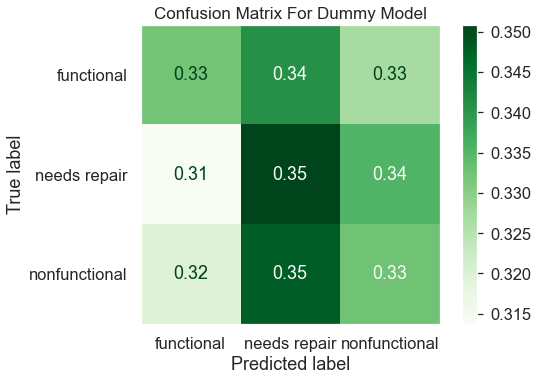

__________________________________________________________________


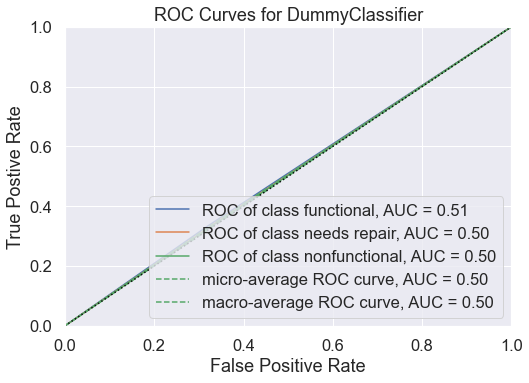

In [186]:
# Evaluating the model
pf.evaluate_model(dummy_clf, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='Dummy Model')

This shows that the evaluation functions work as expected and also what a model that is no better than guessing will look like.

# LOGISTIC REGRESSION

## Base Model

In [187]:
# Import package
from sklearn.linear_model import LogisticRegressionCV

In [188]:
# Create vanilla classifier and fit it to the training data
logreg_clf = LogisticRegressionCV(random_state=123, 
                                  scoring='recall_micro', 
                                  n_jobs=-1, cv=5,
                                  multi_class='multinomial')

# Fitting to the training data
logreg_base = logreg_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.68      0.74      4839
 needs repair       0.22      0.65      0.33       647
nonfunctional       0.78      0.67      0.72      3424

     accuracy                           0.67      8910
    macro avg       0.60      0.67      0.60      8910
 weighted avg       0.75      0.67      0.70      8910

__________________________________________________________________


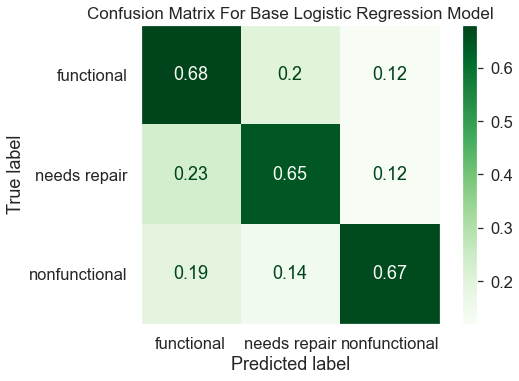

__________________________________________________________________


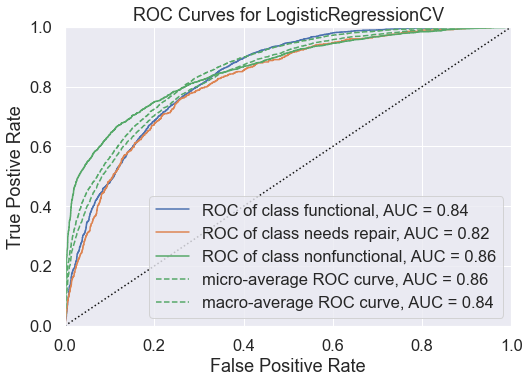

In [189]:
# Evaluate the model
pf.evaluate_model(logreg_base, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='Base Logistic Regression Model')

## Elastic Net

In [191]:
# Creating the classifier
logreg_clf = LogisticRegressionCV(solver = 'saga', 
                                  penalty='elasticnet', 
                                  random_state=123,
                                  scoring='recall_micro', 
                                  n_jobs=-1, cv=5,
                                  l1_ratios=[.1, .3, .5, .7, .9],
                                  multi_class='multinomial')

# Fitting to the training data
logreg_elasticnet = logreg_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Elastic Net Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.68      0.74      4839
 needs repair       0.22      0.65      0.33       647
nonfunctional       0.78      0.67      0.72      3424

     accuracy                           0.67      8910
    macro avg       0.60      0.66      0.60      8910
 weighted avg       0.75      0.67      0.70      8910

__________________________________________________________________


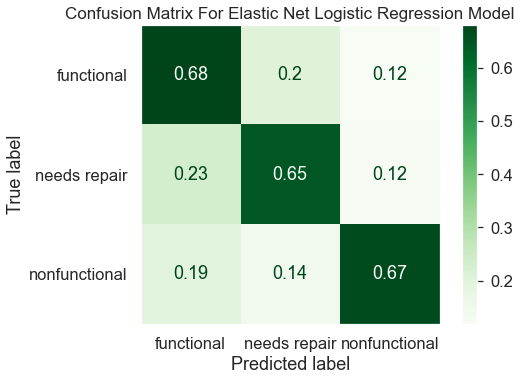

__________________________________________________________________


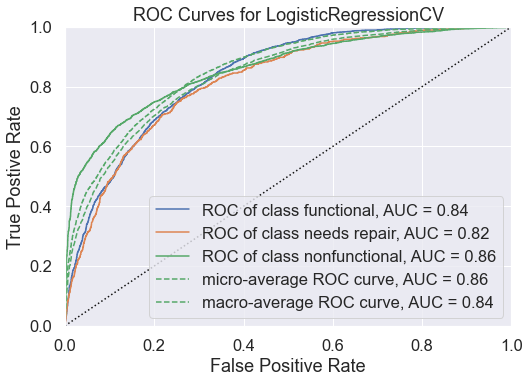

In [192]:
# Evaluate the model
pf.evaluate_model(logreg_elasticnet, X_train_smote, y_train_smote, X_test_tf, 
                  y_test, title='Elastic Net Logistic Regression Model')

## Grid Search

In [193]:
# Import packages
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

In [194]:
# Looking at the C values used for the base model
Cs_list = list(logreg_base.Cs_)
Cs_list

[0.0001,
 0.000774263682681127,
 0.005994842503189409,
 0.046415888336127774,
 0.3593813663804626,
 2.782559402207126,
 21.54434690031882,
 166.81005372000558,
 1291.5496650148827,
 10000.0]

In [ ]:
# Listing parameters to test
logreg_params = {'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'], 
                 'C': Cs_list}

# Creating the classifier
logreg_clf = LogisticRegression(random_state=123, 
                                multi_class='multinomial')

# Feeding the parameters into the grid for testing
grid = GridSearchCV(logreg_clf, logreg_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
logreg_grid = grid.fit(X_train_smote, y_train_smote)

In [ ]:
# Checking the best parameters
logreg_grid.best_params_

```python
{'C': 0.3593813663804626, 'solver': 'saga'}
```

In [ ]:
# Creating a list of Cs to try next
C_drill_list = list(np.linspace(logreg_grid.best_params_['C']/5, logreg_grid.best_params_['C']*5, 10))

In [ ]:
# Listing parameters to test
logreg_params = {'C': C_drill_list}

# Creating the classifier
logreg_clf = LogisticRegression(solver='saga', 
                                class_weight='balanced', 
                                random_state=123, 
                                multi_class='multinomial')

# Feeding the parameters into the grid for testing
grid = GridSearchCV(logreg_clf, logreg_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
logreg_grid2 = grid.fit(X_train_smote, y_train_smote)

In [ ]:
# Checking the best parameters
logreg_grid2.best_params_

```python
{'C': 0.4552163974152526}
```

In [ ]:
# The tuned model
logreg_gridmodel = logreg_grid2.best_estimator_
logreg_gridmodel

```python
LogisticRegression(C=0.4552163974152526, class_weight='balanced',
                   multi_class='multinomial', random_state=123, solver='saga')
```

In [ ]:
# Evaluate the model
evaluate_model(logreg_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               title='Grid Searched Logistic Regression Model')

## SMOTE Model

In [ ]:
# Checking the parameters to use
logreg_gridmodel

In [ ]:
# Creating a variable for the best C
best_c = logreg_grid2.best_params_['C']

# Creating the classifier
logreg_clf = LogisticRegressionCV(solver='saga', 
                                  random_state=123, n_jobs=-1, cv=5,
                                  scoring='recall_micro', 
                                  multi_class='multinomial', 
                                  Cs=[best_c])

# Fitting to the training data
logreg_smote = logreg_clf.fit(X_train_smote, y_train_smote)

In [ ]:
# Evaluate the model
evaluate_model(logreg_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='SMOTE Logistic Regression Model')

## Inferences

- The elastic net model has terrible accuracy overall but is quite good at predicting the needs repair class.
- The grid search did not produce much better results than the base model. The grid searched model is worse at predicting the needs repair class than the base.
- The SMOTE data brings better results for the needs repair class but is still not better than the base model.

# RANDOM FOREST

## Base Model

In [ ]:
# Import package
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# Creating the classifier
forest_clf = RandomForestClassifier(n_jobs=-1, random_state=123)

# Fitting to the training data
forest_base = forest_clf.fit(X_train_smote, y_train_smote)

In [ ]:
# Evaluate the model
pf.evaluate_model(forest_base, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='Base Random Forest')

## Grid Search

In [ ]:
# Listing parameters to test
forest_params = {'criterion': ['gini', 'entropy'], 
                 'max_depth': [None, 5, 10, 20, 50], 
                 'min_samples_leaf': [1, 10, 20], 
                 'max_features': ['auto', None], 
                 'class_weight': ['balanced', 'balanced_subsample'], 
                 'max_samples': [None, .5, .7, .9]}

# Creating the classifier
forest_clf = RandomForestClassifier(random_state=123)

# Feeding the parameters into the grid for testing
grid = GridSearchCV(forest_clf, forest_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
forest_grid = grid.fit(X_train_smote, y_train_smote)

In [ ]:
# Checking the best parameters
forest_grid.best_params_

```python
{'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 1}
```

In [ ]:
# Listing parameters to test
forest_params = {'max_depth': [None, 75, 100], 
                 'max_samples': [.3, .4, .5, .6], 
                 'min_samples_leaf': [1, 3, 6]}

# Creating the classifier
forest_clf = RandomForestClassifier(random_state=123, criterion='gini', 
                                    class_weight='balanced_subsample', 
                                    max_features='auto')

# Feeding the parameters into the grid for testing
grid = GridSearchCV(forest_clf, forest_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
forest_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
forest_grid2.best_params_

```python
{'max_depth': None, 'max_samples': 0.5, 'min_samples_leaf': 1}
```

In [ ]:
# The tuned model
forest_gridmodel = forest_grid2.best_estimator_
forest_gridmodel

```python
RandomForestClassifier(class_weight='balanced_subsample', max_samples=0.5,
                       random_state=123)
```

In [ ]:
# Evaluate the model
evaluate_model(forest_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched Random Forest Model')

## SMOTE Model

In [ ]:
# Checking the parameters to use
forest_gridmodel

In [ ]:
# Creating the classifier
forest_clf = RandomForestClassifier(class_weight='balanced_subsample', 
                                    max_samples=0.5, random_state=123, 
                                    n_jobs=-1)

# Fitting to the training data
forest_smote = forest_clf.fit(X_train_smote, y_train_smote)

In [ ]:
# Evaluate the model
evaluate_model(forest_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE Random Forest Model')

## Inferences

- Again the needs repair category proves to be the most difficult to classify. The SMOTE model does the best with that class.
- The SMOTE model is less accurate than the base model but the grid searched model is slightly more accurate than base.
- Latitude, longitude, city distance, and lab distance are highly important features for random trees.

# EXTRA TREES

## Base Model

In [ ]:
# Import package
from sklearn.ensemble import ExtraTreesClassifier

In [ ]:
# Creating the classifier
extratrees_clf = ExtraTreesClassifier(n_jobs=-1, random_state=123, 
                                      class_weight='balanced')

# Fitting to the training data
extratrees_base = extratrees_clf.fit(X_train_tf, y_train)

In [ ]:
# Evaluate the model
evaluate_model(extratrees_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base Extra Trees Model')

## Grid Search

In [ ]:
# Listing parameters to test
trees_params = {'criterion': ['gini', 'entropy'], 
                'max_depth': [None, 10, 50], 
                'min_samples_leaf': [1, 5], 
                'max_features': ['auto', None], 
                'bootstrap': [True, False], 
                'class_weight': ['balanced', 'balanced_subsample'], 
                'max_samples': [.5, .7, .9]}

# Creating the classifier
extratrees_clf = ExtraTreesClassifier(random_state=123)

# Feeding the parameters into the grid for testing
grid = GridSearchCV(extratrees_clf, trees_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
extratrees_grid = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
extratrees_grid.best_params_

```python
{'bootstrap': True,
 'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 1}
```

In [ ]:
# Listing parameters to test
trees_params ={'max_depth': [None, 75, 100], 
               'max_samples': [None, .3, .4, .5, .6], 
               'min_samples_leaf': [1, 2, 3]}

# Creating the classifier
extratrees_clf = ExtraTreesClassifier(random_state=123, criterion='gini', 
                                      bootstrap=True, 
                                      class_weight='balanced_subsample', 
                                      max_features='auto')

# Feeding the parameters into the grid for testing
grid = GridSearchCV(extratrees_clf, trees_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
extratrees_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
extratrees_grid2.best_params_

```python
{'max_depth': None, 'max_samples': 0.5, 'min_samples_leaf': 1}
```

In [ ]:
# The tuned model
extratrees_gridmodel = extratrees_grid2.best_estimator_
extratrees_gridmodel

```python
ExtraTreesClassifier(bootstrap=True, class_weight='balanced_subsample',
                     max_samples=0.5, random_state=123)
```

In [ ]:
# Evaluate the model
evaluate_model(extratrees_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched Extra Trees Model')

## SMOTE Model

In [ ]:
# Checking the parameters to use
extratrees_gridmodel

In [ ]:
# Creating the classifier
extratrees_clf = ExtraTreesClassifier(bootstrap=True, 
                                    class_weight='balanced_subsample', 
                                    n_jobs=-1,
                                    max_samples=0.5, 
                                    random_state=123)

# Fitting to the training data
extratrees_smote = extratrees_clf.fit(X_train_smote, y_train_smote)

In [ ]:
# Evaluate the model
evaluate_model(extratrees_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE Extra Trees Model')

## Inferences

- Longitude, latitude, city distance, and lab distance are the most important features again.
- The grid search model has the highest accuracy and the SMOTE model is lower in accuracy than the base.
- The SMOTE model is the best at classifying the needs repair class and has the lowest percent of non functional wells being categorized as functional.

# ADABOOSTING

## Base Model

In [ ]:
# Import packages
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

In [ ]:
# Creating the classifier
ada_clf = AdaBoostClassifier(n_estimators=100, random_state=123, 
                             base_estimator=DecisionTreeClassifier(max_depth=3, 
                                                    class_weight='balanced'))

# Fitting to the training data
ada_base = ada_clf.fit(X_train_tf, y_train)

In [ ]:
# Evaluate the model
evaluate_model(ada_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base AdaBoost Model')

## Grid Search

In [ ]:
# Listing parameters to test
ada_params = {'n_estimators': [100, 200, 300], 
              'learning_rate': [.5, .1], 
              'base_estimator__max_depth': [None, 3, 7], 
              'base_estimator__max_features': [None, 'auto'], 
              'base_estimator__min_samples_split': [2, 10, 20]}

# Creating the classifier
ada_clf = AdaBoostClassifier(random_state=123, 
                             base_estimator=DecisionTreeClassifier(
                                 class_weight='balanced'))

# Feeding the parameters into the grid for testing
grid = GridSearchCV(ada_clf, ada_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
ada_grid = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
ada_grid.best_params_

```python
{'base_estimator__max_depth': None,
 'base_estimator__max_features': None,
 'base_estimator__min_samples_split': 20,
 'learning_rate': 0.1,
 'n_estimators': 200}
```

In [ ]:
# Listing parameters to test
ada_params = {'n_estimators': [150, 200, 250], 
              'learning_rate': [.1, .05],   
              'base_estimator__min_samples_split': [20, 40, 60]}

# Creating the classifier
ada_clf = AdaBoostClassifier(random_state=123, 
                             base_estimator=DecisionTreeClassifier(
                                 max_depth=None, 
                                 max_features=None, 
                                 class_weight='balanced'))

# Feeding the parameters into the grid for testing
grid = GridSearchCV(ada_clf, ada_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
ada_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
ada_grid2.best_params_

```python
{'base_estimator__min_samples_split': 40,
 'learning_rate': 0.05,
 'n_estimators': 250}
```

In [ ]:
# The tuned model
ada_gridmodel = ada_grid2.best_estimator_
ada_gridmodel

```python
AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         min_samples_split=40),
                   learning_rate=0.05, n_estimators=250, random_state=123)
```

In [ ]:
# Evaluate the model
evaluate_model(ada_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched AdaBoost Model')

## SMOTE Model

In [ ]:
# Checking the best parameters
ada_gridmodel

In [ ]:
# Creating the classifier
ada_clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(
                                min_samples_split=40),
                                learning_rate=0.05, 
                                n_estimators=250, 
                                random_state=123)

# Fitting to the training data
ada_smote = ada_clf.fit(X_train_smote, y_train_smote)

In [ ]:
# Evaluate the model
evaluate_model(ada_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE AdaBoost Model')

## Inferences

- The hope was that the way adaboosting weights difficult to classify items, that it would be better at classifying the needs repair class as the other models have had difficulty. But adaboost is not any better at that class than the others.
- The adaboosting seems to not be able to make sense of the features as it is not returning many feature importances.
- Tuning brings the model accuracy much higher but it only gets better at predicting function and non functional.
- The AUC scores for the base model aren't very high and the ROC curve has an interesting shape.

# XGBOOST

## Base Model

In [ ]:
# Import package
from xgboost import XGBClassifier

In [ ]:
# Calculate class weight and turn into a dictionary
from sklearn.utils import class_weight
k_train = class_weight.compute_class_weight('balanced', np.unique(y_train), y_train)
wt = dict(zip(np.unique(y_train), k_train))

# Map class weights to y_train values
w_array = y_train.map(wt)
set(zip(y_train,w_array))
w_array = w_array.values

In [ ]:
# Create evaluation set
eval_set = [(X_train_tf, y_train), (X_test_tf, y_test)]

# Creating the classifier
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123)

# Fitting to the training data
xgb_base = xgb_clf.fit(X_train_tf, y_train, sample_weight=w_array, 
                       early_stopping_rounds=10, eval_metric='mlogloss', 
                       eval_set=eval_set)

In [ ]:
# Evaluate the model
evaluate_model(xgb_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base XGBoost Model')

## Grid Search

In [ ]:
# Listing parameters to test
xgb_params = {'max_depth': [None, 3, 10], 
              'learning_rate': [.1, .05], 
              'min_child_weight': [1, 5, 10], 
              'subsample': [.3, .5, .7]}

# Creating the classifier
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123)

# Feeding the parameters into the grid for testing
grid = GridSearchCV(xgb_clf, xgb_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
xgb_grid = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
xgb_grid.best_params_

```python
{'learning_rate': 0.1,
 'max_depth': 10,
 'min_child_weight': 1,
 'subsample': 0.7}
```

In [ ]:
# Feeding the parameters into the grid for testing
xgb_params = {'max_depth': [8, 10, 12], 
              'learning_rate': [.1, .08], 
              'min_child_weight': [1, 3], 
              'subsample': [.6, .7, .8]}

# Creating the classifier
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123)

# Feeding the parameters into the grid for testing
grid = GridSearchCV(xgb_clf, xgb_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
xgb_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
xgb_grid2.best_params_

```python
{'learning_rate': 0.1,
 'max_depth': 12,
 'min_child_weight': 1,
 'subsample': 0.7}
```

In [ ]:
# The tuned model
xgb_gridmodel = xgb_grid2.best_estimator_
xgb_gridmodel

```python
XGBClassifier(max_depth=12, n_jobs=-1, objective='multi:softprob',
              random_state=123, subsample=0.7)
```

In [ ]:
# Create evaluation set
eval_set = [(X_train_tf, y_train), (X_test_tf, y_test)]

# Creating the classifier
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123, max_depth=12, 
                        subsample=.7, n_estimators=400)

# Fitting to the training data
xgb_gridmodel = xgb_clf.fit(X_train_tf, y_train, sample_weight=w_array, 
                       early_stopping_rounds=10, eval_metric='mlogloss', 
                       eval_set=eval_set)

In [ ]:
# Evaluate the model
evaluate_model(xgb_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched XGBoost Model')

## SMOTE Model

In [ ]:
# Create the evaluation set
eval_set = [(X_train_smote, y_train_smote), (X_test_tf, y_test)]

# Creating the classifier
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123, max_depth=12, 
                        subsample=.7, n_estimators=400)

# Fitting to the training data
xgb_smote = xgb_clf.fit(X_train_smote, y_train_smote, 
                       early_stopping_rounds=10, eval_metric='mlogloss', 
                       eval_set=eval_set)

In [ ]:
# Evaluate the model
evaluate_model(xgb_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE XGBoost Model')

## Inferences

- XGBoost is grabbing onto different features than random forest or extra trees.
- Tuning the model creates a dramatic increase in accuracy over the base model.
- Again the base model is the one capturing the highest percentage of the needs repair category.

# LINEAR SVM

## Base Model

In [ ]:
# Import package
from sklearn.svm import LinearSVC

In [ ]:
# Creating the classifier
svm_clf = LinearSVC(random_state=123, dual=False, 
                    class_weight='balanced')

# Fitting to the training data
svm_base = svm_clf.fit(X_train_tf, y_train)

In [ ]:
# Evaluate the model
evaluate_model(svm_base, X_train_tf, y_train, X_test_tf, y_test, 
               title='Linear SVM Base Model')

## Grid Search

In [ ]:
# Listing parameters to test
svm_params = {'C': [1, 10, 50, 100], 
              'fit_intercept': [True, False]}

# Creating the classifier
svm_clf = LinearSVC(random_state=123, dual=False, class_weight='balanced')

# Feeding the parameters into the grid for testing
grid = GridSearchCV(svm_clf, svm_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
svm_grid = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
svm_grid.best_params_

```python
{'C': 1, 'fit_intercept': True}
```

In [ ]:
# Listing parameters to test
svm_params = {'C': [1, 2, 3]}

# Creating the classifier
svm_clf = LinearSVC(random_state=123, fit_intercept=True, dual=False, 
                    class_weight='balanced')

# Feeding the parameters into the grid for testing
grid = GridSearchCV(svm_clf, svm_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
svm_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
svm_grid2.best_params_

```python
{'C': 1}
```

In [ ]:
# The tuned model
svm_gridmodel = svm_grid2.best_estimator_
svm_gridmodel

```python
LinearSVC(C=1, class_weight='balanced', dual=False, random_state=123)
```

In [ ]:
# Evaluate the model
evaluate_model(svm_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               title='Grid Searched Linear SVM Model')

## SMOTE Model

In [ ]:
# Checking the parameters to use
svm_gridmodel

In [ ]:
# Creating the classifier
svm_clf = LinearSVC(random_state=123, dual=False, C=1)

# Fitting to the training data
svm_smote = svm_clf.fit(X_train_smote, y_train_smote)

In [ ]:
# Evaluate the model
evaluate_model(svm_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='SMOTE Linear SVM Model')

## Inferences

- The grid search came back with the same parameters as the base model.
- The SMOTE model is more balanced in the ability to predict between the three classes but the grid search model has much higher accuracy overall.
- The grid search model is classifying 25% of the non functional wells as functional while the SMOTE model is only classifying 20% of the non functional wells as functional.

# POLYNOMIAL SVM

## Base Model

In [ ]:
# Import package
from sklearn.svm import SVC

In [ ]:
# Creating the classifier
svm_clf = SVC(random_state=123, class_weight='balanced', kernel='poly')

# Fitting to the training data
svc_poly_base = svm_clf.fit(X_train_tf, y_train)

In [ ]:
# Evaluate the model
evaluate_model(svc_poly_base, X_train_tf, y_train, X_test_tf, y_test, 
               title='Base Polynomial SVM Model')

##  Grid Search

In [ ]:
# Listing parameters to test
svc_params = {'C': [1, 5, 10], 
              'degree': [3, 10], 
              'coef0': [0, 1], 
              'decision_function_shape': ['ovo', 'ovr']}

# Creating the classifier
svm_clf = SVC(random_state=123, class_weight='balanced')

# Feeding the parameters into the grid for testing
grid = GridSearchCV(svm_clf, svc_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
svc_grid = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
svc_grid.best_params_

```python
{'C': 10, 'coef0': 0, 'decision_function_shape': 'ovo', 'degree': 3}
```

In [ ]:
# Listing parameters to test
svc_params = {'C': [10, 20, 30], 
              'degree': [2, 3, 4, 5]}

# Creating the classifier
svm_clf = SVC(random_state=123, coef0=0, decision_function_shape='ovo', 
              class_weight='balanced')

# Feeding the parameters into the grid for testing
grid = GridSearchCV(svm_clf, svc_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

# Fitting to the training data
svc_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
# Checking the best parameters
svc_grid2.best_params_

```python 
{'C': 20, 'degree': 2}
```

In [ ]:
# The tuned model
svc_poly_gridmodel = svc_grid2.best_estimator_
svc_poly_gridmodel

```python
SVC(C=20, class_weight='balanced', coef0=0, decision_function_shape='ovo',
    degree=2, random_state=123)
```

In [ ]:
# Evaluate the model
evaluate_model(svc_poly_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               title='Grid Searched Polynomial SVM Model')

## SMOTE Model

In [ ]:
# Checking the best parameters
svc_poly_gridmodel

In [ ]:
# Creating the classifier
svm_clf = SVC(random_state=123, degree=2, coef0=0, C=20, 
              decision_function_shape='ovo', kernel='poly')

# Fitting to the training data
svc_poly_smote = svm_clf.fit(X_train_smote, y_train_smote)

In [ ]:
# Evaluate the model
evaluate_model(svc_poly_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='SMOTE Polynomial SVM Model')

## Inferences

- The base model does well to classify the difficult needs repair class.
- The ROC curves for the grid search and SMOTE models are all over the place and the AUC scores are terrible. That would mean that the model is having a difficult time finding clear distinctions between the classes. But it's surprising that the accuracy scores are actually pretty alright considering how bad the AUC is and that it's indicating that it's not discriminating between the classes well.

# STACKING

## Balanced Classes

In [ ]:
# Importing package
from sklearn.ensemble import StackingClassifier

In [ ]:
# Creating grid of previous models to feed into the stack
estimators_grid = [
    ('logreg balanced', logreg_gridmodel),
    ('forest balanced', forest_gridmodel),
    ('extratrees balanced', extratrees_gridmodel),
    ('adaboost balanced', ada_gridmodel),
    ('xgboost balanced', xgb_gridmodel),
    ('linear_svm balanced', svm_gridmodel),
    ('poly_svm balanced', svc_poly_gridmodel)
]
estimators_grid

In [ ]:
# Creating the stack with the meta estimator as the grid searched forest model
stack_grid = StackingClassifier(estimators=estimators_grid, 
                                final_estimator=forest_gridmodel, n_jobs=-1)
stack_grid

In [ ]:
# Fitting to the training data
stackgrid_model = stack_grid.fit(X_train_tf, y_train)

In [ ]:
# Evaluate the model
evaluate_model(stackgrid_model, X_train_tf, y_train, X_test_tf, y_test, 
               title='Stacking With Balanced Classes Model')

In [ ]:
# Creating a second stack model with the default estimator
stack_grid2 = StackingClassifier(estimators=estimators_grid, n_jobs=-1)
stack_grid2

In [ ]:
# Fitting to the training data
stackgrid_model2 = stack_grid2.fit(X_train_tf, y_train)

In [ ]:
# Evaluate the model
evaluate_model(stackgrid_model2, X_train_tf, y_train, X_test_tf, y_test, 
               title='Stacking With Balanced Classes Model')

## SMOTE

In [ ]:
# Creating a list of the previous smote models to feed into a stack
estimators_smote = [
    ('logreg smote', logreg_smote),
    ('forest smote', forest_smote),
    ('extratrees smote', extratrees_smote),
    ('adaboost smote', ada_smote),
    ('xgboost smote', xgb_smote),
    ('linear_svm smote', svm_smote),
    ('poly_svm smote', svc_poly_smote)
]
estimators_smote

In [ ]:
# Creating a stack with the meta estimator as the XGBoost SMOTE model
stack_smote = StackingClassifier(estimators=estimators_smote, 
                                final_estimator=xgb_smote, n_jobs=-1)
stack_smote

In [ ]:
# Fitting to the training data
stacksmote_model = stack_smote.fit(X_train_smote, y_train_smote)

In [ ]:
# Evaluate the model
evaluate_model(stacksmote_model, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='Stacking With Smote Model')

## Inferences

- None of the stacks do any better than the previous models and they are much more complex and take much longer to fit. 
- The stacks are worse at fitting to the needs repair class than some of the other models. The thought was that with the power of multiple models combined, that class would become more clear to predict. 
- The only class that these models are particularly good at predicting is the functional class.

# INTERPRETATION

## Elastic Net

The needs repair class was the most difficult to predict. The logistic regression using elastic net regularization model did the best out of any of the models at predicting this class even though the overall accuracy was very low. By looking at the coefficients from the model of the needs repair class (coded as 1), there are some clues of which features were the most important for the model.

In [ ]:
# Turn the coefficients into a dataframe with the names of the features
en_coefs = logreg_elasticnet.coef_
en_coefs_df = pd.DataFrame(en_coefs, columns=X_train_tf.columns).transpose()
en_coefs_df

In [ ]:
# Filter the features with the largest coefficients for the needs repair class
en_coefs_df[abs(en_coefs_df[1]) >= 4].sort_values(by=1)

> The majority of the largest coefficients for the needs repair class (column 1), are for various LGA regions. The majority of the largest coefficients are negative meaning that the model is finding meaning of what makes an entry less likely to be in the needs repair class, but is not finding a lot of identifying features that make an item likely to be in that class. This is telling about why it is so hard for all the models to predict this class. The models are able to understand information of what does NOT fit into the needs repair class but can't make sense of what DOES fit into the needs repair class.

## Feature Importance Between Models

For each type of model there are hardly any differences in feature importance between the different iterations of the model. Between models there are some differences.

In [ ]:
# Plotting the feature importances
rf_importances = plot_top_features(forest_smote, X_train_smote, title='SMOTE Random Forest')

In [ ]:
# Plotting the feature importances
et_importances = plot_top_features(extratrees_smote, X_train_smote, title='SMOTE Extra Trees')

In [ ]:
# Plotting the feature importances
xgb_importances = plot_top_features(xgb_smote, X_train_smote, title='SMOTE XGBoost')

- Random forest and extra trees have similar important features. XGBoost picked up on really different features. 
- Top features include latitude, longitude, LGA, city distance, lab distance, region, water quantity, etc. There is actually a good mix of types of features in the most important.

## Adaboost Feature Importance

In [ ]:
# Plotting the feature importances
adabase_importances = plot_top_features(ada_base, X_train_smote, title='SMOTE Adaboost')

In [ ]:
# Plotting the feature importances
adagrid_importances = plot_top_features(ada_gridmodel, X_train_smote, title='SMOTE Adaboost')

In [ ]:
# Plotting the feature importances
adasmote_importances = plot_top_features(ada_smote, X_train_smote, title='SMOTE Adaboost')

In [ ]:
# Looking at the number of zero values
adasmote_importances

 - The Adaboost model iterations all have very different feature importance from each other and are picking up on a completely different set of features.
 - The base model picks up on the largest number of features as being important.
 - Adaboost still had similar accuracy as the other model types despite not using many features. That could mean that Adaboost has the potential of predicting well with the least amount of features needed.

## Important Features Plotted

The SMOTE version of the random forest is a decent model to use as a final model since it is the best balance available between simplicity, accuracy, and predicting the needs repair class. Using the full dataset, some of the most important features from the model can be re-plotted.

In [ ]:
# Combining the test data together
test_df = pd.concat([X_test, y_test], axis=1)

In [ ]:
# Combining the test and train sets together
full_df = pd.concat([train_df, test_df])

In [ ]:
# Mapping the labels onto the status group
full_df['status_group'] = full_df['status_group'].map({0: 'functional', 
                                                       1: 'needs repair', 
                                                       2: 'non functional'})

In [ ]:
# Looking at the dataframe
full_df.head()

In [ ]:
# Checking the shape
full_df.shape

In [ ]:
# Creating lists of the most important features from the model
num_feats = ['longitude', 'latitude', 'construction_year', 
             'city_distance', 'lab_distance', 'gps_height']
cat_feats = ['servicing_water_lab', 'closest_city', 'quantity', 
             'extraction_type', 'waterpoint_type', 'region']

In [ ]:
# Using the plotting function to plot the important category features
for col in cat_feats:
    plotting_counts(full_df, col)
    plotting_percentages(full_df, col)

In [ ]:
# Using the plotting function to plot the important numerical features
for col in num_feats:
    plot_num_cols(full_df, col)

# FINAL RECOMMENDATIONS

- It is difficult to say what is the "best" model because there is a trade-off with the models having higher accuracy versus the ability to predict the needs repair class. Many of the more complicated models were not any better than simpler models in accuracy or at predicting the wells that need repair. The SMOTE version of random forest seems like the best middle ground for accuracy, computational simplicity, and having any hope of predicting the needs repair class. It was also the model that categorized the non functional wells as being functional the least.


- There is a dramatic difference in the construction year and the functional status of the well with older wells being more likely to be non functional or need repair. With further analysis an ideal time frame of when to service wells could be found that would balance cost and prevention.


- Wells that are known to be dry and older wells should be considered for looking at most closely as that would make a well most likely to be non functional.


- The features that were added of distance to the nearest city and servicing water lab came up often as important features so they should be added to the data collection process of the wells.


- Ultimately to get better results, more features will need to be added during the data collection process. Including information such as when the well was last serviced, what kind of repairs have been done on the wells, if any parts have been replaced, etc. These examples also seem that they would be very useful in giving the models more meaning for the needs repair class.


- Having so many of the models use location data like latitude, longitude, region, and LGA as important features for prediction means that where the well is located is a big factor of whether it is working or not. This matter should be investigated to try to bridge any disparity gaps and bring more reliable water wells to the regions with the most non functioning wells.

# FUTURE DIRECTIONS

1. <b>Preprocessing with clusters</b> - Using something like the KMeans clustering package from sklearn, adding cluster features to the data may be a way to add more separation in the data between the classes. It could even be interesting to find if certain models work better on the different clusters. 

2. <b>Catboost</b> - Catboost is a modeling package that is supposed to work well on data with many categorical features. This dataset has more categorical features than numerical so it may be worth testing.

3. <b>Further tuning or more model types</b> - It's possible that more fine tuning of models or continuing to try different model types could bring more accuracy. There was not time to do more testing with the stacked models and the meta classifiers which is a prime example of something to try.

4. <b>More feature engineering</b> - More research could possibly bring up more features to add to the dataset like were found with the servicing water labs. Or if there was some manipulating of certain features in the dataset to bring out more meaningful features.